## Setup, Loading Data and CDFs

In [6]:
DATA_NAME = 'pastis-full' 
TRANSFORM = 'gabor'
CHANNEL = ''
PARAM_CSV = "gabor_new.csv"

In [7]:
path_list = DATA_NAME.split("-") + TRANSFORM.split("-")
if CHANNEL:
    path_list.append(CHANNEL)
print(f"Name the notebook:\n{'_'.join(path_list[::-1])}.ipynb")
FULL_DATA_NAME='-'.join(path_list)

Name the notebook:
gabor_full_pastis.ipynb


In [8]:
import git
from pathlib import Path
import os
import pandas as pd
import numpy as np

ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
CWD = os.path.join(ROOT_DIR, "results", "case-studies", *path_list)

assert CWD == os.getcwd()
Path(os.path.join(CWD, "CSVs")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "plots")).mkdir(exist_ok=True)
Path(os.path.join(CWD, "cache")).mkdir(exist_ok=True)

GROUP = 'layer' if TRANSFORM.split("-")[0] == 'wavelet' else ('band' if TRANSFORM.split("-")[0] == 'fourier' else 'filter_idx')
RERUN = True
SKIP_OPTIMIZE_STEP = False
CWD

'd:\\new research\\hierarchical-bayesian-model-validation\\results\\case-studies\\pastis\\full\\gabor'

In [9]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from testing import * # If MATLAB is not installed, open utilities and set to False
from plotting import *
from learned import *
os.chdir(CWD)
np.random.seed(0)

In [10]:
group_data_map = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}.pickle'))
group_total_samples = pd.read_pickle(os.path.join(ROOT_DIR, "transformed-data", f'{FULL_DATA_NAME}-size.pickle'))

# treat all as nonskewed for gabor grouped over frequency
nonskewed_filter_idxs = list(group_data_map.keys())

df = pd.read_csv(os.path.join(ROOT_DIR, "gabor", PARAM_CSV), index_col="index")
df = df.sort_index()

filter_group_map = (df.loc[:, ["wave_number", "aspect_ratio", "frequency"]]
                      .apply(tuple, axis=1)
                      .to_dict())

filter_group_map

{0: (2.0, 0.5, 0.044),
 1: (2.0, 0.5, 0.065),
 2: (2.0, 0.5, 0.096),
 3: (2.0, 0.5, 0.141),
 4: (2.0, 0.5, 0.208),
 5: (2.0, 0.5, 0.306),
 6: (2.0, 0.5, 0.45),
 7: (2.0, 1.0, 0.044),
 8: (2.0, 1.0, 0.065),
 9: (2.0, 1.0, 0.096),
 10: (2.0, 1.0, 0.141),
 11: (2.0, 1.0, 0.208),
 12: (2.0, 1.0, 0.306),
 13: (2.0, 1.0, 0.45),
 14: (3.0, 0.5, 0.044),
 15: (3.0, 0.5, 0.065),
 16: (3.0, 0.5, 0.096),
 17: (3.0, 0.5, 0.141),
 18: (3.0, 0.5, 0.208),
 19: (3.0, 0.5, 0.306),
 20: (3.0, 0.5, 0.45),
 21: (3.0, 1.0, 0.044),
 22: (3.0, 1.0, 0.065),
 23: (3.0, 1.0, 0.096),
 24: (3.0, 1.0, 0.141),
 25: (3.0, 1.0, 0.208),
 26: (3.0, 1.0, 0.306),
 27: (3.0, 1.0, 0.45),
 28: (4.0, 0.5, 0.044),
 29: (4.0, 0.5, 0.065),
 30: (4.0, 0.5, 0.096),
 31: (4.0, 0.5, 0.141),
 32: (4.0, 0.5, 0.208),
 33: (4.0, 0.5, 0.306),
 34: (4.0, 0.5, 0.45),
 35: (4.0, 1.0, 0.044),
 36: (4.0, 1.0, 0.065),
 37: (4.0, 1.0, 0.096),
 38: (4.0, 1.0, 0.141),
 39: (4.0, 1.0, 0.208),
 40: (4.0, 1.0, 0.306),
 41: (4.0, 1.0, 0.45)}

In [11]:
if 'fourier' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)[::3]
elif 'wavelet' in TRANSFORM:
    GROUPS = np.arange(2, sorted(group_data_map)[-1] + 1)
elif 'learned' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters
elif 'gabor' in TRANSFORM: 
    GROUPS = nonskewed_filter_idxs # can set to filter_group_map.keys() to include all prepared filters

cdfs_dir = os.path.join(ROOT_DIR, "results", "CDFs")
cdfs_list = sorted([os.path.join(cdfs_dir, i) for i in os.listdir(cdfs_dir)])
all_cdfs = combine_pickles(cdfs_list[0])
for cdf_dir in cdfs_list[:6]: # TODO For quick testing purposes. Currently excluding 20000 CDFs. Use cdfs_list[5:6] to access CDFs/_test
    all_cdfs = all_cdfs | combine_pickles(cdf_dir)
    
# group_data_map = {g : group_data_map[g][::100] for g in GROUPS} # TODO For quick testing purposes
group_total_samples

{0: 49152000,
 1: 49152000,
 2: 49152000,
 3: 49152000,
 4: 49152000,
 5: 49152000,
 6: 49152000,
 7: 49152000,
 8: 49152000,
 9: 49152000,
 10: 49152000,
 11: 49152000,
 12: 49152000,
 13: 49152000,
 14: 49152000,
 15: 49152000,
 16: 49152000,
 17: 49152000,
 18: 49152000,
 19: 49152000,
 20: 49152000,
 21: 49152000,
 22: 49152000,
 23: 49152000,
 24: 49152000,
 25: 49152000,
 26: 49152000,
 27: 49152000,
 28: 49152000,
 29: 49152000,
 30: 49152000,
 31: 49152000,
 32: 49152000,
 33: 49152000,
 34: 49152000,
 35: 49152000,
 36: 49152000,
 37: 49152000,
 38: 49152000,
 39: 49152000,
 40: 49152000,
 41: 49152000}

Running 12760 CDFs


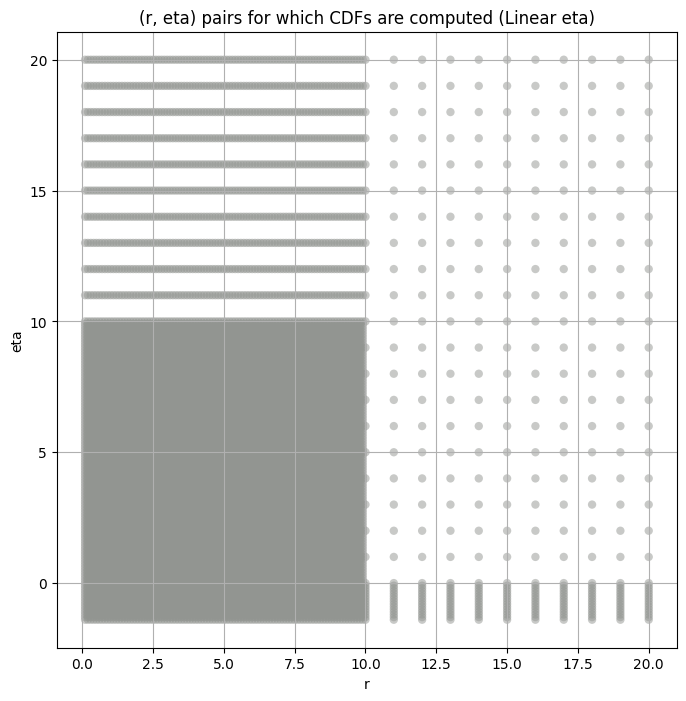

,"(r,eta),cdf",r,eta,cdf,variance,kurtosis
0,"((0.1, -1.4), <scipy.interpolate._fitpack2.Int...",0.1,-1.4,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.628800e+06,554265.000000
1,"((0.1, -1.3), <scipy.interpolate._fitpack2.Int...",0.1,-1.3,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.991680e+07,96192.272727
2,"((0.1, -1.2), <scipy.interpolate._fitpack2.Int...",0.1,-1.2,<scipy.interpolate._fitpack2.InterpolatedUniva...,2.395008e+08,29390.000000
3,"((0.1, -1.1), <scipy.interpolate._fitpack2.Int...",0.1,-1.1,<scipy.interpolate._fitpack2.InterpolatedUniva...,1.037837e+09,11997.692308
4,"((0.1, -1.0), <scipy.interpolate._fitpack2.Int...",0.1,-1.0,<scipy.interpolate._fitpack2.InterpolatedUniva...,3.632429e+09,5874.890110


In [12]:
warnings.filterwarnings('ignore', category=RuntimeWarning)

all_cdfs_df = create_kurt_var_ksstat_df(all_cdfs)
fine_cdfs_df = all_cdfs_df.copy()
all_cdfs_df = all_cdfs_df[(np.round(all_cdfs_df['r'], 1) == all_cdfs_df['r']) & (np.round(all_cdfs_df['eta'], 1) == all_cdfs_df['eta'])]
all_cdfs_df = all_cdfs_df.reset_index(drop=True)
all_cdfs = {x[0] : x[1] for x in all_cdfs_df["(r,eta),cdf"]}
                                             
var_values_dict = dict()
kurt_values_dict = dict()
master_df = pd.DataFrame(columns=[GROUP]).set_index(GROUP)
temp_cdf = all_cdfs_df
print(f"Running {all_cdfs_df.shape[0]} CDFs")
create_scatter_plot(all_cdfs_df);
all_cdfs_df.head()

## Bootstrapping the Variance and Kurtosis

In [13]:
n_bootstrap = int(1e3) # TODO For quick testing purposes
bootstrap_size = int(1e3) # TODO For quick testing purposes
ci = 0.99

In [14]:
bootstrap_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))
master_df_var_kurt_path = Path(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

if True or not master_df_var_kurt_path.exists(): # TODO For quick testing purposes
    for group in GROUPS:
        print(f'{GROUP.capitalize()} {group}: {str(filter_group_map[group])}')
        obs_var, var_lower, var_upper, var_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                n_bootstrap=n_bootstrap, 
                                                                                bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                metric= np.var, 
                                                                                ci=ci)
        obs_kurt, kurt_lower, kurt_upper, kurt_values_dict[group] = bootstrap_metric(group_data_map[group], 
                                                                                    n_bootstrap=n_bootstrap, 
                                                                                    bootstrap_size=min(group_data_map[group].size, bootstrap_size), 
                                                                                    metric= stats.kurtosis, ci=ci)  
        master_df.loc[group, 'obs_var'], master_df.loc[group, 'var_lower'], master_df.loc[group, 'var_upper'] = obs_var, var_lower, var_upper
        master_df.loc[group, 'obs_kurt'], master_df.loc[group, 'kurt_lower'], master_df.loc[group, 'kurt_upper'] = obs_kurt, kurt_lower, kurt_upper
        master_df.loc[group, 'total_samples'] = group_total_samples[group]
        master_df.loc[group, 'filter_group'] = str(filter_group_map[group])

    master_df.to_csv(os.path.join(CWD, "CSVs", f'initial_grid_bootstrap{n_bootstrap}_{bootstrap_size}_ci{ci}.csv'))

master_df = pd.read_csv(master_df_var_kurt_path, index_col=GROUP)
var_kurt_df = pd.read_csv(bootstrap_path, index_col=GROUP)
master_df

Filter_idx 0: (2.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 1: (2.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 2: (2.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 3: (2.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 4: (2.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 5: (2.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 6: (2.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 7: (2.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 8: (2.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 9: (2.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 10: (2.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 11: (2.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 12: (2.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 13: (2.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 14: (3.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 15: (3.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 16: (3.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 17: (3.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 18: (3.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 19: (3.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 20: (3.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 21: (3.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 22: (3.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 23: (3.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 24: (3.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 25: (3.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 26: (3.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 27: (3.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 28: (4.0, 0.5, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 29: (4.0, 0.5, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 30: (4.0, 0.5, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 31: (4.0, 0.5, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 32: (4.0, 0.5, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 33: (4.0, 0.5, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 34: (4.0, 0.5, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 35: (4.0, 1.0, 0.044)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 36: (4.0, 1.0, 0.065)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 37: (4.0, 1.0, 0.096)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 38: (4.0, 1.0, 0.141)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 39: (4.0, 1.0, 0.208)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 40: (4.0, 1.0, 0.306)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Filter_idx 41: (4.0, 1.0, 0.45)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group
filter_idx,,,,,,,,
0,19.512732,16.061955,24.352984,3.693593,1.240120,35.557062,49152000.0,"(2.0, 0.5, 0.044)"
1,7.825587,6.293173,9.732981,4.648551,1.371346,44.666126,49152000.0,"(2.0, 0.5, 0.065)"
2,3.203549,2.597087,5.412916,11.848032,1.800651,175.540741,49152000.0,"(2.0, 0.5, 0.096)"
3,1.299067,1.008325,3.309371,37.190033,2.062645,367.029021,49152000.0,"(2.0, 0.5, 0.141)"
4,0.503130,0.377765,1.474419,47.714934,2.424145,425.693656,49152000.0,"(2.0, 0.5, 0.208)"
5,0.177674,0.138656,0.550852,60.899960,1.386832,471.200153,49152000.0,"(2.0, 0.5, 0.306)"
6,0.120857,0.095208,0.387114,62.225351,0.975672,487.250214,49152000.0,"(2.0, 0.5, 0.45)"
7,25.326290,21.284981,32.067659,3.715394,1.112378,41.577878,49152000.0,"(2.0, 1.0, 0.044)"
8,10.787103,8.884289,13.944638,4.497917,1.434039,37.939142,49152000.0,"(2.0, 1.0, 0.065)"


## Initial Grid Search and Hypothesis Test Plots

In [15]:
EXCLUDE_CUTOFFS = [0, 50, 100, 200] # TODO For quick testing purposes
SCALE_CAP = 1e5

In [16]:
augmented_var_df_path = Path(os.path.join(CWD, "CSVs", "augmented_var_df.csv"))
augmented_var_df = var_kurt_df[['obs_var']].copy()
augmented_var_df
for val in EXCLUDE_CUTOFFS:
    temp_arr = []
    for group in GROUPS:
        if val != 0:
            temp_arr.append(np.var(group_data_map[group][val:-val]))
        else:
            temp_arr.append(np.var(group_data_map[group]))

    augmented_var_df[f"var_exclude_{val}"] = temp_arr
augmented_var_df

,obs_var,var_exclude_0,var_exclude_50,var_exclude_100,var_exclude_200
filter_idx,,,,,
0,19.512732,19.512732,18.856352,18.459433,17.840650
1,7.825587,7.825587,7.524350,7.353009,7.089119
2,3.203549,3.203549,3.031249,2.951978,2.833297
3,1.299067,1.299067,1.203914,1.167903,1.115397
4,0.503130,0.503130,0.462242,0.447244,0.425771
5,0.177674,0.177674,0.162761,0.157862,0.150899
6,0.120857,0.120857,0.111540,0.108597,0.104406
7,25.326290,25.326290,24.460107,23.952860,23.161938
8,10.787103,10.787103,10.377395,10.137514,9.767512


####
Filter_idx, 0: (2.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 0 0.030190415604448018 19.51273169190206


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 50 0.030191106956714564 18.856352086984064


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 100 0.03019069058559043 18.459432583075778


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
0 200 0.030190669088198285 17.840649656804754
Number of samples: 100000, Without approximation : 49152000.0


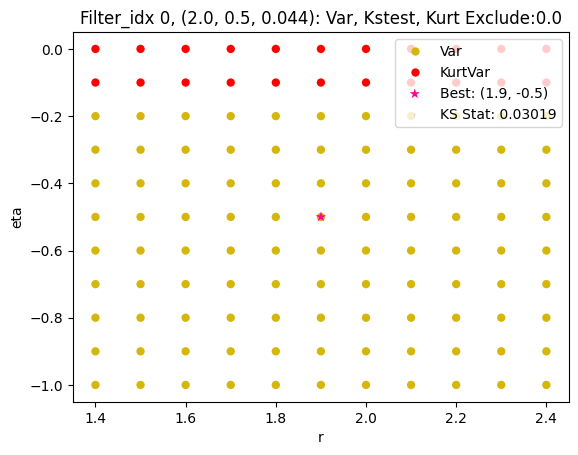

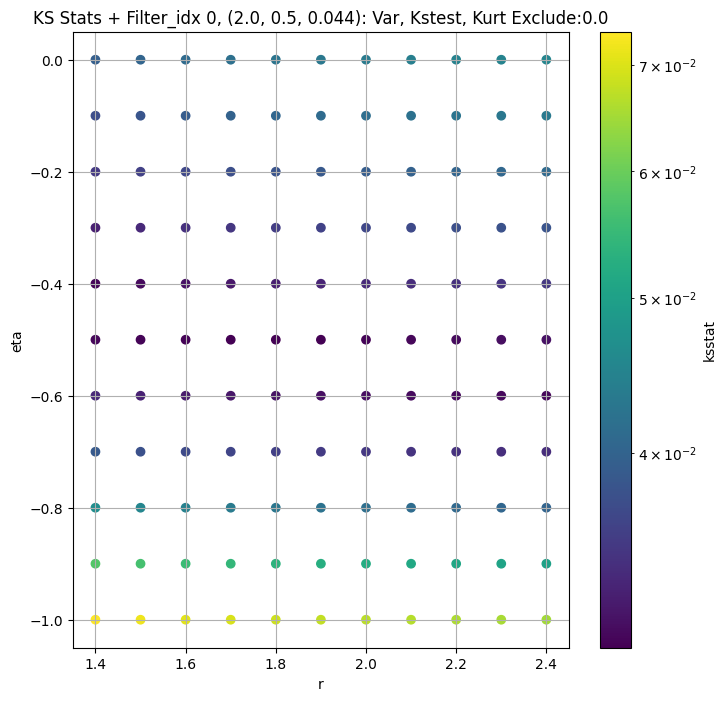

####
Filter_idx, 1: (2.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 0 0.024722612496237473 7.825586861621166


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 50 0.024723582149826562 7.524350223821941


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 100 0.02472447533478145 7.353008959233777


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
1 200 0.024728307564903296 7.089118847112341
Number of samples: 100000, Without approximation : 49152000.0


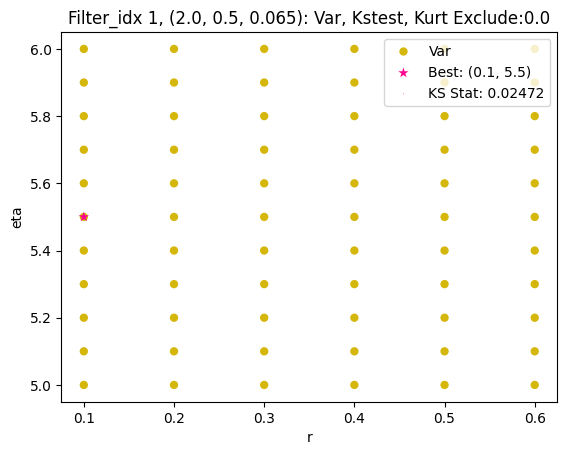

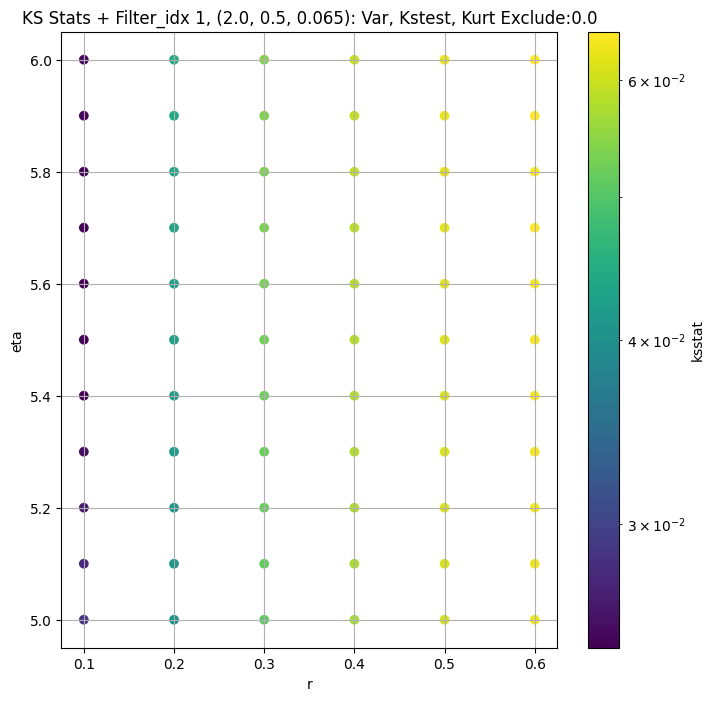

####
Filter_idx, 2: (2.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 0 0.01630752149868958 3.203549148034639


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 50 0.01629737670359266 3.0312486727942765


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 100 0.016304630140561494 2.951977865829194


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
2 200 0.016299156752521582 2.8332971205705872
Number of samples: 100000, Without approximation : 49152000.0


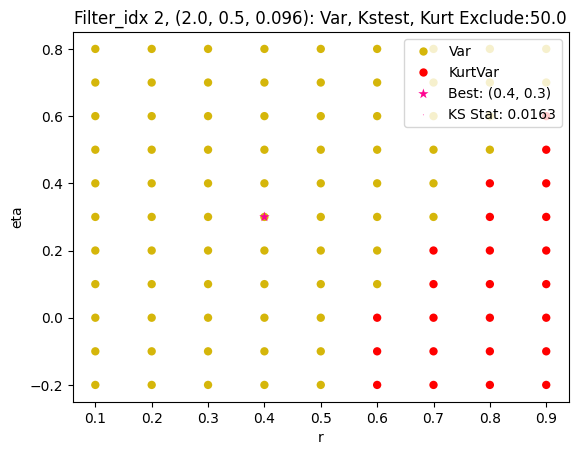

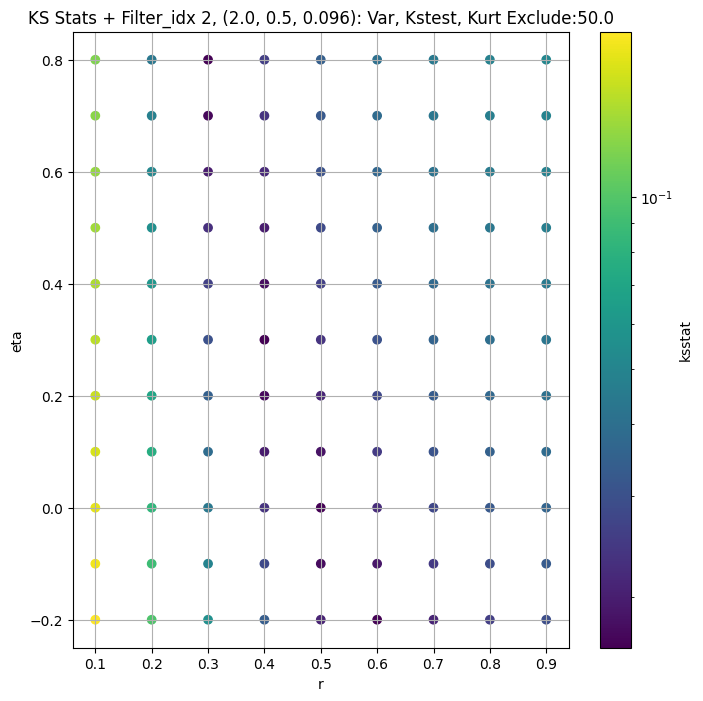

####
Filter_idx, 3: (2.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 0 0.008241261367192054 1.2990670284540071


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 50 0.008784086236345856 1.2039144811577924


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 100 0.008675088936927478 1.1679027468152403


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
3 200 0.009299085194429235 1.1153974076055024
Number of samples: 100000, Without approximation : 49152000.0


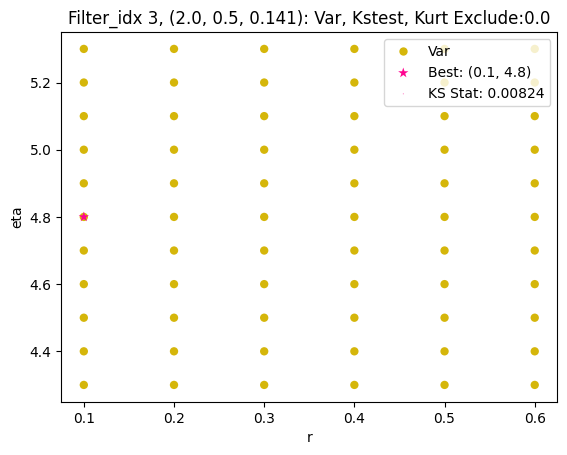

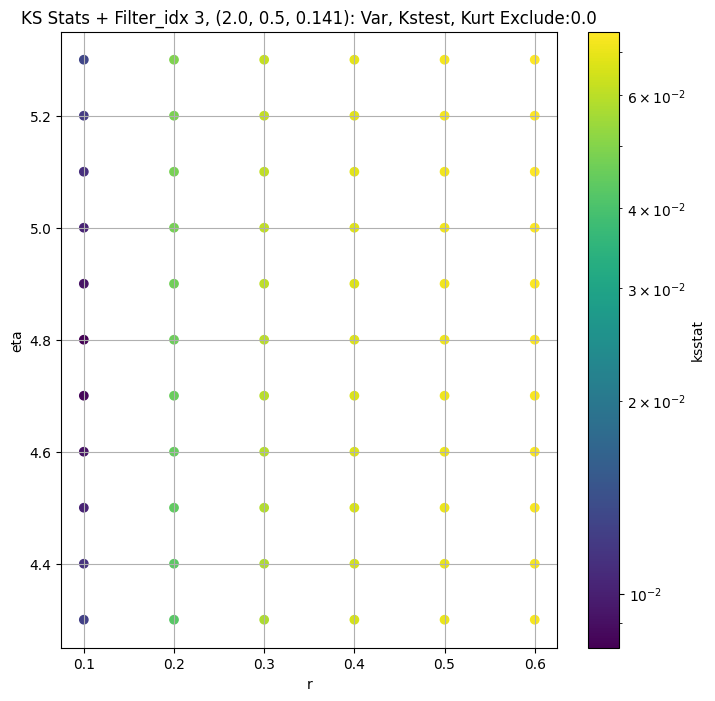

####
Filter_idx, 4: (2.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 0 0.006112756562296817 0.5031300679017542


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 50 0.004754628702986707 0.46224196986041827


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 100 0.005033525904532987 0.4472438249523025


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
4 200 0.005843123693738961 0.42577096325742214
Number of samples: 100000, Without approximation : 49152000.0


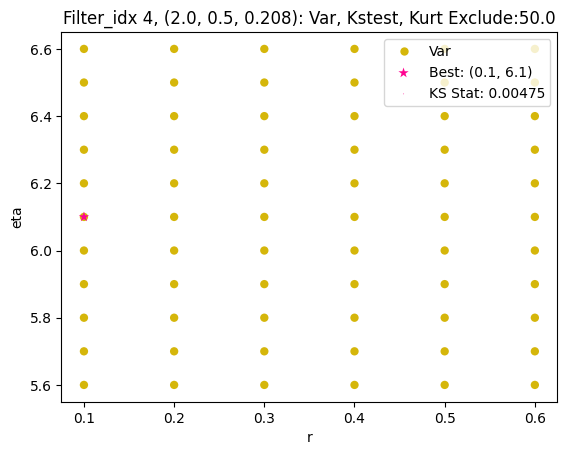

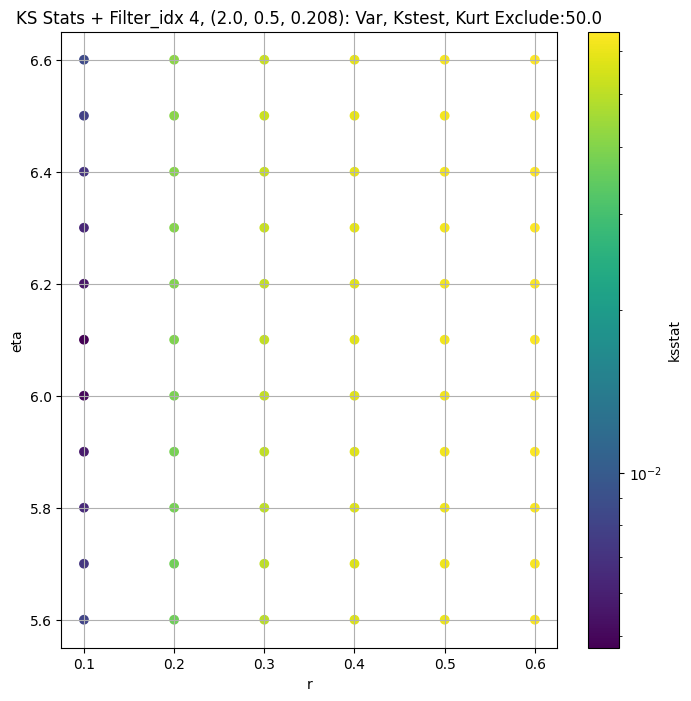

####
Filter_idx, 5: (2.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 0 0.009303297722453308 0.1776740383436319


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 50 0.0072757382247974345 0.16276086097659376


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 100 0.006551897264737039 0.15786156341857932


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
5 200 0.00531862137875827 0.15089864983797194
Number of samples: 100000, Without approximation : 49152000.0


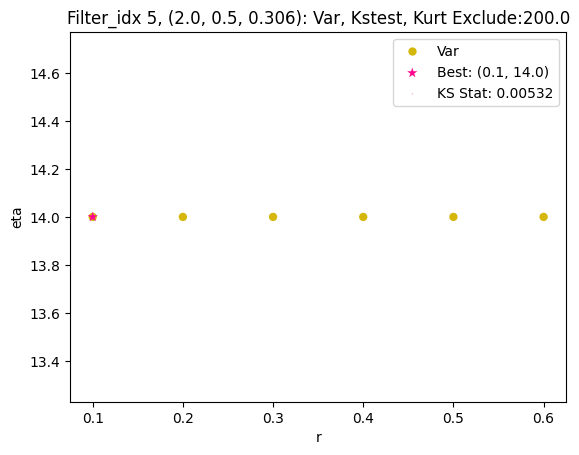

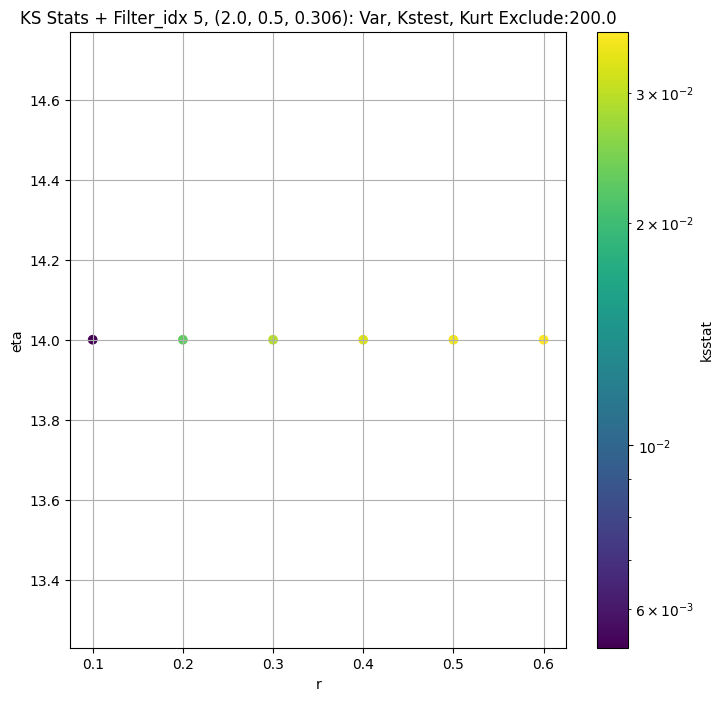

####
Filter_idx, 6: (2.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 0 0.010270827596431498 0.12085662617086837


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 50 0.007778630767519279 0.11153970280578282


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 100 0.007136491819613955 0.10859740867395025


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
6 200 0.005941002577194876 0.10440644827934016
Number of samples: 100000, Without approximation : 49152000.0


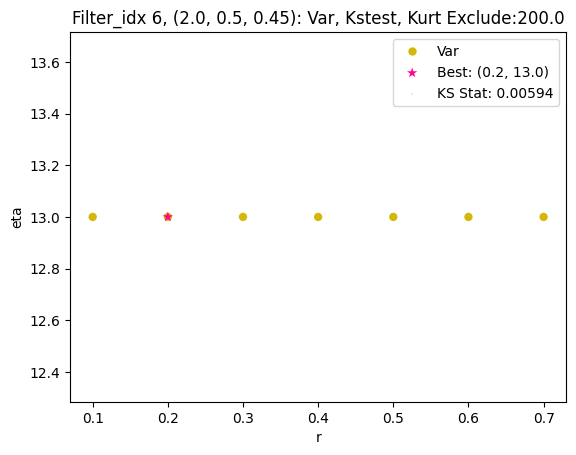

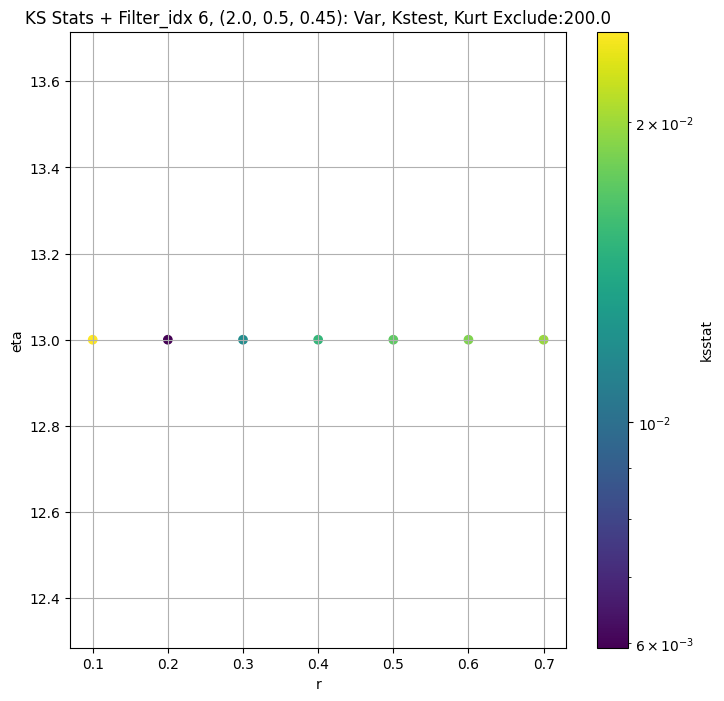

####
Filter_idx, 7: (2.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 0 0.02793456223016899 25.326290085208893


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 50 0.027933289095221303 24.46010682409661


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 100 0.027932945756633187 23.952859747566528


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
7 200 0.027933949952615333 23.161937587221757
Number of samples: 100000, Without approximation : 49152000.0


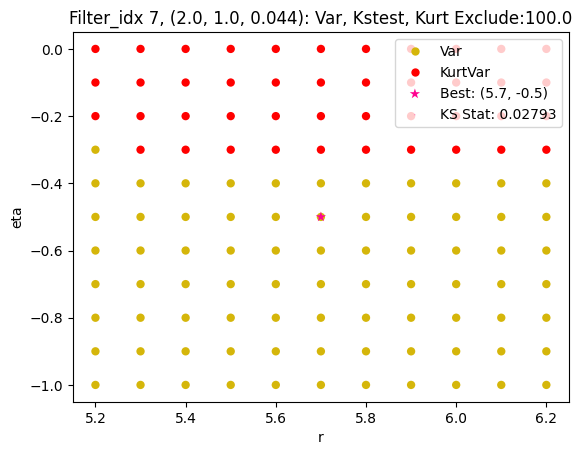

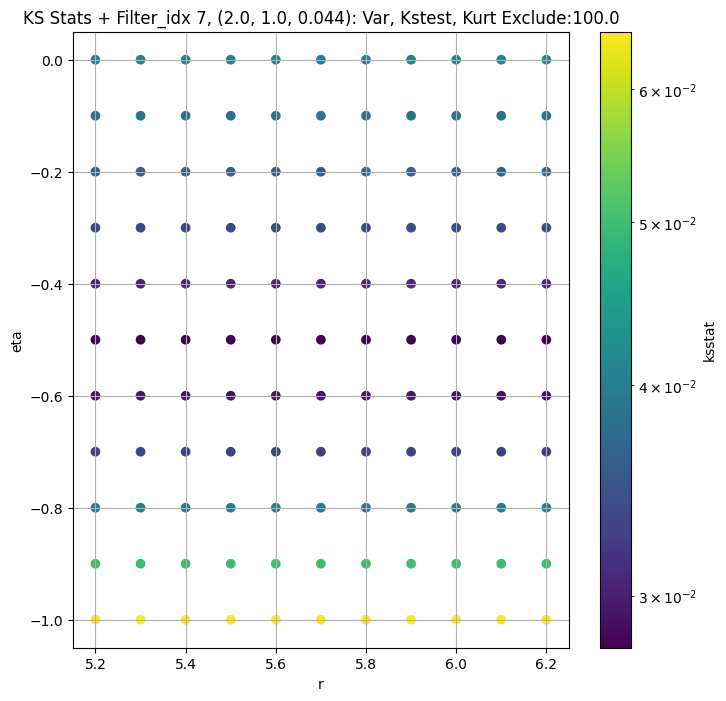

####
Filter_idx, 8: (2.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 0 0.024674764737656618 10.787103433829865


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 50 0.024674140873954642 10.377394526955955


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 100 0.02467351360960135 10.137513751878934


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
8 200 0.024671326751502354 9.76751239587234
Number of samples: 100000, Without approximation : 49152000.0


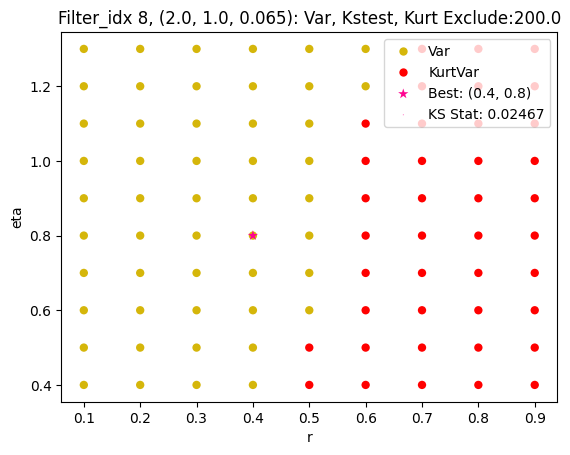

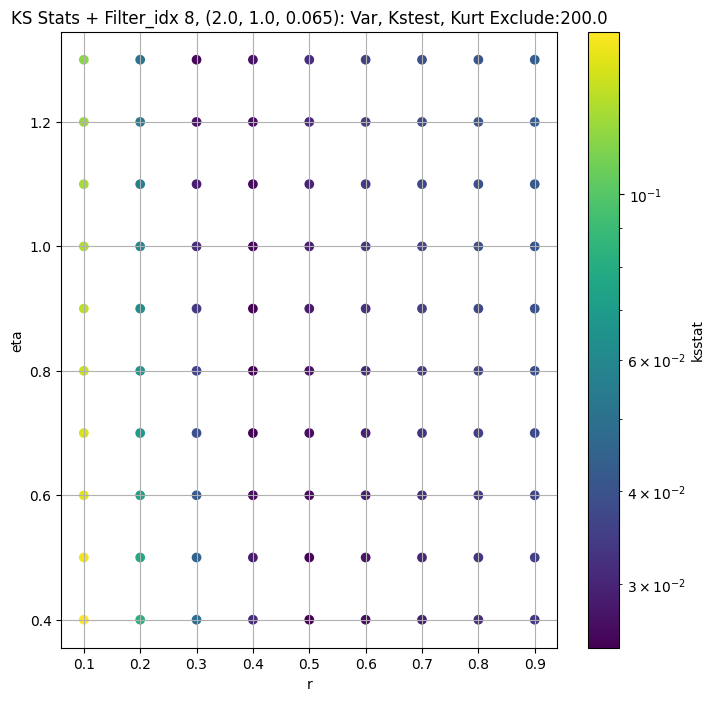

####
Filter_idx, 9: (2.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 0 0.02002340244272305 4.270451682142163


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 50 0.020026278247979035 4.0689782778834065


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 100 0.020025755630080577 3.9628982651624036


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
9 200 0.02002410508146013 3.803362599616405
Number of samples: 100000, Without approximation : 49152000.0


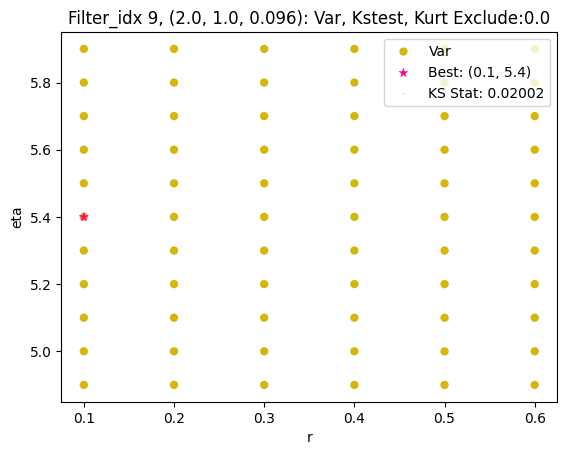

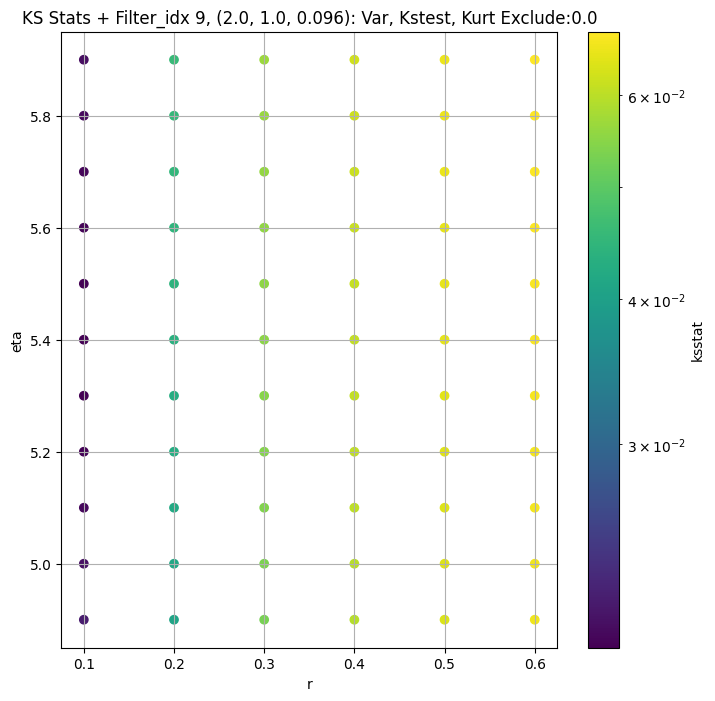

####
Filter_idx, 10: (2.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 0 0.011859932487049474 1.7679233622501918


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 50 0.011845701386548224 1.6589762596910793


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 100 0.01185036459976102 1.6111975724691878


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
10 200 0.011856163687416266 1.54046163359818
Number of samples: 100000, Without approximation : 49152000.0


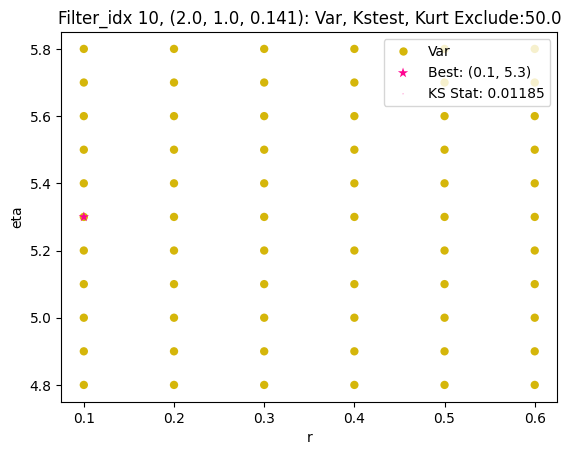

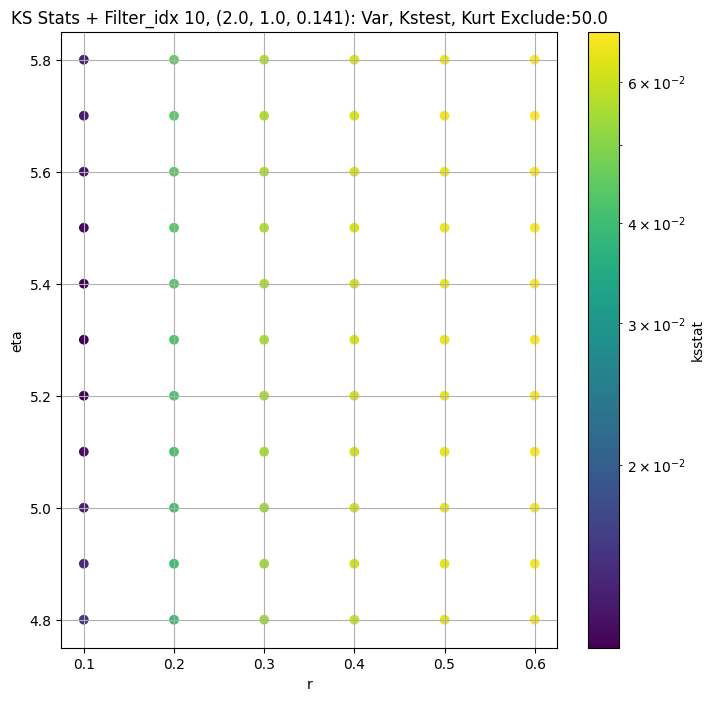

####
Filter_idx, 11: (2.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 0 0.006129614760624569 0.696641026708459


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 50 0.005512790486800534 0.6431628285223456


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 100 0.0058036039569617365 0.6224124602941121


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
11 200 0.005809954408875065 0.5923919976317067
Number of samples: 100000, Without approximation : 49152000.0


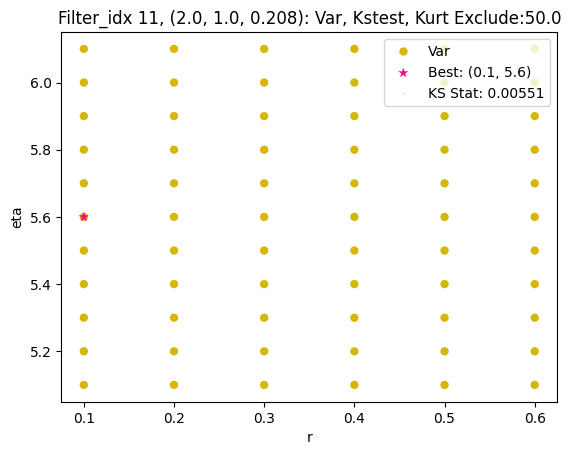

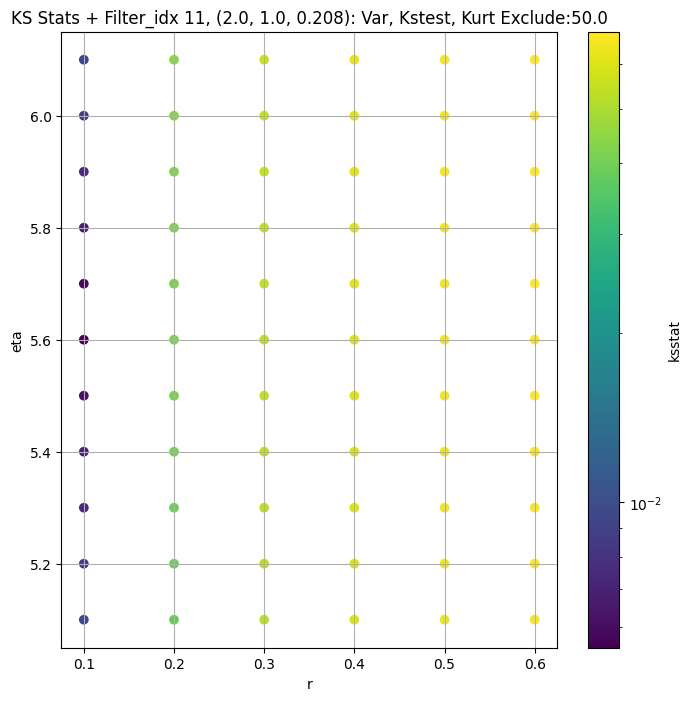

####
Filter_idx, 12: (2.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 0 0.006738932307850387 0.25881044050773483


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 50 0.004706053424993917 0.23850698899554745


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 100 0.004061712642192239 0.23093576299769916


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
12 200 0.004168374793411034 0.22005301693870086
Number of samples: 100000, Without approximation : 49152000.0


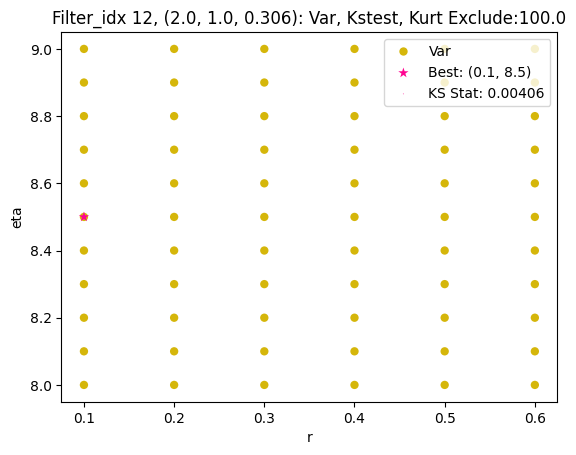

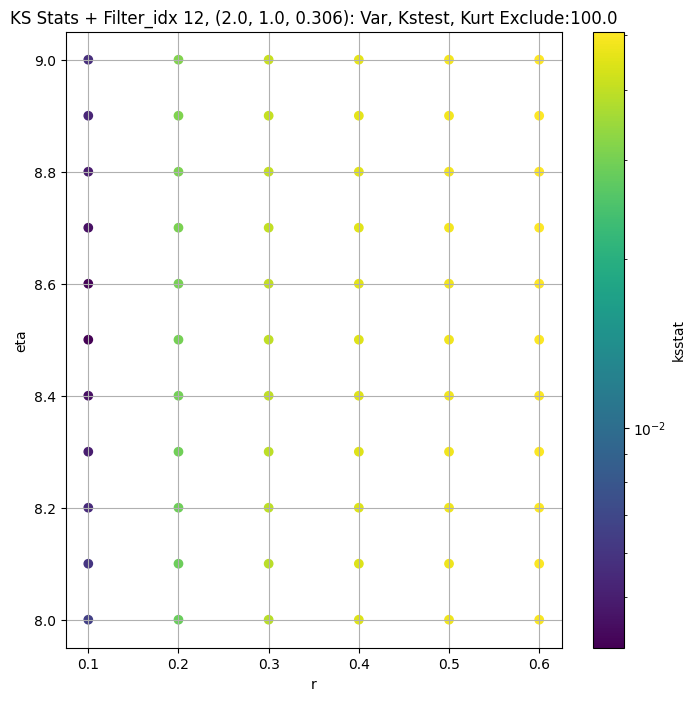

####
Filter_idx, 13: (2.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 0 0.009256668994582884 0.12159432206300724


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 50 0.0060622300874549895 0.11162579897944898


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 100 0.005238544721543836 0.10858437372063412


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
13 200 0.0040462472770206315 0.1042580340639234
Number of samples: 100000, Without approximation : 49152000.0


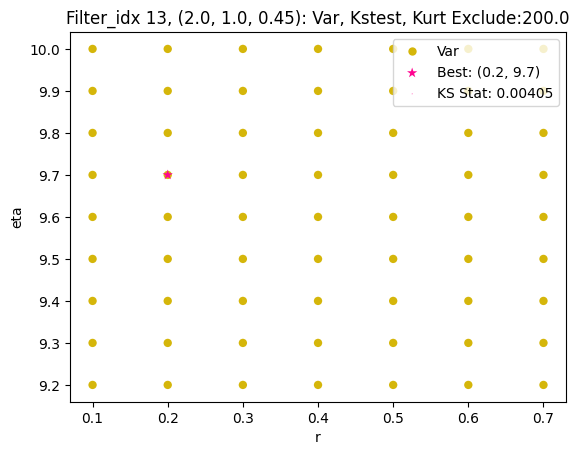

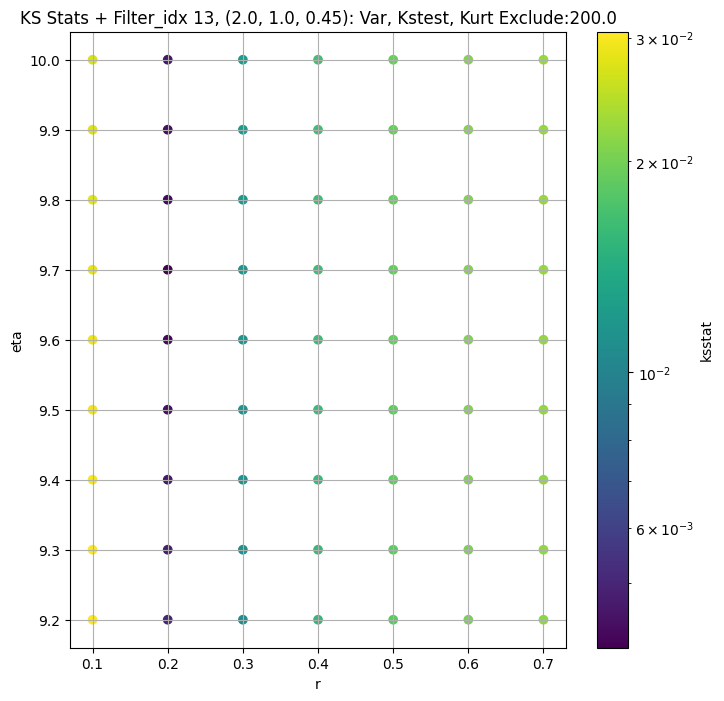

####
Filter_idx, 14: (3.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 0 0.006358742568870479 19.82260432902438


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 50 0.0062128935131049445 19.090899911039056


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 100 0.006116727391192733 18.666445076219286


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
14 200 0.006076672320588283 18.008702428672475
Number of samples: 100000, Without approximation : 49152000.0


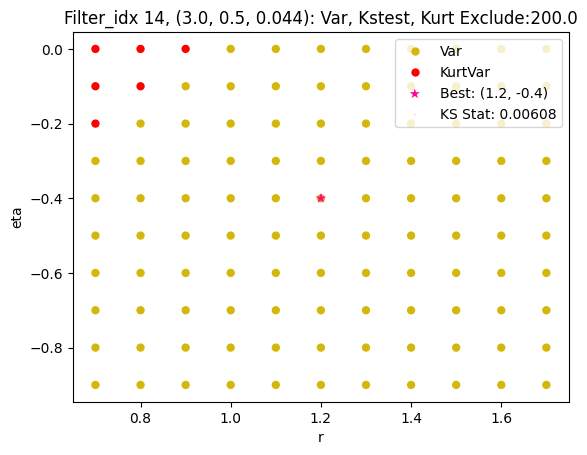

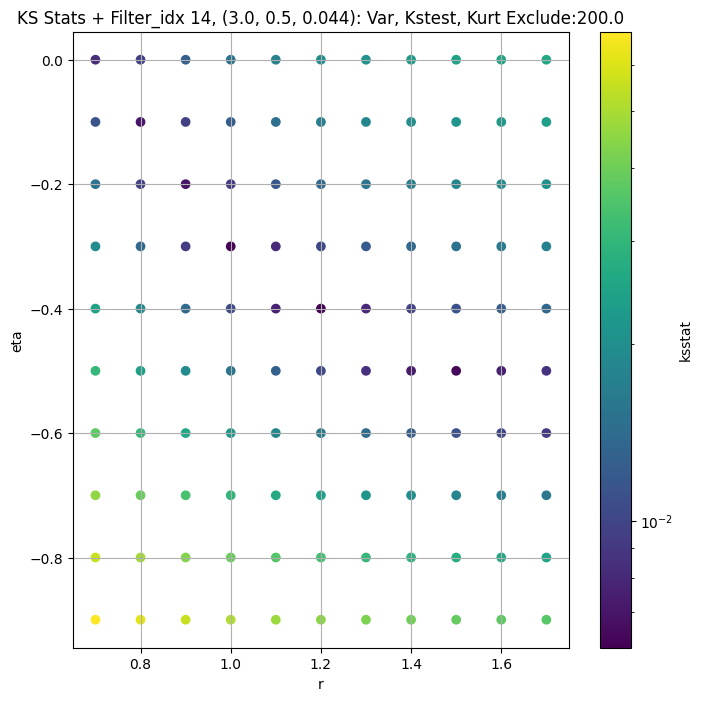

####
Filter_idx, 15: (3.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 0 0.0045360279477741905 7.9516467814857625


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 50 0.004088820737323695 7.624329544006402


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 100 0.004908463919675143 7.439502291737429


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
15 200 0.005097692657638819 7.1568826489729
Number of samples: 100000, Without approximation : 49152000.0


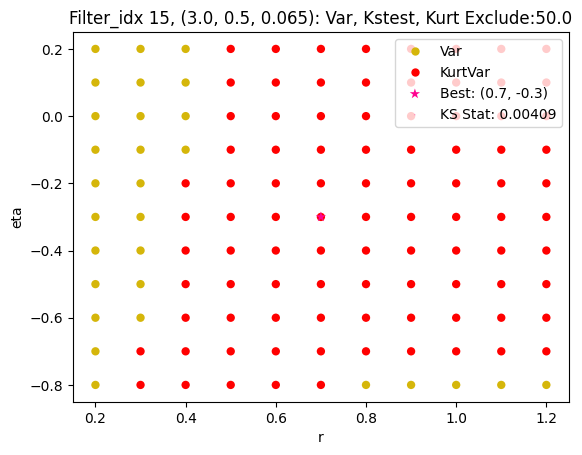

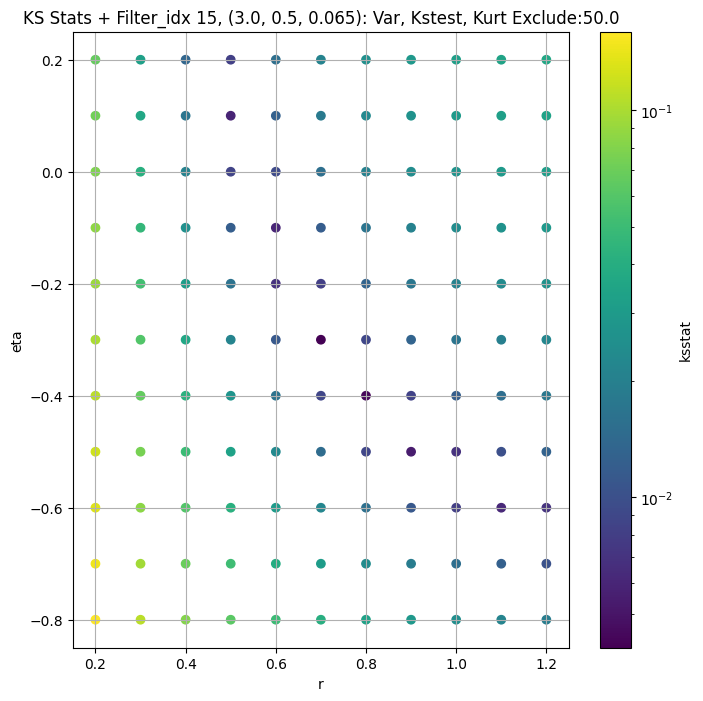

####
Filter_idx, 16: (3.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 0 0.0037098627063499867 3.075412676529183


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 50 0.004755787777760687 2.909704063967755


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 100 0.005261276613612309 2.828302960790587


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
16 200 0.0052894734789049325 2.7063937990849083
Number of samples: 100000, Without approximation : 49152000.0


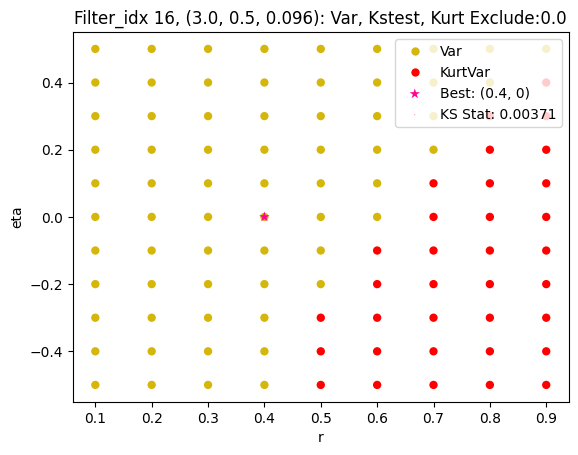

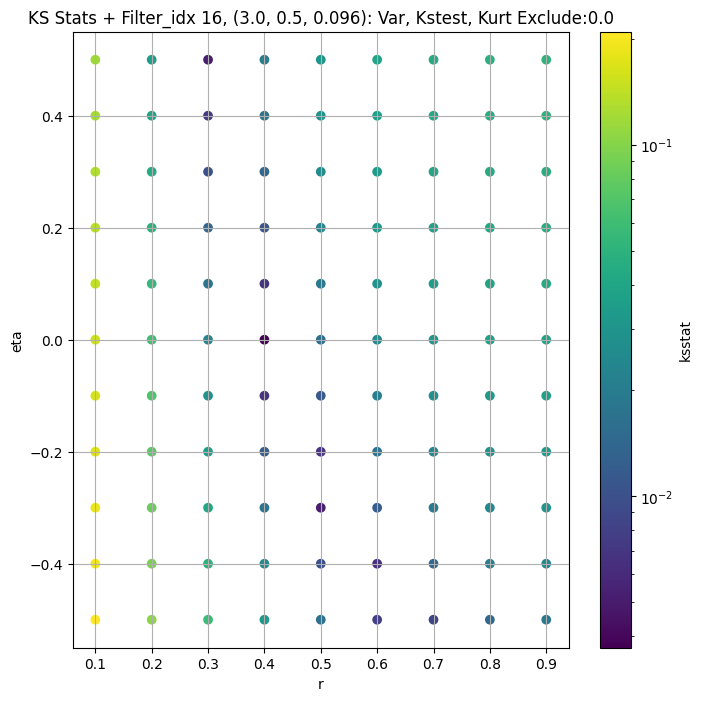

####
Filter_idx, 17: (3.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 0 0.0027846101572504 1.225489089803893


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 50 0.003935951088694822 1.1396812488430441


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 100 0.005065864668433728 1.104357015773784


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
17 200 0.005510888143463011 1.0523903490691964
Number of samples: 100000, Without approximation : 49152000.0


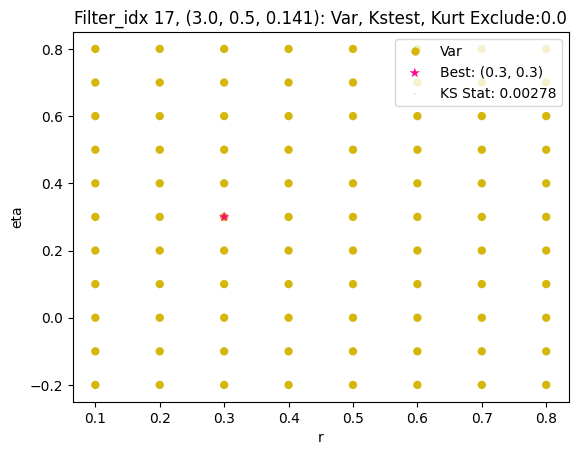

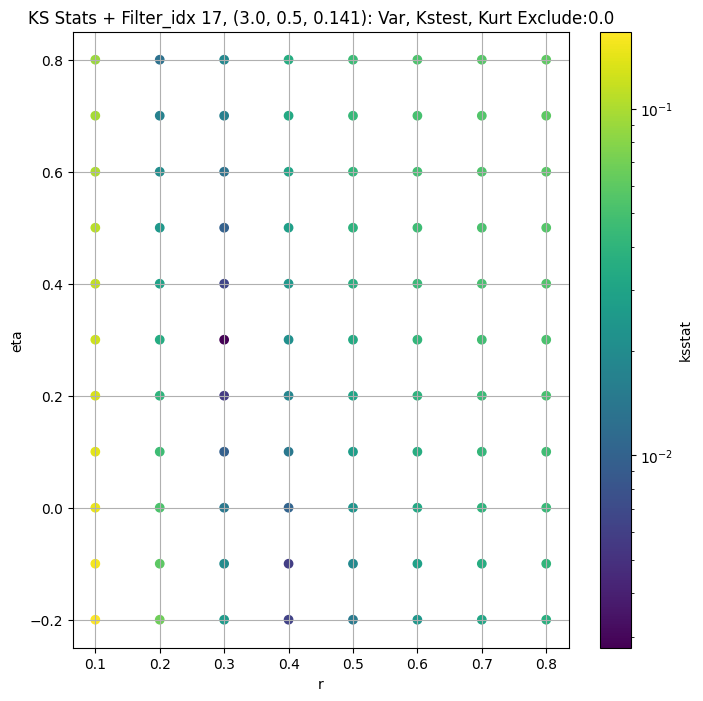

####
Filter_idx, 18: (3.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 0 0.0038581061194710164 0.47897229005546726


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 50 0.0038299521544084003 0.44407115311639966


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 100 0.004387875946999575 0.4291869390148842


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
18 200 0.00565435532649472 0.4076126745585877
Number of samples: 100000, Without approximation : 49152000.0


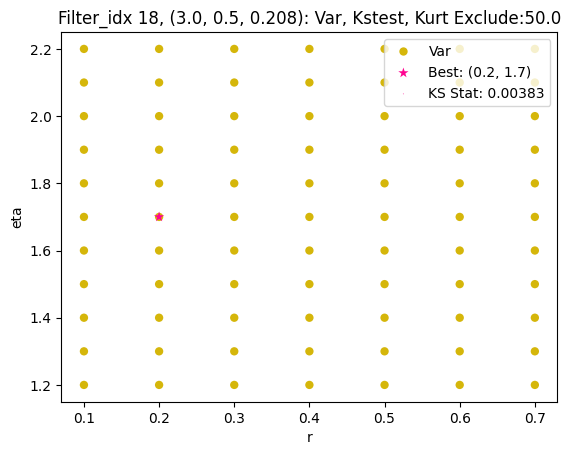

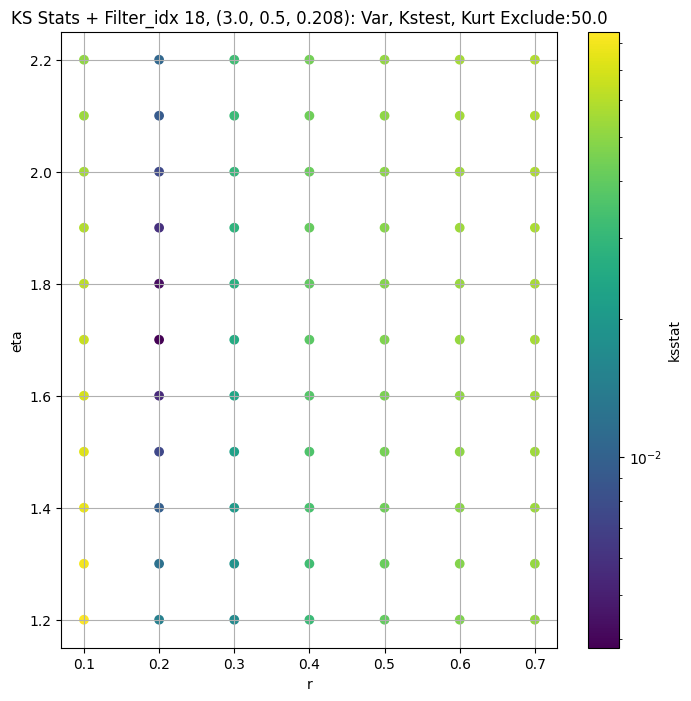

####
Filter_idx, 19: (3.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 0 0.00675433194019992 0.1772315965335748


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 50 0.004164174519851849 0.16272205734348252


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 100 0.00338157858627941 0.1574229387129078


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
19 200 0.0038699337753589844 0.14986509876893245
Number of samples: 100000, Without approximation : 49152000.0


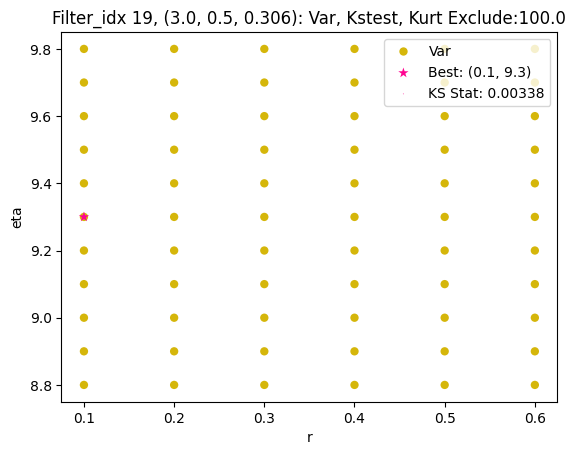

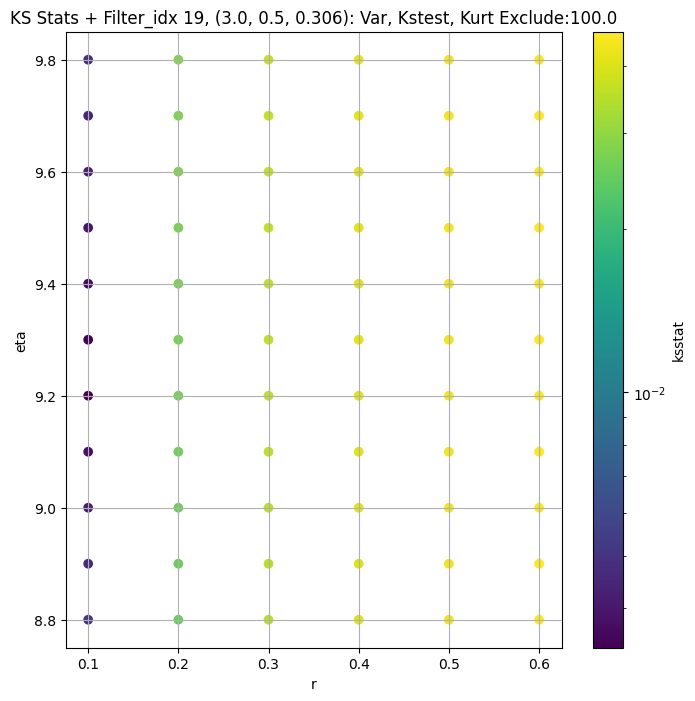

####
Filter_idx, 20: (3.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 0 0.00624672108566382 0.08570074169810339


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 50 0.0033471215401359444 0.0796433180185848


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 100 0.002587965743487519 0.07785279060585949


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
20 200 0.0030766275792177833 0.07526575826156831
Number of samples: 100000, Without approximation : 49152000.0


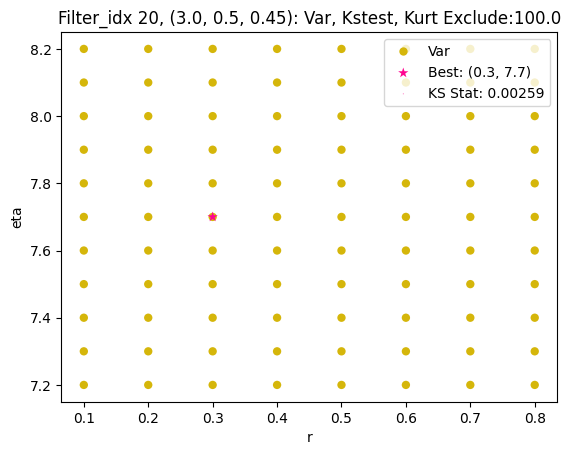

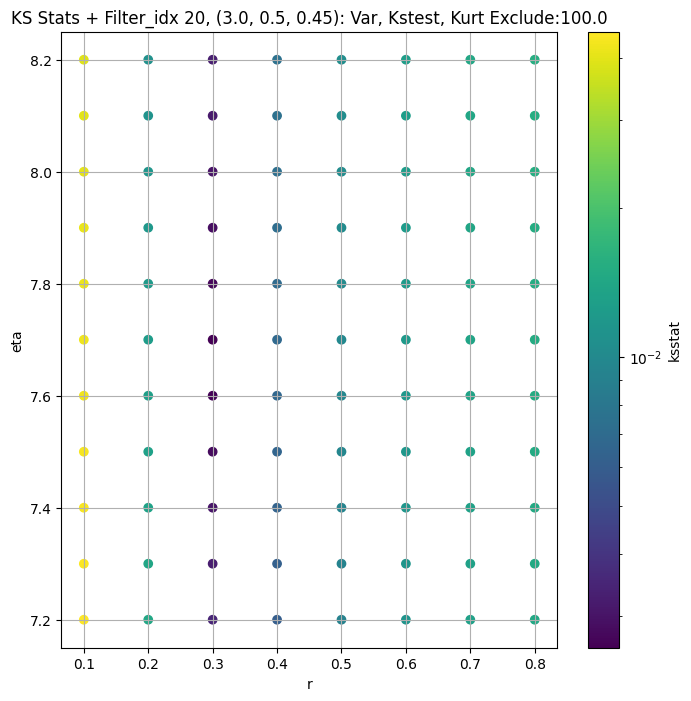

####
Filter_idx, 21: (3.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 0 0.0063058622062723835 23.260608512645597


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 50 0.0062338298932297365 22.458346825546453


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 100 0.006363045934679623 21.96104980244969


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
21 200 0.006336182650806599 21.192625785207753
Number of samples: 100000, Without approximation : 49152000.0


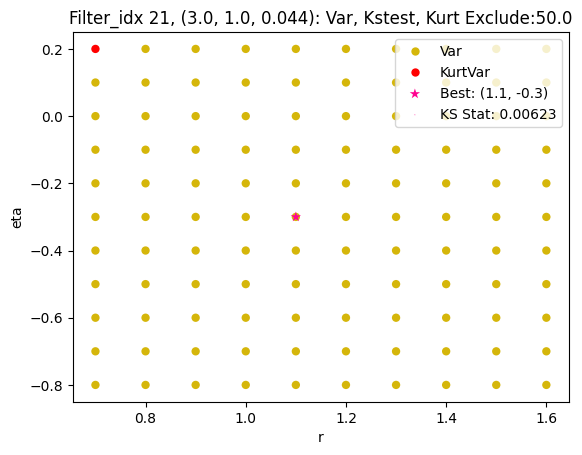

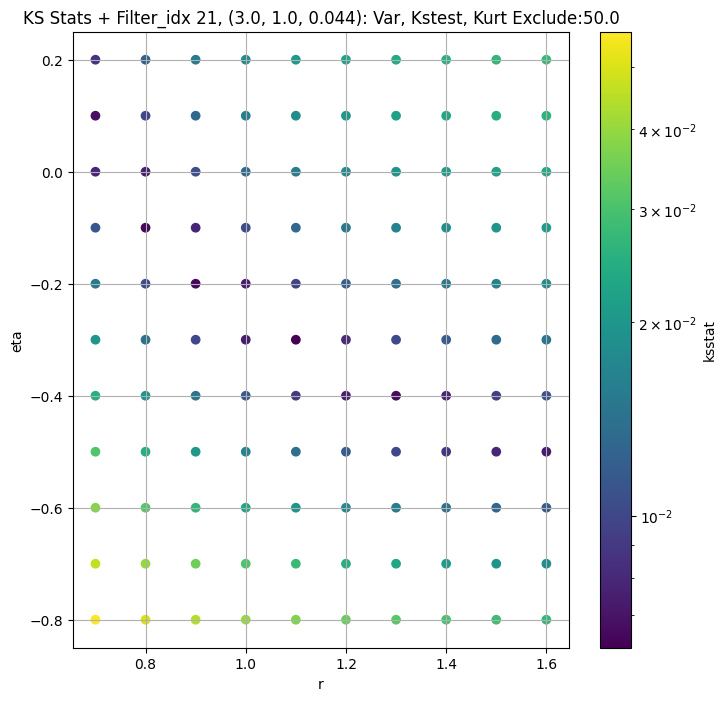

####
Filter_idx, 22: (3.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 0 0.005690478252652009 9.245448100973675


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 50 0.005657164564746964 8.866569731170973


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 100 0.005553190589305423 8.653989932987384


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
22 200 0.0057643463313539756 8.326465897508202
Number of samples: 100000, Without approximation : 49152000.0


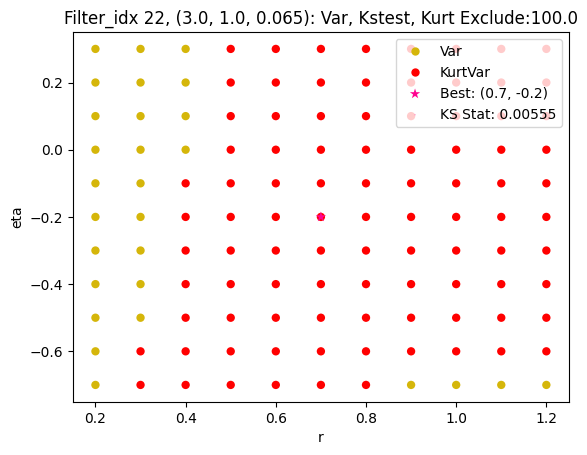

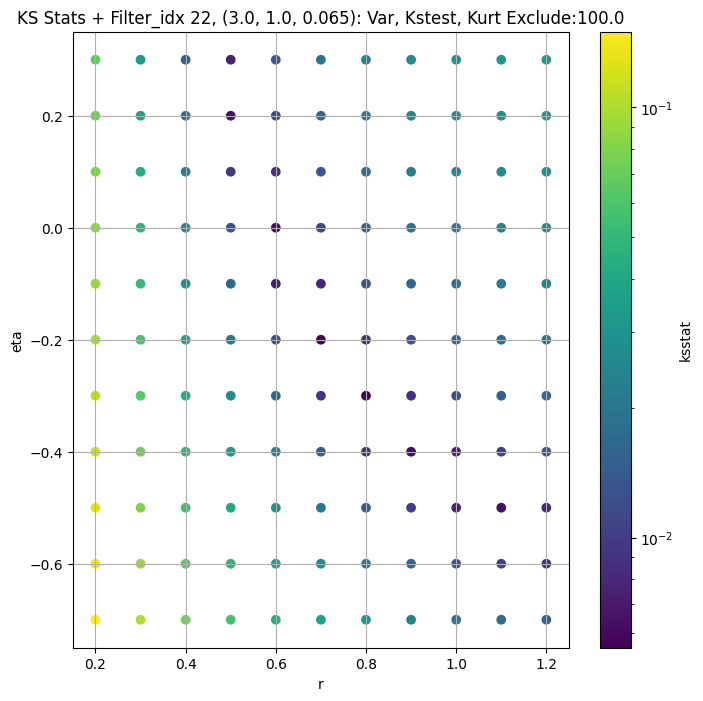

####
Filter_idx, 23: (3.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 0 0.004994093742868494 3.6389461351802423


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 50 0.005265068073375012 3.4447921821025855


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 100 0.0043523232563497105 3.3494677753085416


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
23 200 0.005110342309212923 3.2057854351671082
Number of samples: 100000, Without approximation : 49152000.0


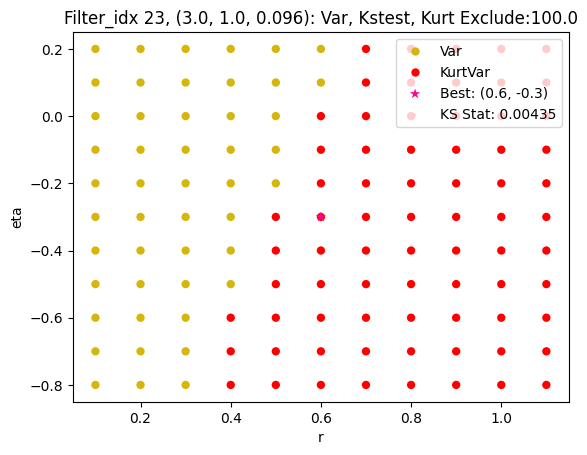

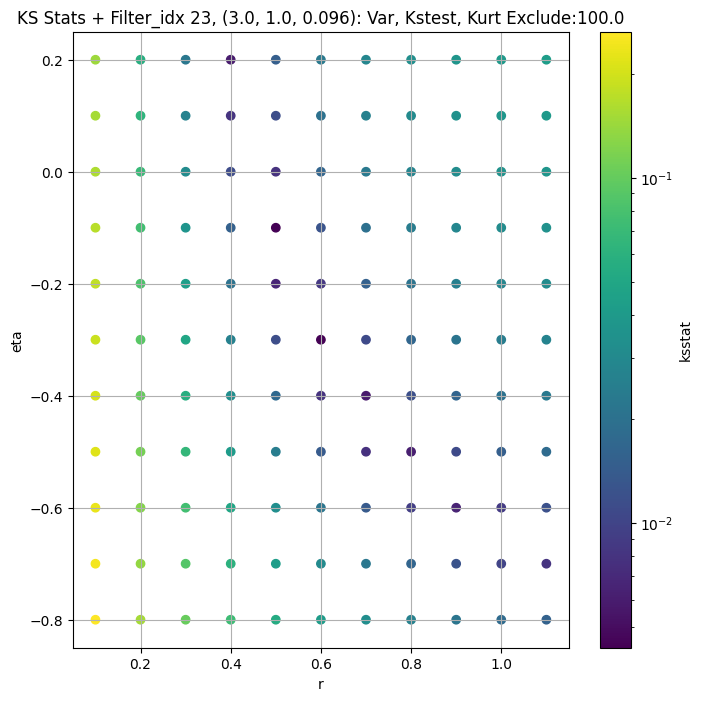

####
Filter_idx, 24: (3.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 0 0.0032402363962419356 1.4474482022464124


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 50 0.003937951192971287 1.3490742242351663


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 100 0.004237095548401279 1.3054143679553774


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
24 200 0.005124043513493125 1.2413873187454214
Number of samples: 100000, Without approximation : 49152000.0


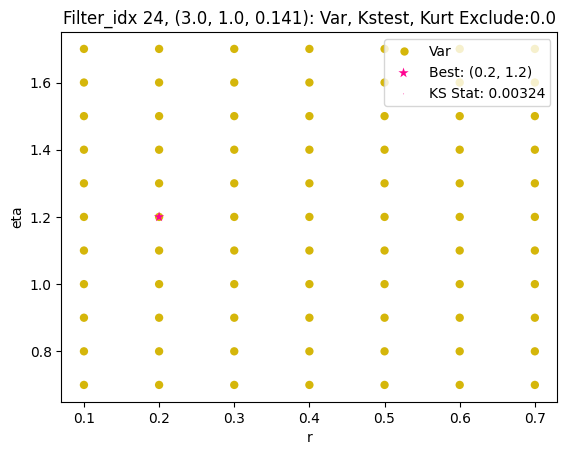

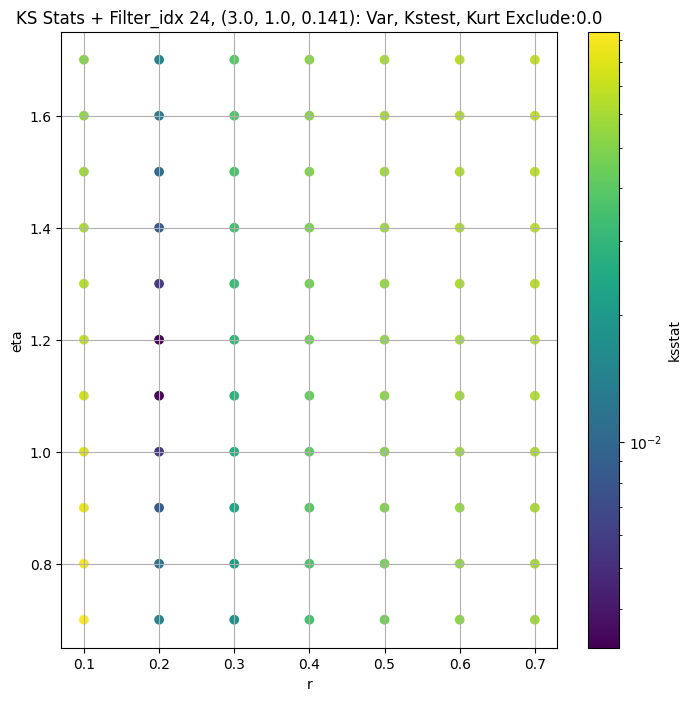

####
Filter_idx, 25: (3.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 0 0.004720847924838345 0.5596448873863831


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 50 0.0035670559144653016 0.5109550315425831


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 100 0.004222315553845668 0.49258832199607244


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
25 200 0.0054151650326829115 0.4659090910744702
Number of samples: 100000, Without approximation : 49152000.0


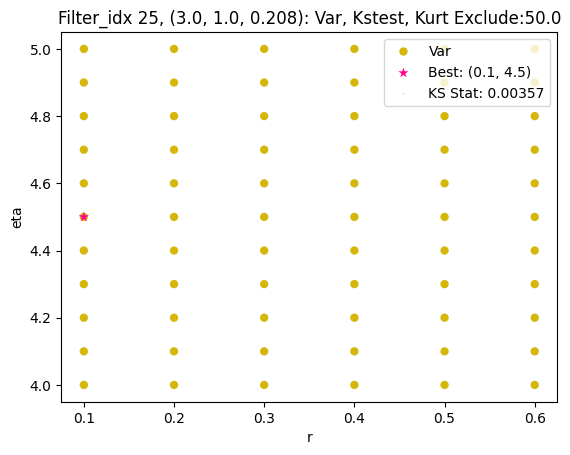

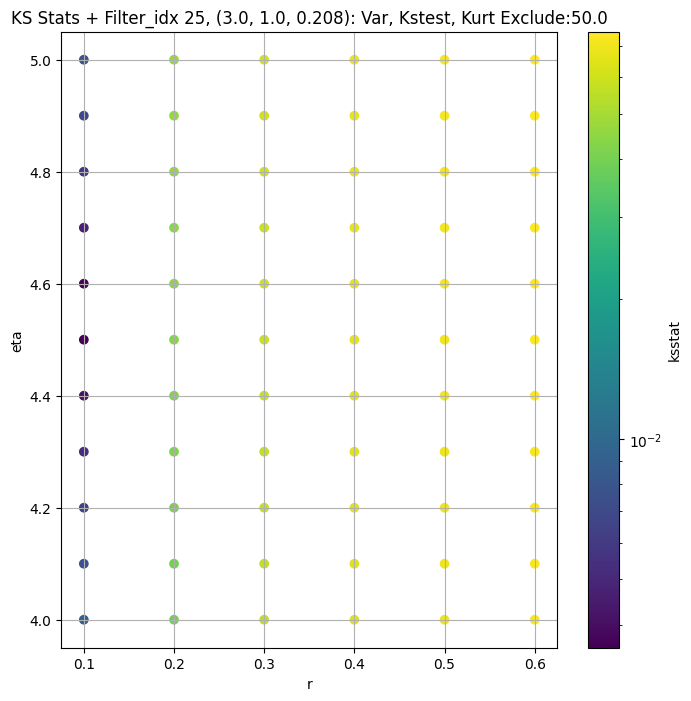

####
Filter_idx, 26: (3.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 0 0.006992803111491308 0.21041808005937068


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 50 0.004510028115198961 0.1935304668830299


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 100 0.0037117623548240664 0.18680000177645983


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
26 200 0.004074380113583562 0.17712178938002415
Number of samples: 100000, Without approximation : 49152000.0


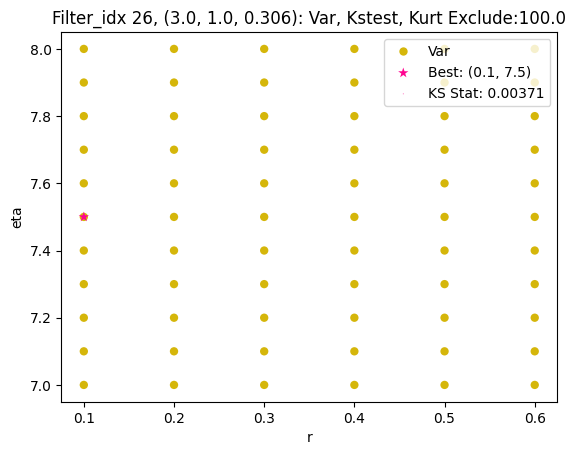

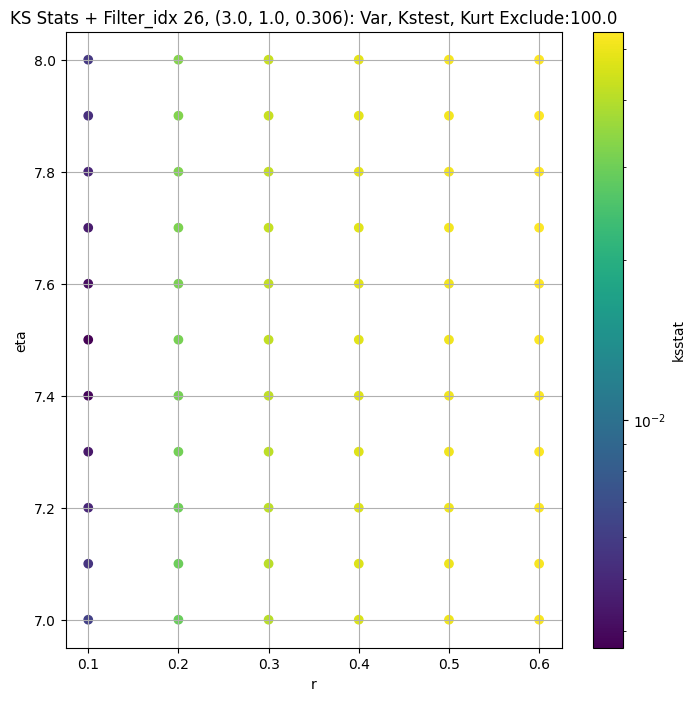

####
Filter_idx, 27: (3.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 0 0.005483519132980952 0.09246518391994601


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 50 0.002616799294719696 0.08603638842988356


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 100 0.0020158686994140584 0.08392433565445144


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
27 200 0.003018020970213975 0.08085715981294186
Number of samples: 100000, Without approximation : 49152000.0


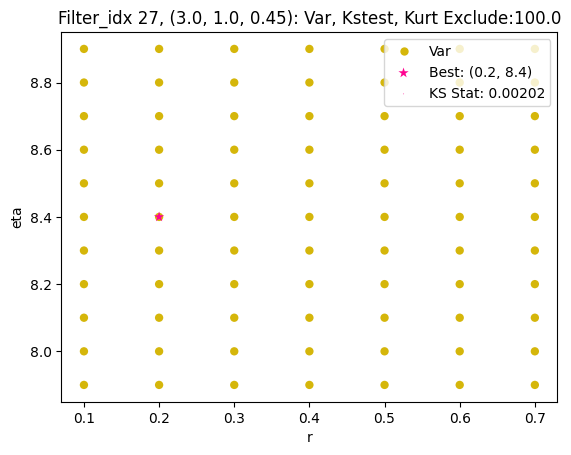

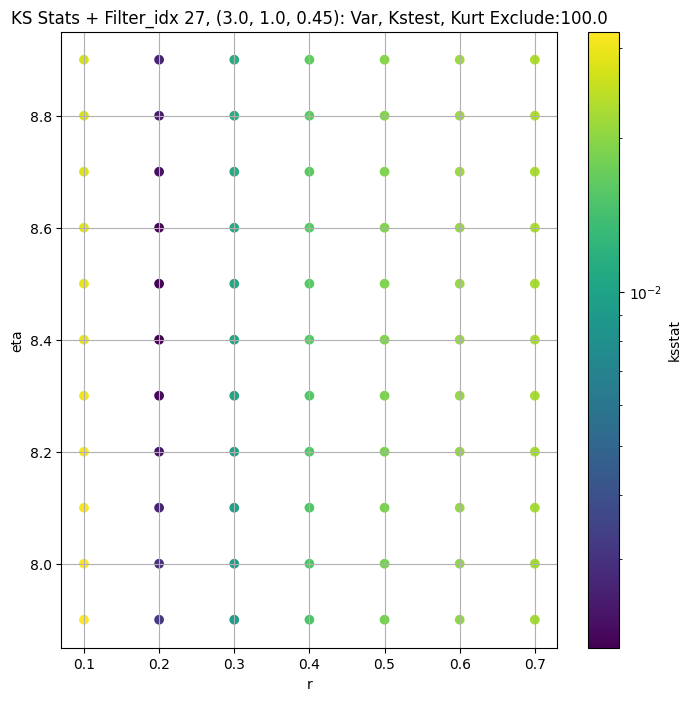

####
Filter_idx, 28: (4.0, 0.5, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 0 0.0015094500015345735 19.823137239047107


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 50 0.001422193115071843 19.14914238930627


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 100 0.0020543386052273016 18.733896738757064


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
28 200 0.0033664410308356096 18.090281551422024
Number of samples: 100000, Without approximation : 49152000.0


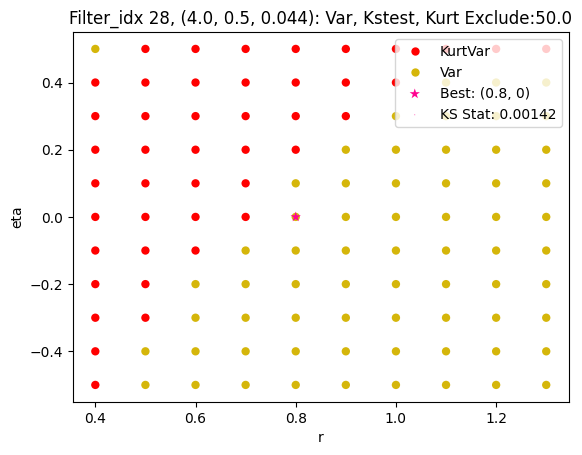

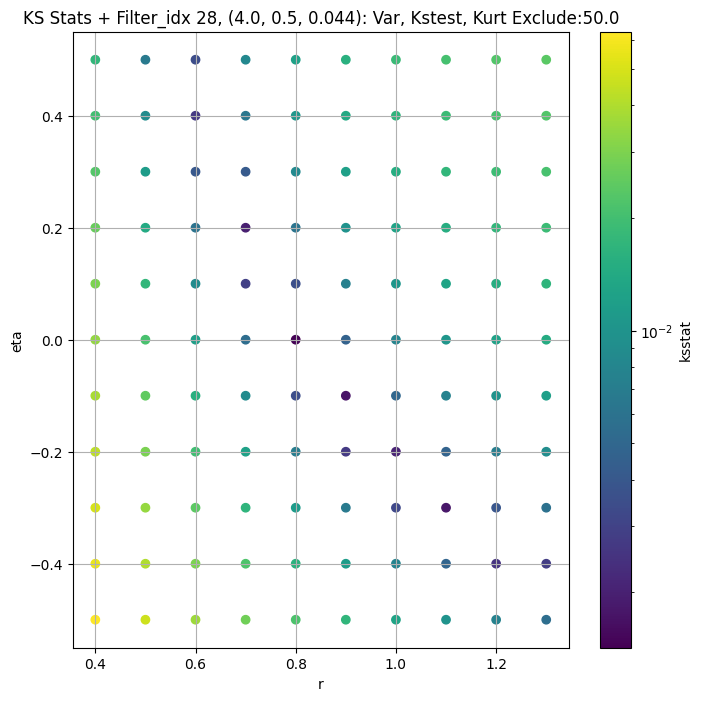

####
Filter_idx, 29: (4.0, 0.5, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 0 0.0016082131455026905 7.719338667334118


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 50 0.0017344196375352339 7.383523015273438


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 100 0.001996568254264794 7.206492284956955


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
29 200 0.003430250574150584 6.936045256857938
Number of samples: 100000, Without approximation : 49152000.0


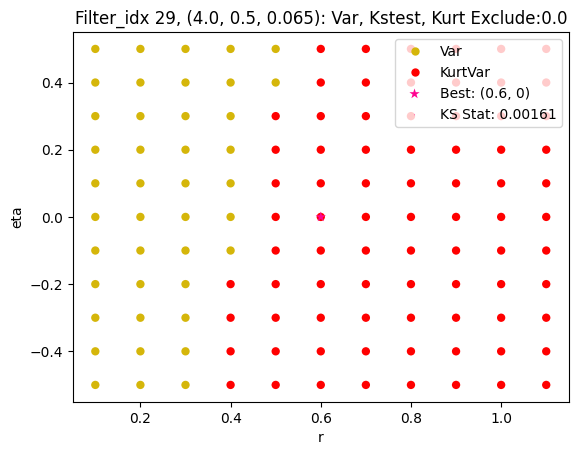

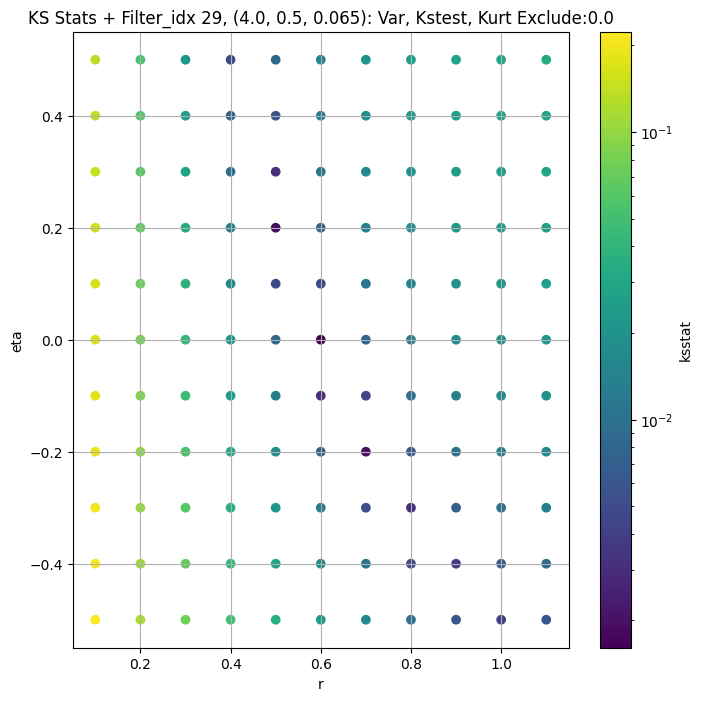

####
Filter_idx, 30: (4.0, 0.5, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 0 0.001522826613531092 3.0344975845464766


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 50 0.0019054711545515302 2.8833640410844166


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 100 0.002516061715592932 2.804728584303779


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
30 200 0.0038029372326737164 2.6869903808407116
Number of samples: 100000, Without approximation : 49152000.0


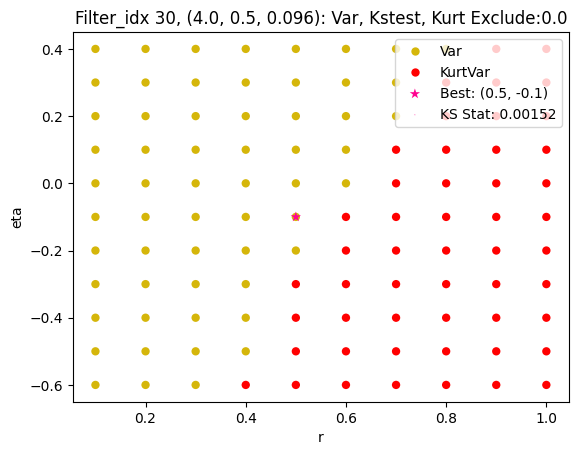

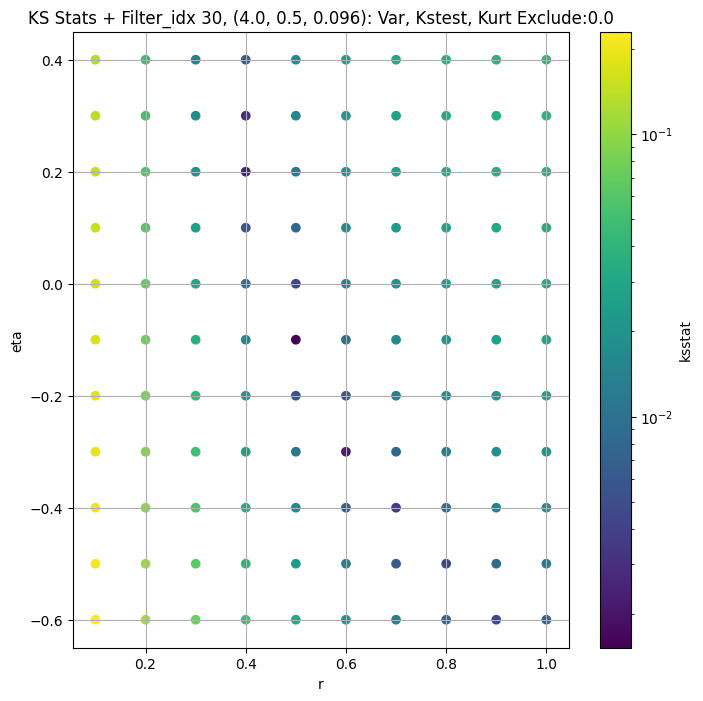

####
Filter_idx, 31: (4.0, 0.5, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 0 0.0017555782777589624 1.1942922935584817


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 50 0.0025407984963092406 1.1142537272059965


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 100 0.0037593952394890384 1.0797033474813695


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
31 200 0.004359071125080018 1.02905799437516
Number of samples: 100000, Without approximation : 49152000.0


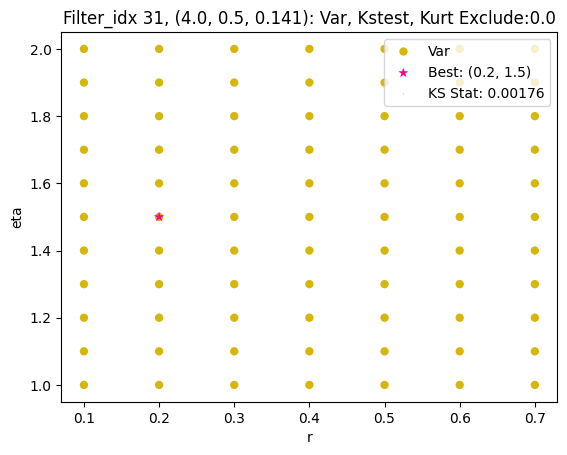

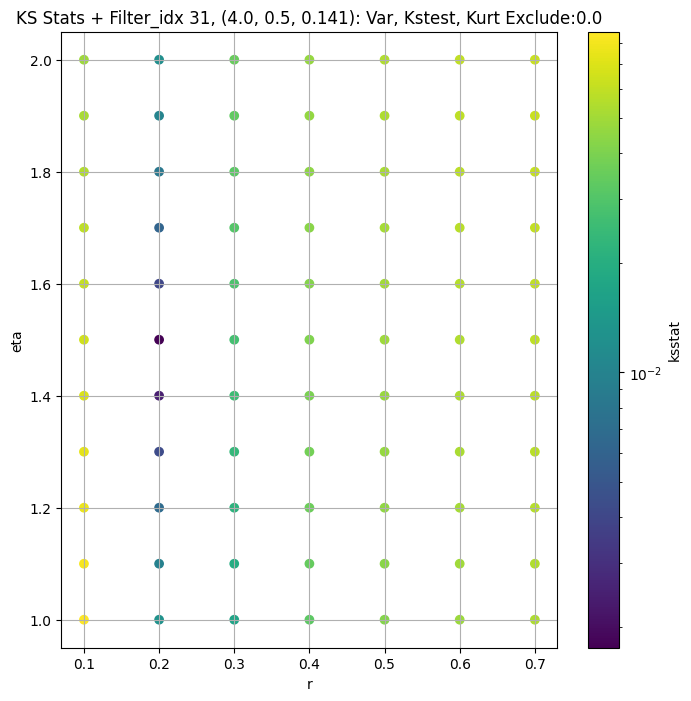

####
Filter_idx, 32: (4.0, 0.5, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 0 0.0033337875604394496 0.45742259098701704


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 50 0.0028611683853733694 0.4175913421918171


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 100 0.003177350720124931 0.4038081738249151


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
32 200 0.004572134361591294 0.38378492498793515
Number of samples: 100000, Without approximation : 49152000.0


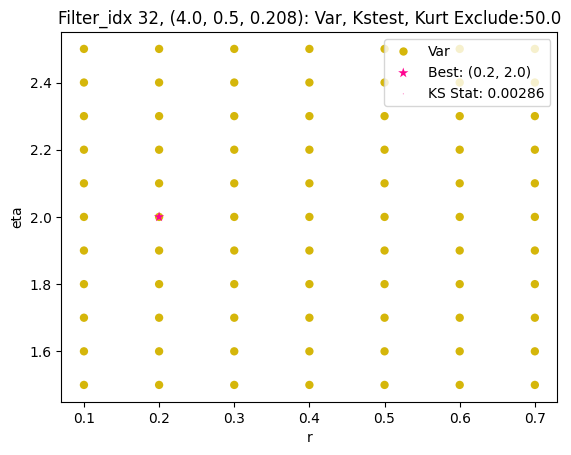

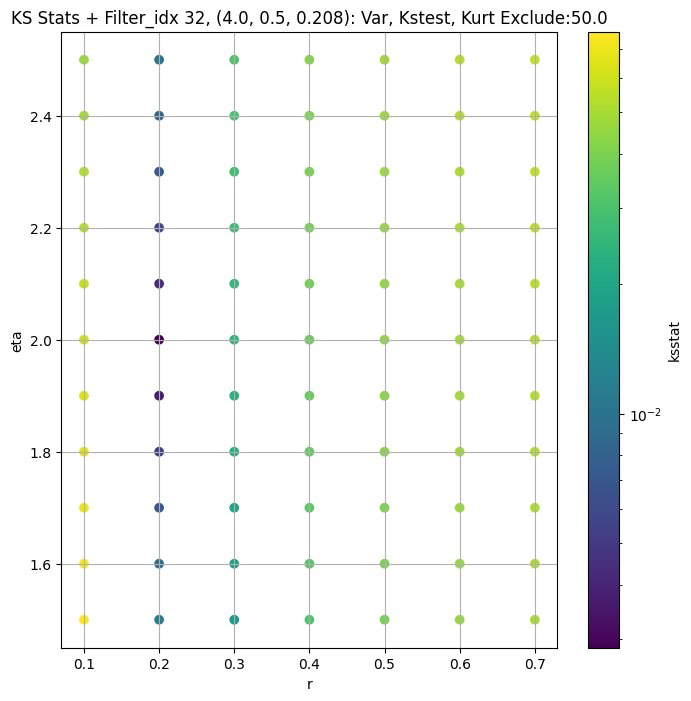

####
Filter_idx, 33: (4.0, 0.5, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 0 0.005075582822998123 0.1728036624486485


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 50 0.002972113881273178 0.1611588373316654


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 100 0.002332640089618015 0.15599453342526926


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
33 200 0.003652952668666963 0.14860888044266085
Number of samples: 100000, Without approximation : 49152000.0


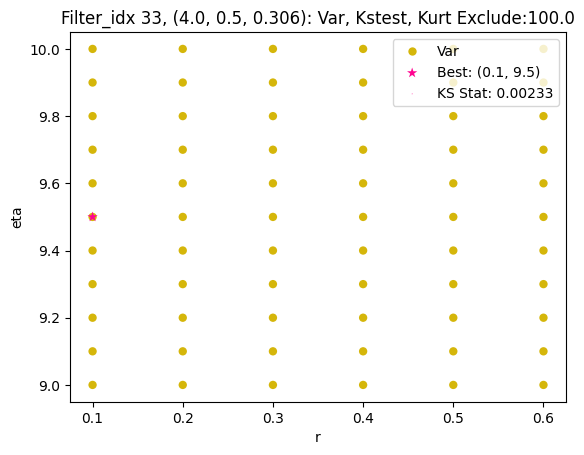

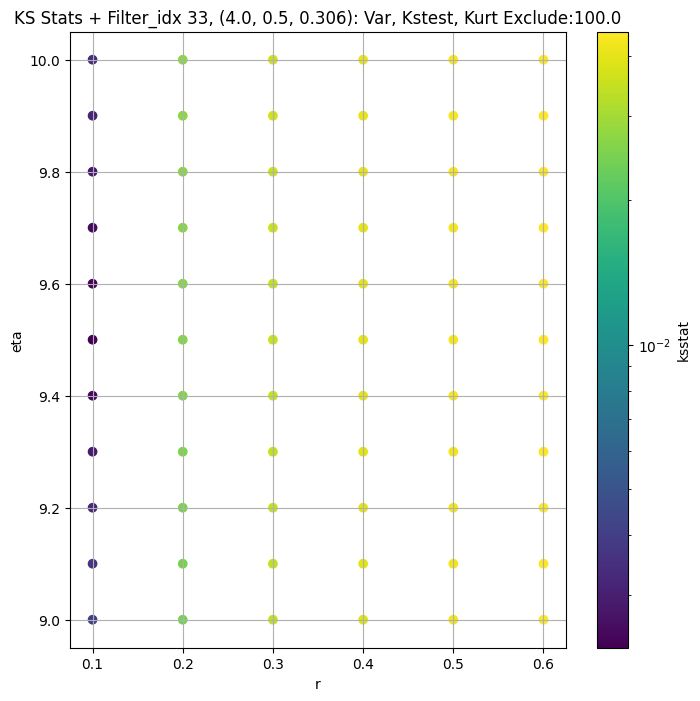

####
Filter_idx, 34: (4.0, 0.5, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 0 0.004097273549454772 0.07722264024145169


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 50 0.0014244758688544135 0.0725743572062485


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 100 0.0015484298483533498 0.07105923958402749


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
34 200 0.002754325423239678 0.06881730527410707
Number of samples: 100000, Without approximation : 49152000.0


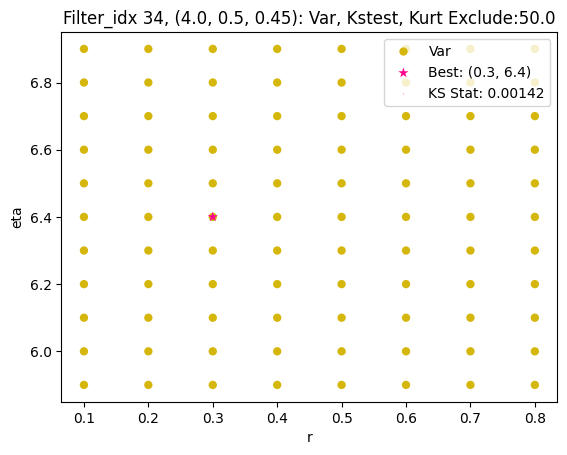

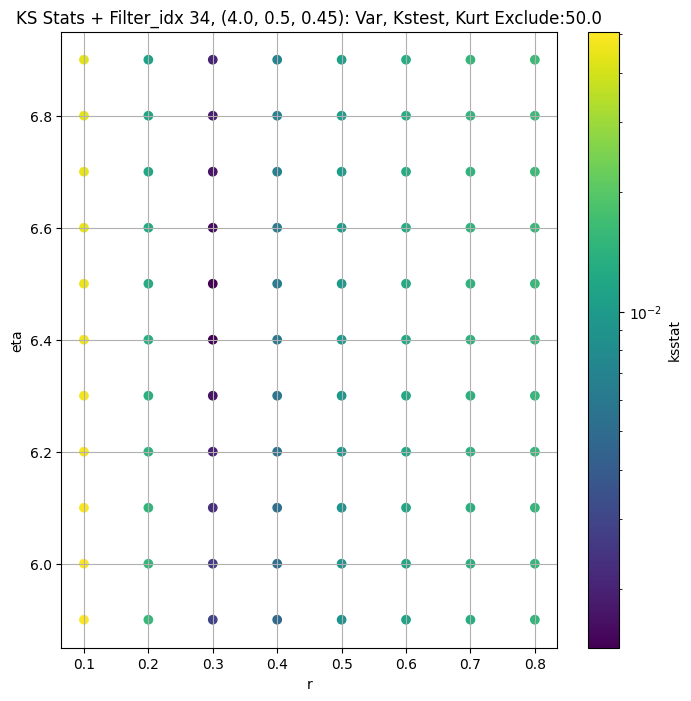

####
Filter_idx, 35: (4.0, 1.0, 0.044)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 0 0.0017077787088157215 21.507534137982397


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 50 0.0012718638434559004 20.62862304365102


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 100 0.0019215466548501148 20.178017154065124


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
35 200 0.0032449125698694736 19.491598340462502
Number of samples: 100000, Without approximation : 49152000.0


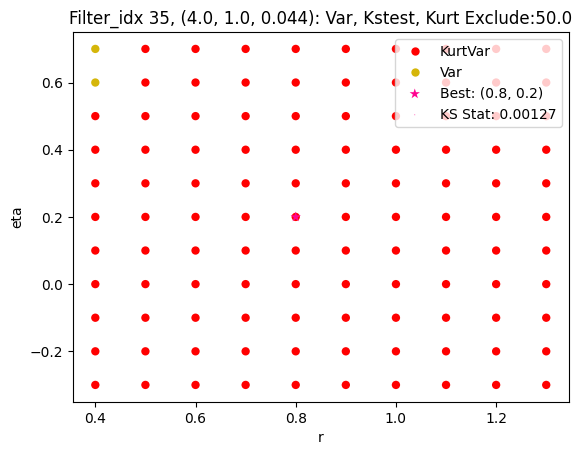

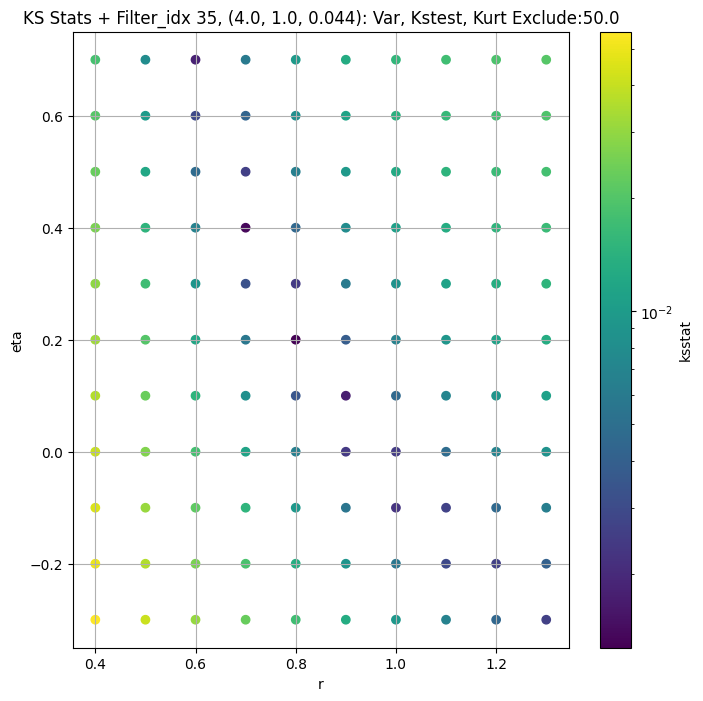

####
Filter_idx, 36: (4.0, 1.0, 0.065)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 0 0.0013798457150896448 8.74542738268768


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 50 0.0013065928247326664 8.407900113783446


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 100 0.0018288943702330362 8.209128907598094


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
36 200 0.0033373659861459792 7.90399496955037
Number of samples: 100000, Without approximation : 49152000.0


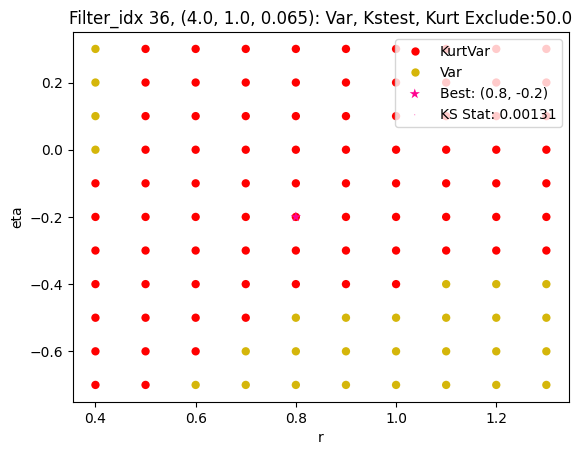

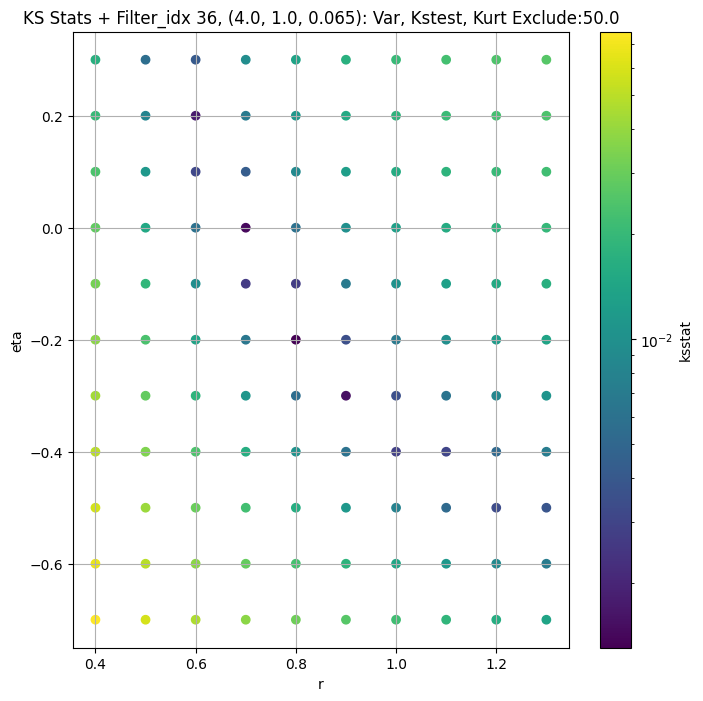

####
Filter_idx, 37: (4.0, 1.0, 0.096)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 0 0.001204637264695274 3.3732003974041955


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 50 0.0019937500696922683 3.198080376239868


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 100 0.002199449560692991 3.1091514064690142


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
37 200 0.00368243370971498 2.9768117795923916
Number of samples: 100000, Without approximation : 49152000.0


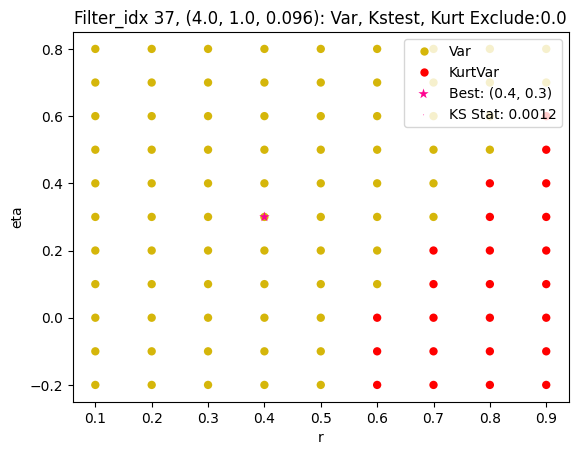

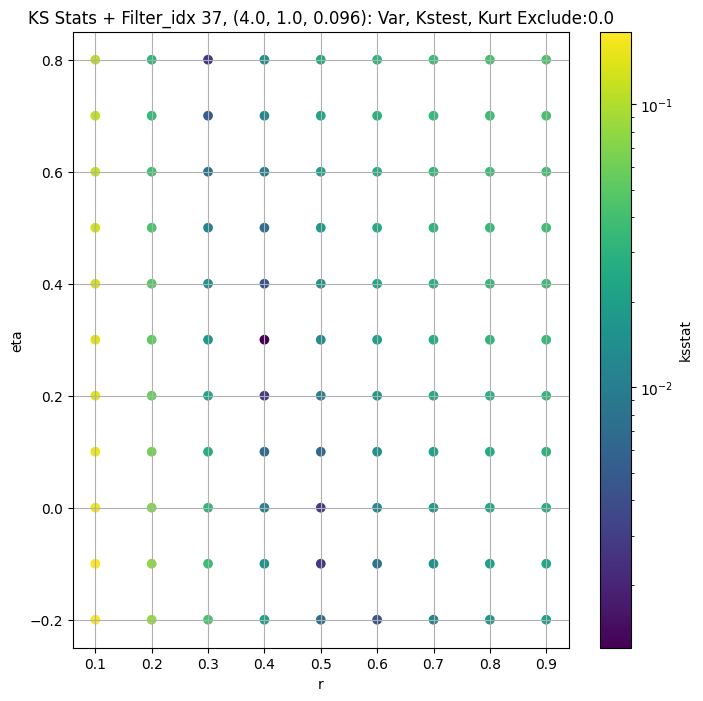

####
Filter_idx, 38: (4.0, 1.0, 0.141)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 0 0.0019536250932751242 1.3130548071077943


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 50 0.002601216497572459 1.230650691352598


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 100 0.0027991287555934816 1.1924113992341208


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
38 200 0.004281403877030798 1.1359387743156655
Number of samples: 100000, Without approximation : 49152000.0


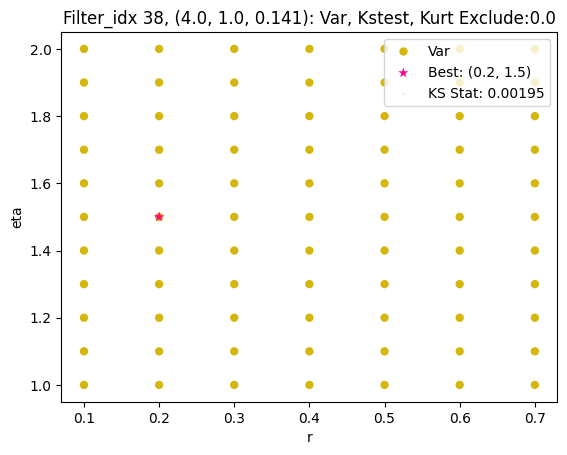

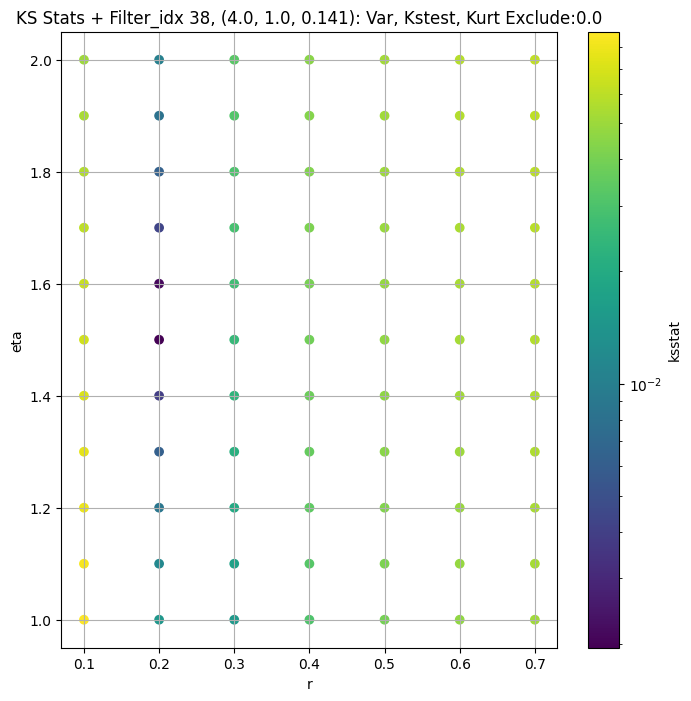

####
Filter_idx, 39: (4.0, 1.0, 0.208)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 0 0.003856402169766099 0.5087602255392322


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 50 0.002639945948828982 0.46704743641201035


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 100 0.0033246119879565064 0.4506201950424371


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
39 200 0.004532590866525701 0.4269063957330355
Number of samples: 100000, Without approximation : 49152000.0


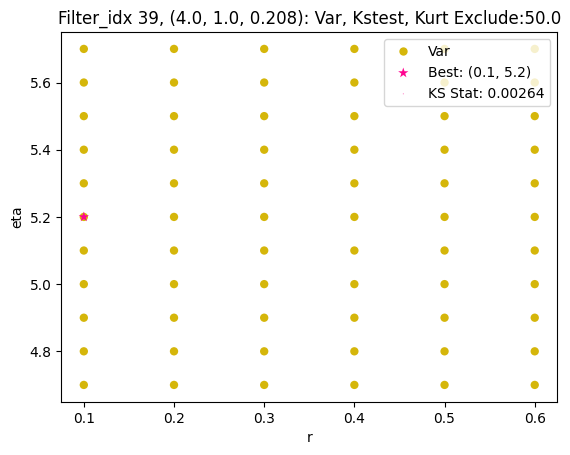

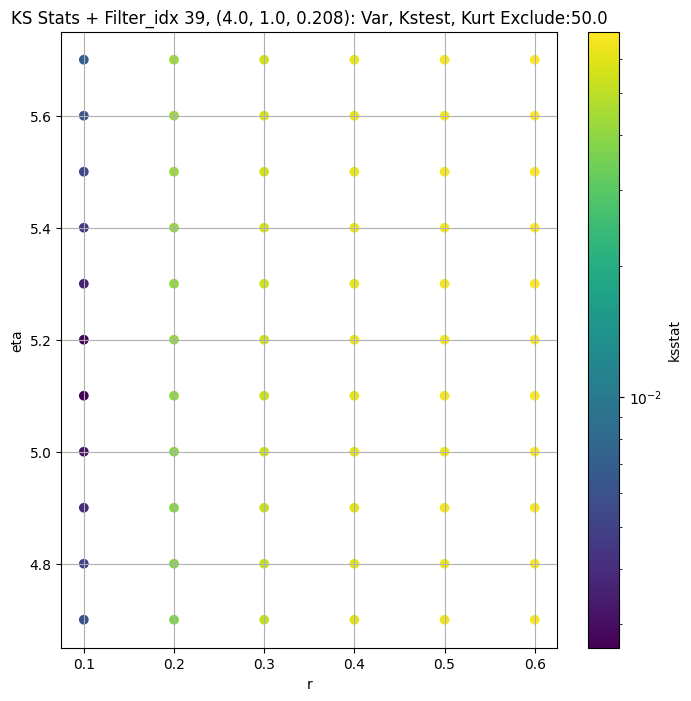

####
Filter_idx, 40: (4.0, 1.0, 0.306)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 0 0.005853210818848931 0.18900209414200167


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 50 0.003464550976620129 0.1752395878666375


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 100 0.0027134093382323865 0.16943370557436382


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
40 200 0.0038052345676734753 0.161060819188008
Number of samples: 100000, Without approximation : 49152000.0


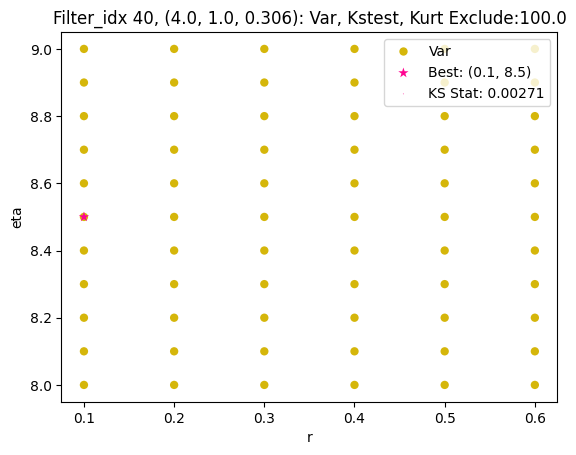

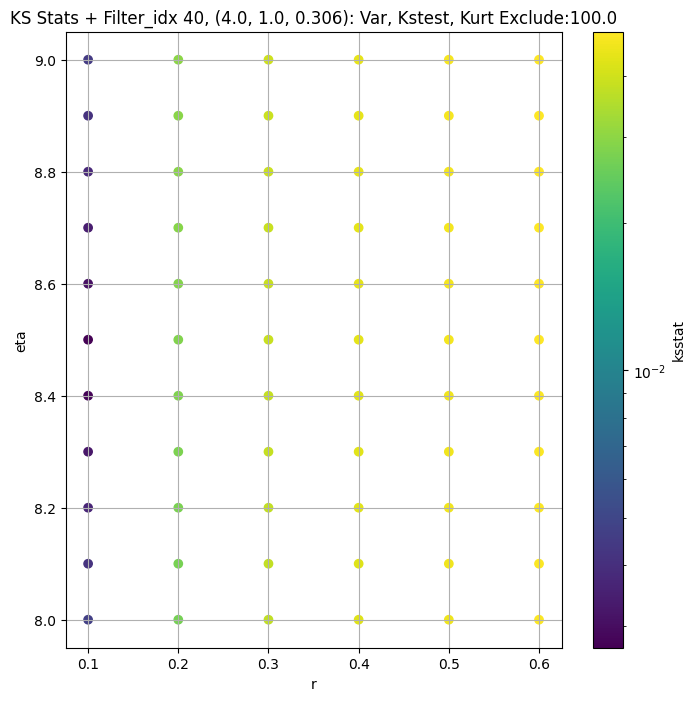

####
Filter_idx, 41: (4.0, 1.0, 0.45)


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 0 0.003474810269763373 0.08077627670343035


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 50 0.0010711568615610068 0.07621754436165006


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 100 0.001687896957728436 0.0745513008095034


  0%|          | 0/12760 [00:00<?, ?it/s]

Finding Minimum after computing 12760 CDFs
41 200 0.0029746170271372496 0.0720892420051738
Number of samples: 100000, Without approximation : 49152000.0


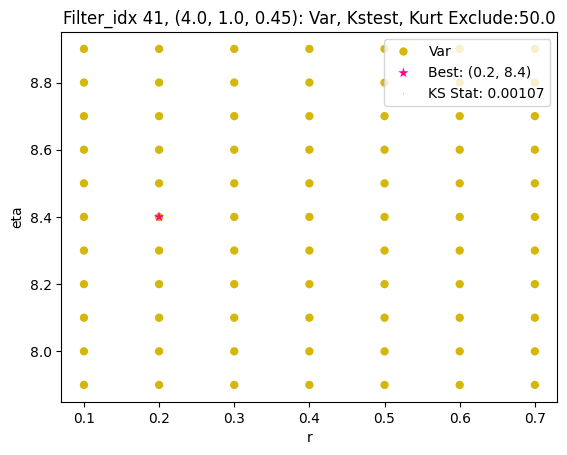

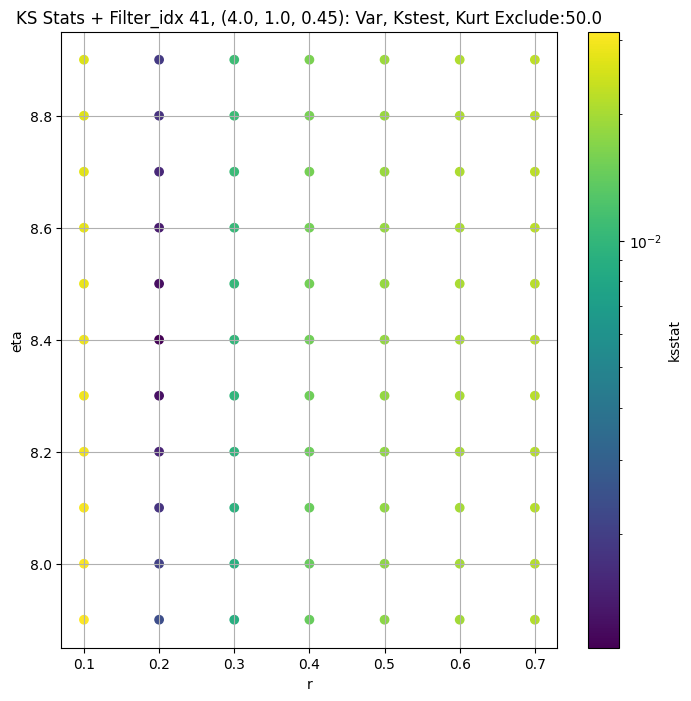

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,initial_r,initial_eta,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05
filter_idx,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",19.512732,16.061955,24.352984,3.693593,1.240120,35.557062,49152000.0,"(2.0, 0.5, 0.044)",0.030190,1.9,-0.5,3.383779e+01,0.0,19.512732,0.000194
1,"(2.0, 0.5, 0.065)",7.825587,6.293173,9.732981,4.648551,1.371346,44.666126,49152000.0,"(2.0, 0.5, 0.065)",0.024723,0.1,5.5,1.496877e-18,0.0,7.825587,0.000194
2,"(2.0, 0.5, 0.096)",3.203549,2.597087,5.412916,11.848032,1.800651,175.540741,49152000.0,"(2.0, 0.5, 0.096)",0.016297,0.4,0.3,4.897036e-02,50.0,3.031249,0.000194
3,"(2.0, 0.5, 0.141)",1.299067,1.008325,3.309371,37.190033,2.062645,367.029021,49152000.0,"(2.0, 0.5, 0.141)",0.008241,0.1,4.8,6.676242e-19,0.0,1.299067,0.000194
4,"(2.0, 0.5, 0.208)",0.503130,0.377765,1.474419,47.714934,2.424145,425.693656,49152000.0,"(2.0, 0.5, 0.208)",0.004755,0.1,6.1,4.070785e-20,50.0,0.462242,0.000194
5,"(2.0, 0.5, 0.306)",0.177674,0.138656,0.550852,60.899960,1.386832,471.200153,49152000.0,"(2.0, 0.5, 0.306)",0.005319,0.1,14.0,1.418348e-23,200.0,0.150899,0.000194
6,"(2.0, 0.5, 0.45)",0.120857,0.095208,0.387114,62.225351,0.975672,487.250214,49152000.0,"(2.0, 0.5, 0.45)",0.005941,0.2,13.0,4.553416e-11,200.0,0.104406,0.000194
7,"(2.0, 1.0, 0.044)",25.326290,21.284981,32.067659,3.715394,1.112378,41.577878,49152000.0,"(2.0, 1.0, 0.044)",0.027933,5.7,-0.5,4.973388e+01,100.0,23.952860,0.000194
8,"(2.0, 1.0, 0.065)",10.787103,8.884289,13.944638,4.497917,1.434039,37.939142,49152000.0,"(2.0, 1.0, 0.065)",0.024671,0.4,0.8,9.186740e-02,200.0,9.767512,0.000194


In [17]:
master_df_combo_path = Path(os.path.join(CWD, "CSVs", "master_df_combo.csv"))
rEtaKsstats_dict_path = Path(os.path.join(CWD, "cache", "rEtaKsstats_dict.pickle"))

rEtaKsstats_dict = dict()

if RERUN or not master_df_combo_path.exists():
    sorted_params = sorted(all_cdfs)
    ksstats_dict = dict()

    for i, group in enumerate(GROUPS): # TODO For quick testing purposes
        print(f"####\n{GROUP.capitalize()}, {group}: {str(filter_group_map[group])}")
        sample = group_data_map[group]
        if len(sample) == 0:
            continue
        group_cdfs_df = all_cdfs_df.copy()
        master_df.loc[group, 'kstest_stat_initial'] = 1

        for j in range(len(EXCLUDE_CUTOFFS)):

            exclude_cutoff = EXCLUDE_CUTOFFS[j]
            exclude_cutoff = int(exclude_cutoff)

            if exclude_cutoff == 0:
                augmented_var = np.var(group_data_map[group]) 
            else:
                augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])
                if augmented_var == np.var(group_data_map[group]):
                    continue 
                
            group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
            ksstats, initial_param, min_stat = gridsearch(sample, all_cdfs, debug=True, scales=group_cdfs_df['scale'])
            augmented_var_df.loc[group, f"kstest_stat_{exclude_cutoff}"] = min_stat
            group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] = ksstats
            
            print(group, exclude_cutoff, min_stat, augmented_var)
            
            if (min_stat < master_df.loc[group, 'kstest_stat_initial']) and not np.isclose(min_stat, master_df.loc[group, 'kstest_stat_initial'], 1e-6):
                inital_min_stat = min_stat
                inital_best_param = initial_param
                master_df.loc[group, 'kstest_stat_initial'] = min_stat
                initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                master_df.loc[group, 'initial_r'], master_df.loc[group, 'initial_eta'] = initial_param
                master_df.loc[group, 'initial_scale'] = initial_scale
                master_df.loc[group, 'initial_exclude_cutoff'] = exclude_cutoff
                master_df.loc[group, 'best_augmented_var'] = augmented_var
        
        ksstats = group_cdfs_df[f"ksstat_exclude_{int(master_df.loc[group, 'initial_exclude_cutoff'])}"]
            
        print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
        
        cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
        master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

        best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

        group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
        group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

        group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

        group_dict = {'r' : group_cdfs_df['r'], 'eta' : group_cdfs_df['eta']}
        group_dict.update({f'ksstat_exclude_{exclude_cutoff}' : group_cdfs_df[f'ksstat_exclude_{exclude_cutoff}'] for exclude_cutoff in EXCLUDE_CUTOFFS[:j+1]})
        rEtaKsstats_dict[group] = group_dict

        cols = ['pass_var', 'pass_kstest', 'pass_kurt']

        fig = combo_test_plot(group_cdfs_df, cols, 
                            plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: {', '.join([col[5:].capitalize() for col in cols])} Exclude:{master_df.loc[group, 'initial_exclude_cutoff']}", 
                            target_var = None,
                            best_param = inital_best_param,
                            best_ksstat=inital_min_stat
                            )
        
        fig.figure.savefig(os.path.join(CWD, "plots", f"full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)

        # Optional: 
        # Create plots of bootstrapped variance and kurtosis for varying confidence intervals
        # fig_var = create_ci_scatter_plot(group_cdfs_df, var_values_dict, metric='variance', group=group)
        # fig_kurt = create_ci_scatter_plot(group_cdfs_df, kurt_values_dict, metric='kurtosis', group=group)

        # fig_var.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_var)
        # fig_kurt.savefig(os.path.join(CWD, "plots", f"ci_scatter_variance_{GROUP}_{group}_bootstrap{n_bootstrap}.jpg"), bbox_inches='tight')
        # plt.close(fig_kurt)

    # new: add parameter information
    master_df.insert(0, 'params', master_df.index.map(filter_group_map))

    master_df.to_csv(master_df_combo_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)
    augmented_var_df.to_csv(augmented_var_df_path)

augmented_var_df = pd.read_csv(augmented_var_df_path, index_col=GROUP)
master_df = pd.read_csv(master_df_combo_path, index_col=GROUP)
rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df

## Optimization

In [18]:
master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
master_df[f'best_r'] = master_df['initial_r']
master_df[f'best_eta'] = master_df['initial_eta']
master_df[f'best_scale'] = master_df['initial_scale']
master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

Filter_idx 0, (2.0, 0.5, 0.044):


  0%|          | 0/1107 [00:00<?, ?it/s]

Finding Minimum after computing 1107 CDFs
filter_idx 0, 0.0 + 100 = 100, ksstat: 0.030190607513342793, var: 18.459432583075778


  0%|          | 0/1107 [00:00<?, ?it/s]

Finding Minimum after computing 1107 CDFs
filter_idx 0, 0.0 + 75 = 75, ksstat: 0.030190485179916293, var: 18.646536869297


  0%|          | 0/1107 [00:00<?, ?it/s]

Finding Minimum after computing 1107 CDFs
filter_idx 0, 0.0 + 50 = 50, ksstat: 0.030190575941489328, var: 18.856352086984064


  0%|          | 0/1107 [00:00<?, ?it/s]

Finding Minimum after computing 1107 CDFs
filter_idx 0, 0.0 + 25 = 25, ksstat: 0.030190724218576992, var: 19.10335832120092


  0%|          | 0/1107 [00:00<?, ?it/s]

Finding Minimum after computing 1107 CDFs
filter_idx 0, 0.0 + 0 = 0, ksstat: 0.030190415604448018, var: 19.51273169190206
Number of samples: 100000, Without approximation : 49152000.0


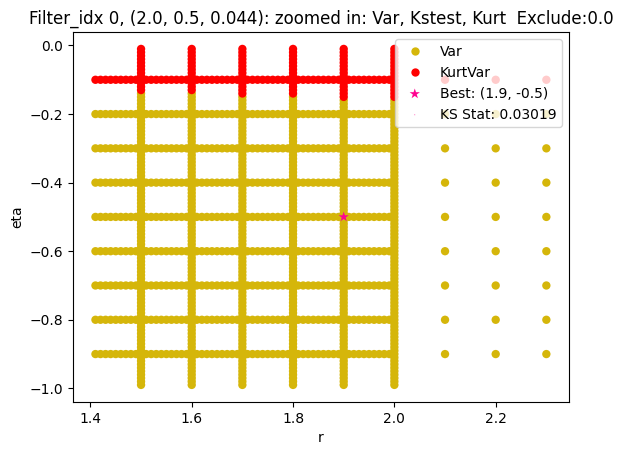

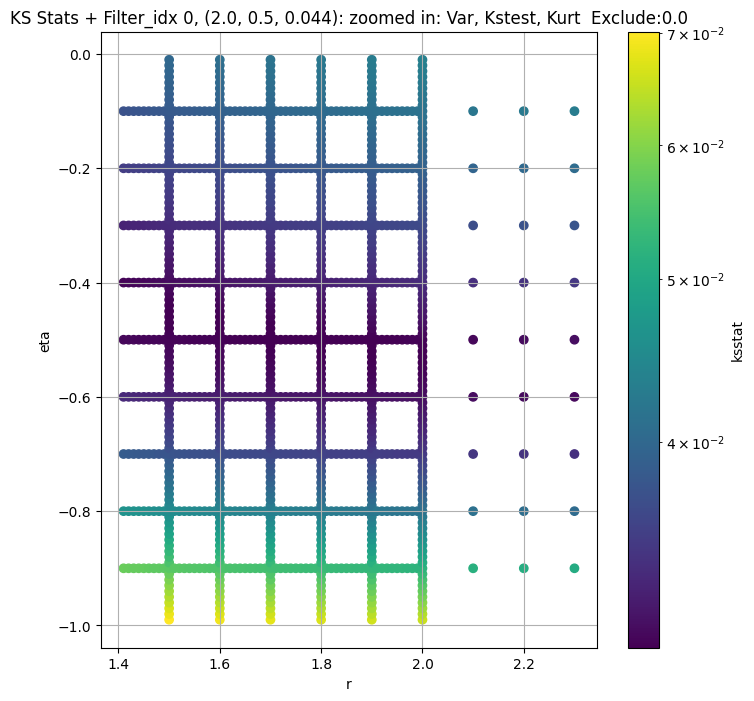

Filter_idx 1, (2.0, 0.5, 0.065):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 0.0 + 100 = 100, ksstat: 0.024732009031719127, var: 7.353008959233777


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 0.0 + 75 = 75, ksstat: 0.024723840540797903, var: 7.433329840455744


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 0.0 + 50 = 50, ksstat: 0.024723041196382578, var: 7.524350223821941


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 0.0 + 25 = 25, ksstat: 0.02472989099433065, var: 7.633814005448341


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 1, 0.0 + 0 = 0, ksstat: 0.024722612496237473, var: 7.825586861621166
Number of samples: 100000, Without approximation : 49152000.0


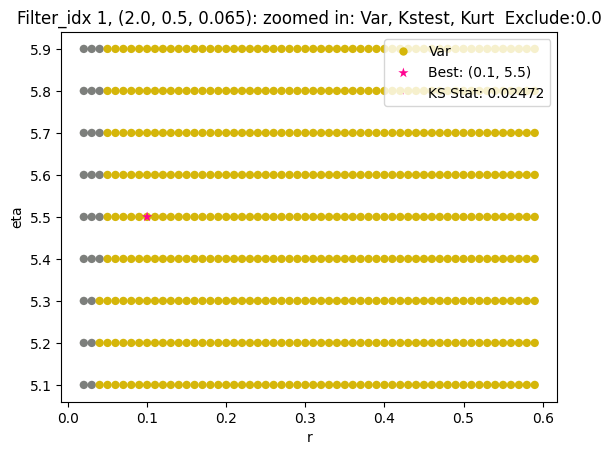

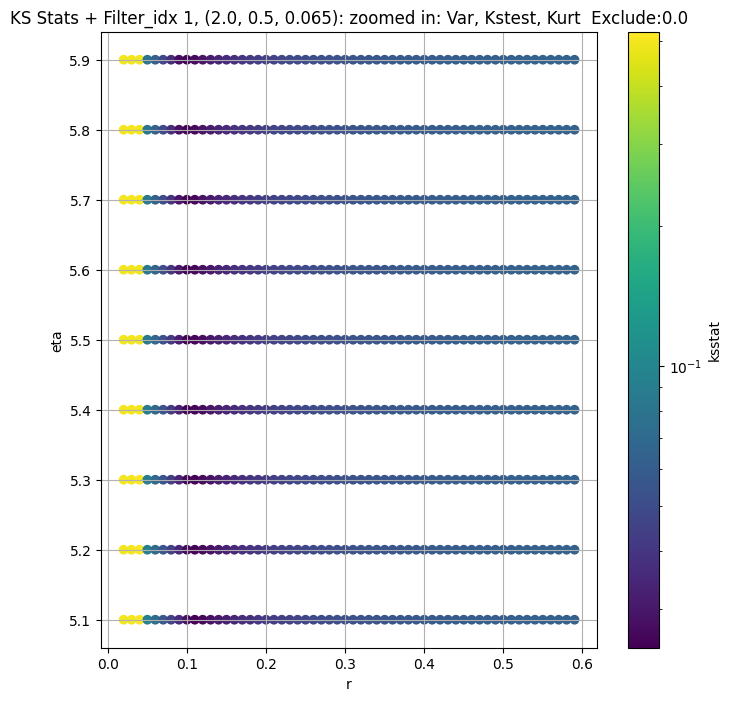

Filter_idx 2, (2.0, 0.5, 0.096):


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 2, 50.0 + 100 = 150, ksstat: 0.016303475544352075, var: 2.888266915848244


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 2, 50.0 + 75 = 125, ksstat: 0.016295863931883647, var: 2.9187499848552374


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 2, 50.0 + 50 = 100, ksstat: 0.016304025815890577, var: 2.951977865829194


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 2, 50.0 + 25 = 75, ksstat: 0.016296712772533528, var: 2.9888646923697326


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 2, 50.0 + 0 = 50, ksstat: 0.01629737670359266, var: 3.0312486727942765


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 2, 50.0 + -25 = 25, ksstat: 0.01630603403776243, var: 3.083542598676411


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 2, 50.0 + -50 = 0, ksstat: 0.01630752149868958, var: 3.203549148034639
Number of samples: 100000, Without approximation : 49152000.0


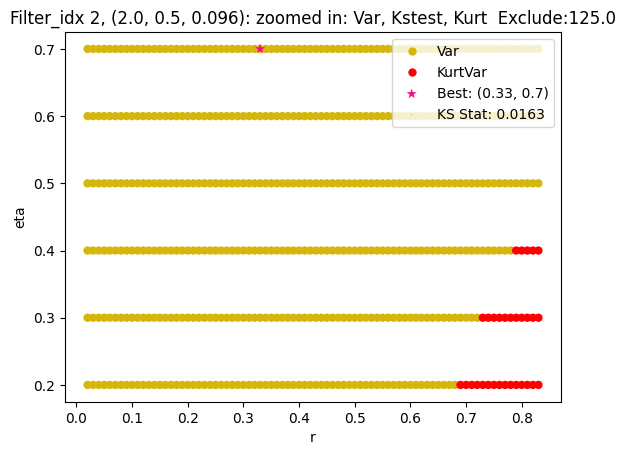

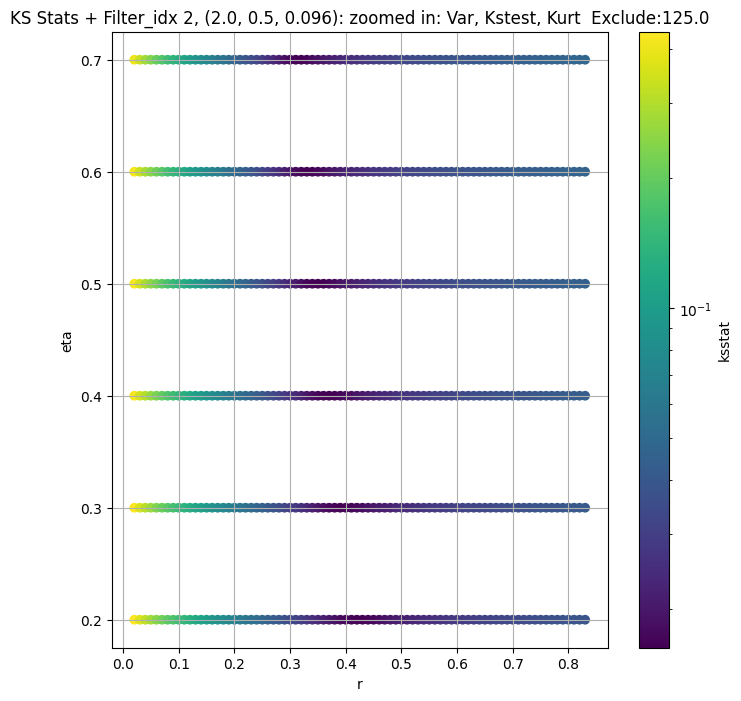

Filter_idx 3, (2.0, 0.5, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 0.0 + 100 = 100, ksstat: 0.010069117916711959, var: 1.1679027468152403


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 0.0 + 75 = 75, ksstat: 0.009636128297400792, var: 1.1845472026164692


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 0.0 + 50 = 50, ksstat: 0.0093510530180968, var: 1.2039144811577924


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 0.0 + 25 = 25, ksstat: 0.008877876311355004, var: 1.2282967956874409


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 3, 0.0 + 0 = 0, ksstat: 0.008241261367192054, var: 1.2990670284540071
Number of samples: 100000, Without approximation : 49152000.0


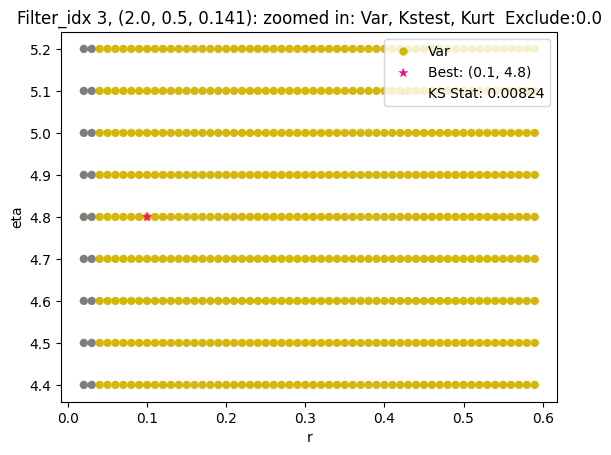

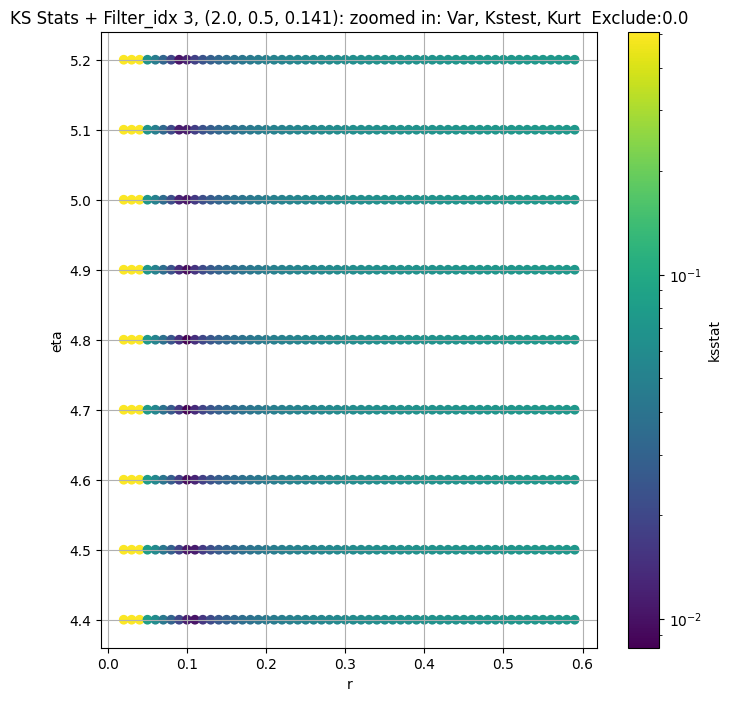

Filter_idx 4, (2.0, 0.5, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 50.0 + 100 = 150, ksstat: 0.006571984658526042, var: 0.43559965494570335


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 50.0 + 75 = 125, ksstat: 0.006240652493341603, var: 0.44113453251167223


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 50.0 + 50 = 100, ksstat: 0.005781606715425658, var: 0.4472438249523025


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 50.0 + 25 = 75, ksstat: 0.005405517152892836, var: 0.4541448222751429


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 50.0 + 0 = 50, ksstat: 0.004754628702986707, var: 0.46224196986041827


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 50.0 + -25 = 25, ksstat: 0.005108689258183807, var: 0.47254485014240044


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 4, 50.0 + -50 = 0, ksstat: 0.00581216639051374, var: 0.5031300679017542
Number of samples: 100000, Without approximation : 49152000.0


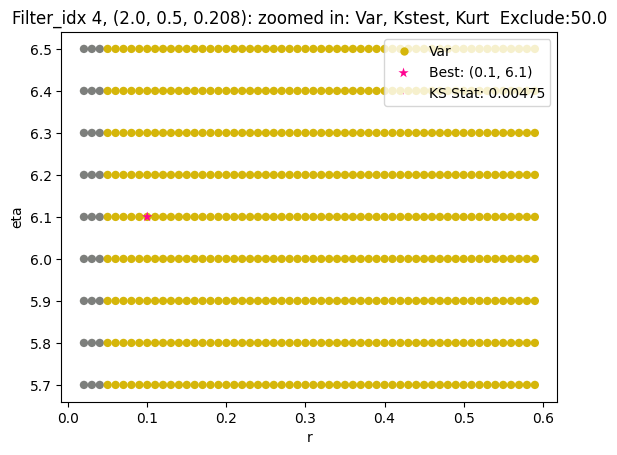

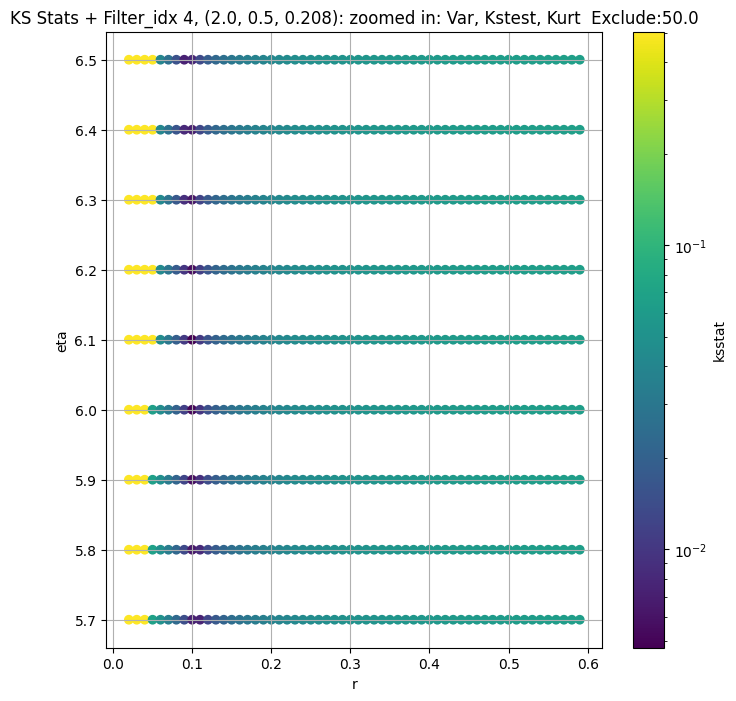

Filter_idx 5, (2.0, 0.5, 0.306):


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + 100 = 300, ksstat: 0.005470112049007048, var: 0.1456157673619032


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + 75 = 275, ksstat: 0.00526013754700716, var: 0.14683373281668638


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + 50 = 250, ksstat: 0.005604471578078529, var: 0.14811366112915783


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + 25 = 225, ksstat: 0.005963981935621199, var: 0.14946474767678694


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + 0 = 200, ksstat: 0.00531862137875827, var: 0.15089864983797194


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + -25 = 175, ksstat: 0.005826375067407241, var: 0.1524295698313068


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + -50 = 150, ksstat: 0.006949536147369595, var: 0.15407879000660782


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + -75 = 125, ksstat: 0.008160416169266216, var: 0.15587499467348395


  0%|          | 0/57 [00:00<?, ?it/s]

Finding Minimum after computing 57 CDFs
filter_idx 5, 200.0 + -100 = 100, ksstat: 0.009484670272601803, var: 0.15786156341857932
Number of samples: 100000, Without approximation : 49152000.0


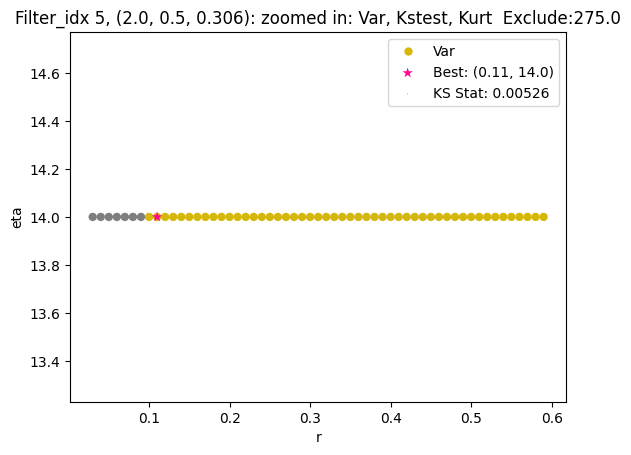

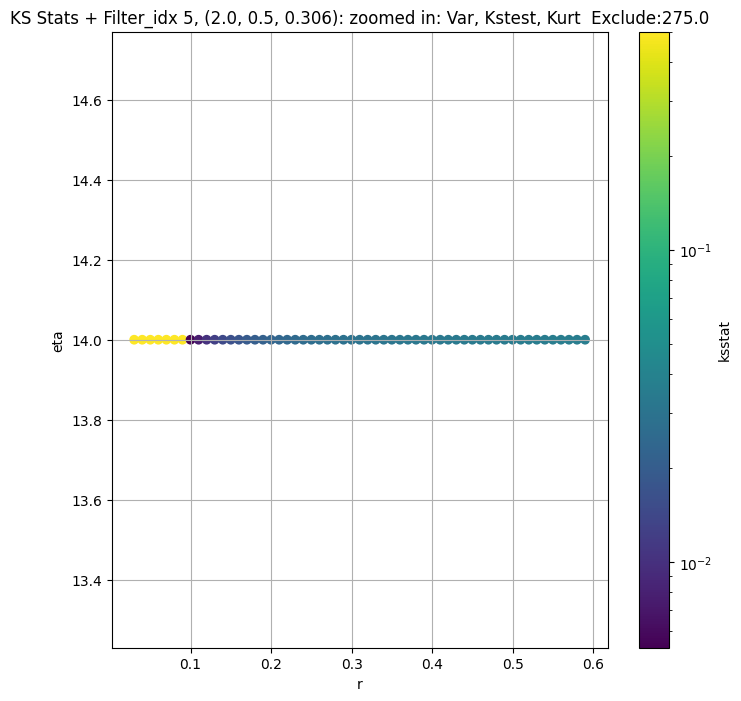

Filter_idx 6, (2.0, 0.5, 0.45):


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + 100 = 300, ksstat: 0.005557759666647066, var: 0.10122465437305993


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + 75 = 275, ksstat: 0.005431972633883175, var: 0.10195866403191836


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + 50 = 250, ksstat: 0.0056140733247757035, var: 0.10272966140941756


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + 25 = 225, ksstat: 0.00578148436461956, var: 0.10354322980552114


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + 0 = 200, ksstat: 0.005941002577194876, var: 0.10440644827934016


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + -25 = 175, ksstat: 0.006090464487272906, var: 0.10532826219461293


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + -50 = 150, ksstat: 0.006346682312843299, var: 0.10632102486576002


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + -75 = 125, ksstat: 0.006716772843935792, var: 0.10740239683746453


  0%|          | 0/68 [00:00<?, ?it/s]

Finding Minimum after computing 68 CDFs
filter_idx 6, 200.0 + -100 = 100, ksstat: 0.007159712261045392, var: 0.10859740867395025
Number of samples: 100000, Without approximation : 49152000.0


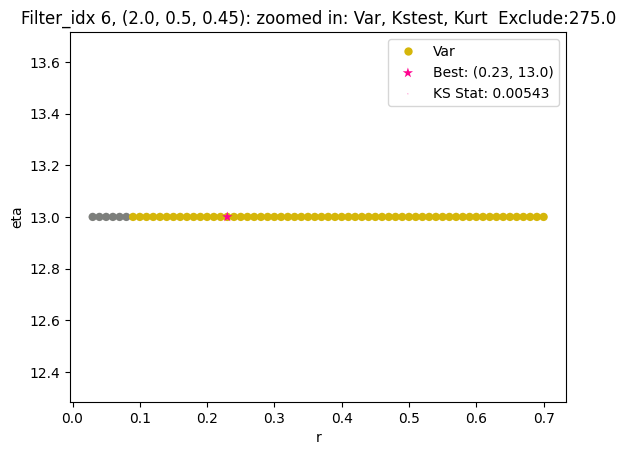

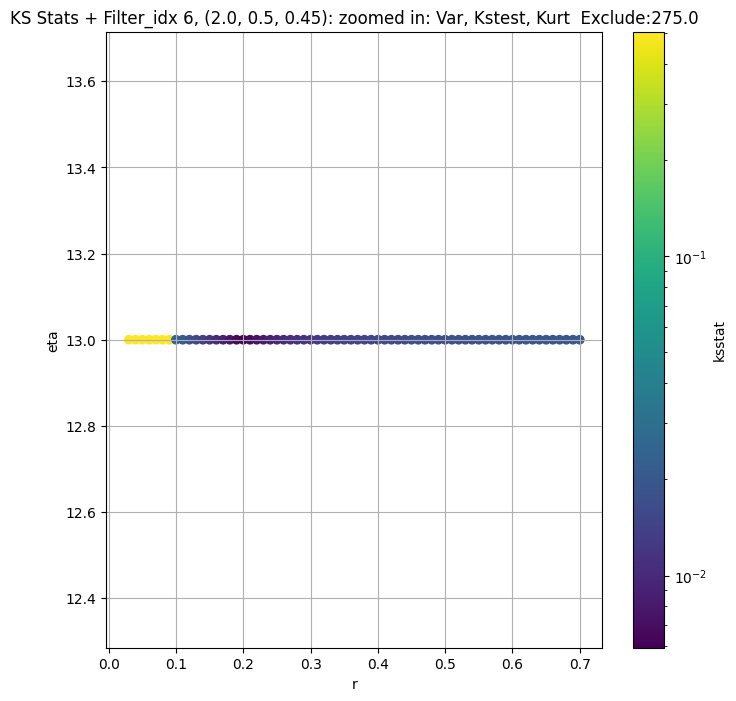

Filter_idx 7, (2.0, 1.0, 0.044):


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + 100 = 200, ksstat: 0.027934940241995887, var: 23.161937587221757


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + 75 = 175, ksstat: 0.027939702625394358, var: 23.342027907473092


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + 50 = 150, ksstat: 0.027932784910201902, var: 23.53228795111263


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + 25 = 125, ksstat: 0.027938594160179575, var: 23.734852444738678


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + 0 = 100, ksstat: 0.027932945756633187, var: 23.952859747566528


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + -25 = 75, ksstat: 0.027934759257696007, var: 24.19133023571112


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + -50 = 50, ksstat: 0.02793975064457438, var: 24.46010682409661


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + -75 = 25, ksstat: 0.027943070523477054, var: 24.781312122421117


  0%|          | 0/171 [00:00<?, ?it/s]

Finding Minimum after computing 171 CDFs
filter_idx 7, 100.0 + -100 = 0, ksstat: 0.027955161908312154, var: 25.326290085208893
Number of samples: 100000, Without approximation : 49152000.0


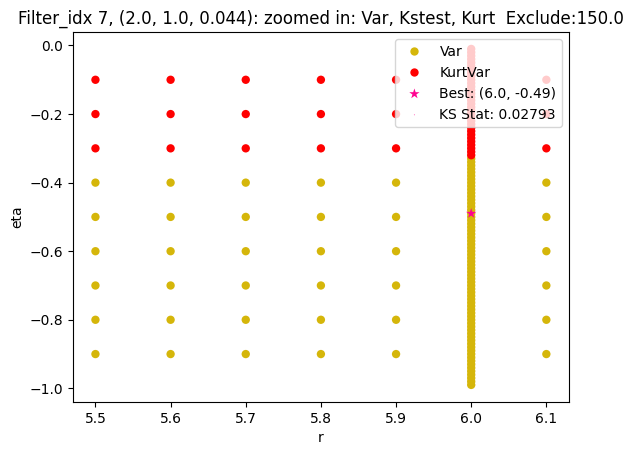

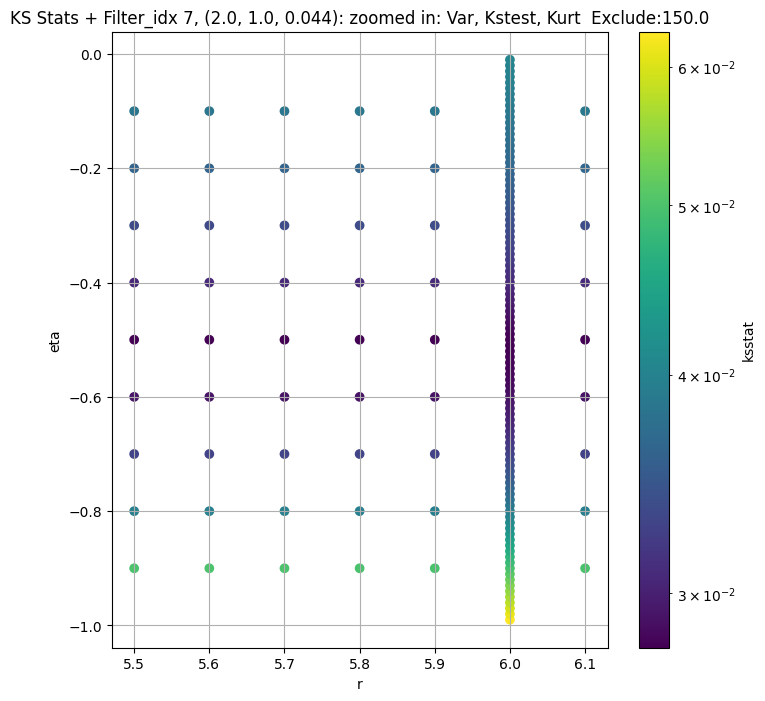

Filter_idx 8, (2.0, 1.0, 0.065):


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + 100 = 300, ksstat: 0.024671205327089996, var: 9.468854705611053


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + 75 = 275, ksstat: 0.024670338431460326, var: 9.538917056605545


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + 50 = 250, ksstat: 0.024671062648463638, var: 9.611799009526633


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + 25 = 225, ksstat: 0.02467087726681516, var: 9.687844839223994


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + 0 = 200, ksstat: 0.024671326751502354, var: 9.76751239587234


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + -25 = 175, ksstat: 0.024671015366008964, var: 9.85137551729435


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + -50 = 150, ksstat: 0.024672870336247432, var: 9.940233222211488


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + -75 = 125, ksstat: 0.024670407182853016, var: 10.035070680574043


  0%|          | 0/792 [00:00<?, ?it/s]

Finding Minimum after computing 792 CDFs
filter_idx 8, 200.0 + -100 = 100, ksstat: 0.024670400053467878, var: 10.137513751878934
Number of samples: 100000, Without approximation : 49152000.0


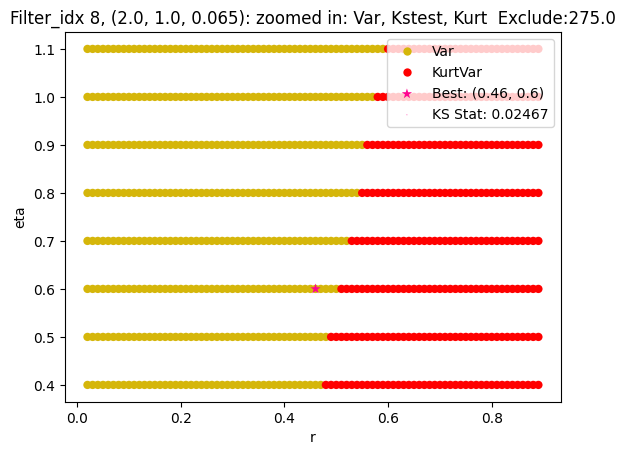

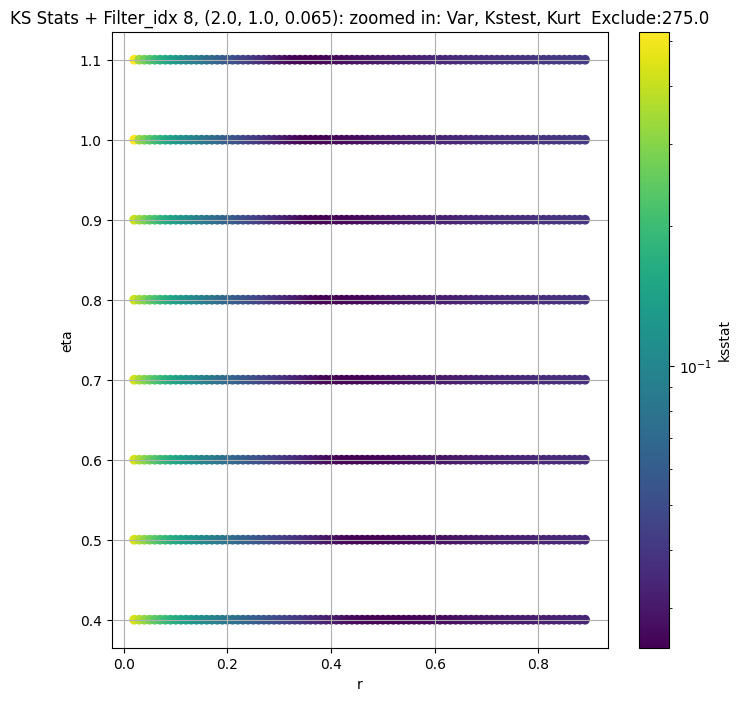

Filter_idx 9, (2.0, 1.0, 0.096):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 0.0 + 100 = 100, ksstat: 0.020029165630818135, var: 3.9628982651624036


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 0.0 + 75 = 75, ksstat: 0.020026564616815845, var: 4.012357313132782


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 0.0 + 50 = 50, ksstat: 0.020026478292098304, var: 4.0689782778834065


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 0.0 + 25 = 25, ksstat: 0.020024620545359917, var: 4.1381256819264305


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 9, 0.0 + 0 = 0, ksstat: 0.02002340244272305, var: 4.270451682142163
Number of samples: 100000, Without approximation : 49152000.0


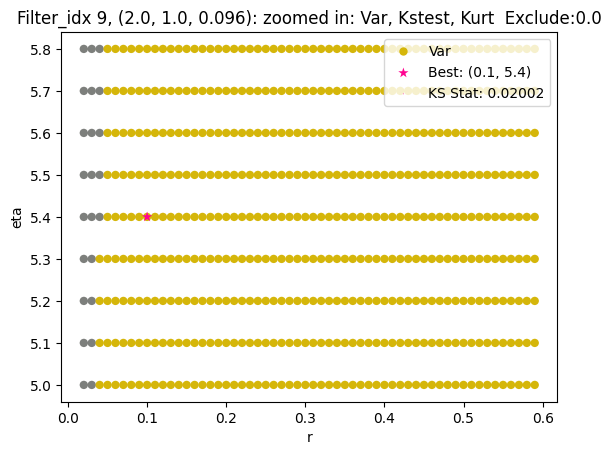

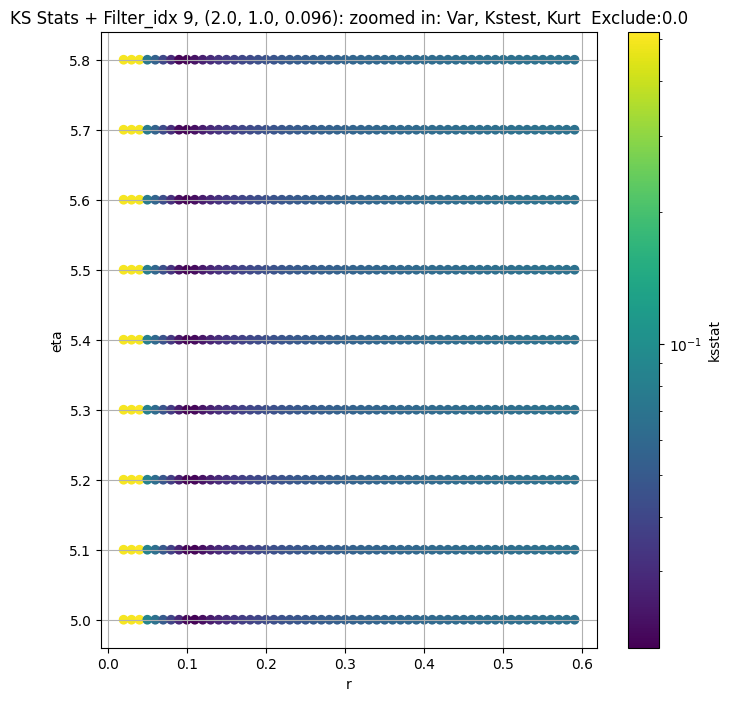

Filter_idx 10, (2.0, 1.0, 0.141):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 100 = 150, ksstat: 0.01195549437321608, var: 1.573115819188812


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 75 = 125, ksstat: 0.011899609230517694, var: 1.5913056453099703


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 50 = 100, ksstat: 0.011851384250162245, var: 1.6111975724691878


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 25 = 75, ksstat: 0.01184570850810196, var: 1.6333892826789553


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + 0 = 50, ksstat: 0.011845701386548224, var: 1.6589762596910793


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + -25 = 25, ksstat: 0.011840697085935048, var: 1.6906725080749576


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 10, 50.0 + -50 = 0, ksstat: 0.011859932487049474, var: 1.7679233622501918
Number of samples: 100000, Without approximation : 49152000.0


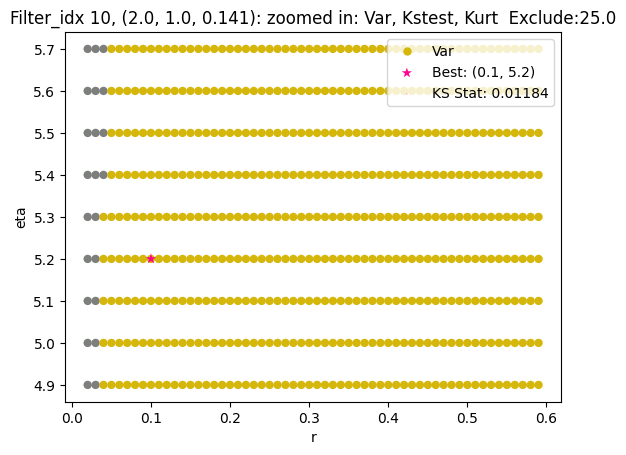

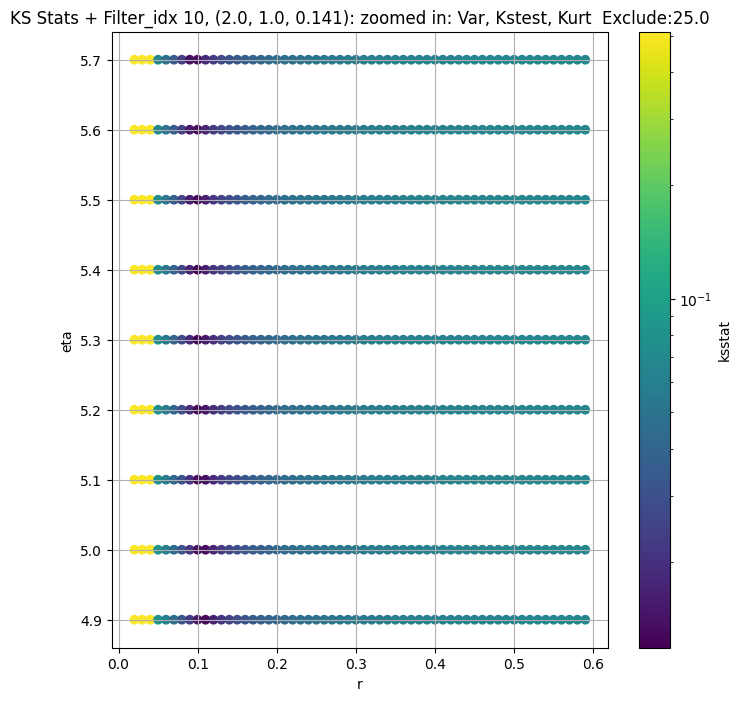

Filter_idx 11, (2.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 50.0 + 100 = 150, ksstat: 0.006651435968906758, var: 0.6061694957677233


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 50.0 + 75 = 125, ksstat: 0.006283366739656349, var: 0.6139032563279238


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 50.0 + 50 = 100, ksstat: 0.0056729523883786714, var: 0.6224124602941121


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 50.0 + 25 = 75, ksstat: 0.005336939648734315, var: 0.6319763547701622


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 50.0 + 0 = 50, ksstat: 0.005512790486800534, var: 0.6431628285223456


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 50.0 + -25 = 25, ksstat: 0.005778923833351213, var: 0.6572899566672652


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 11, 50.0 + -50 = 0, ksstat: 0.006108110567347502, var: 0.696641026708459
Number of samples: 100000, Without approximation : 49152000.0


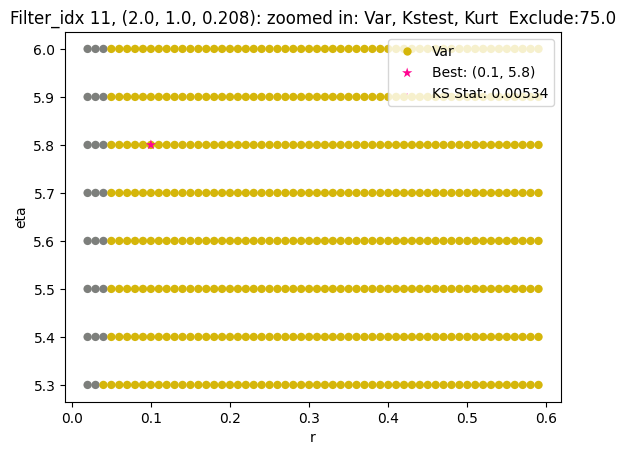

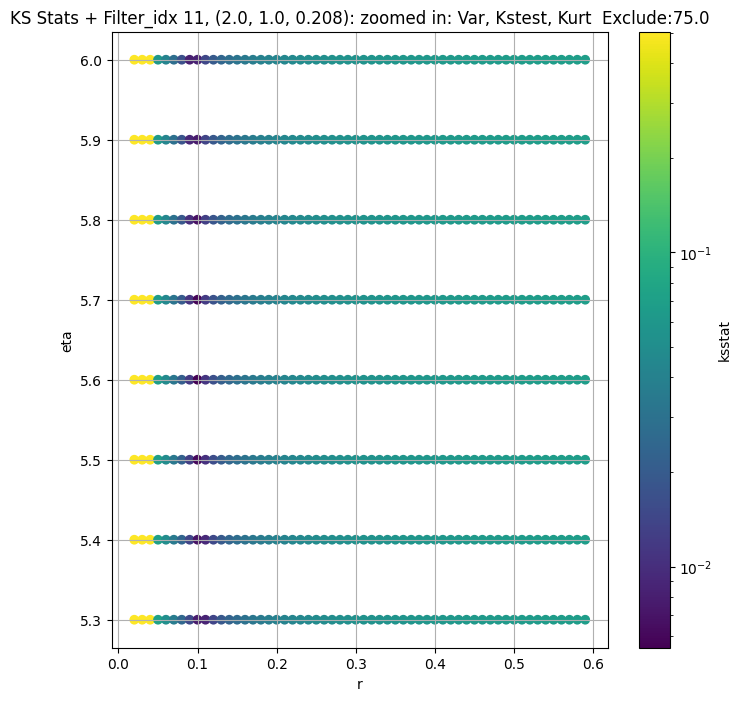

Filter_idx 12, (2.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + 100 = 200, ksstat: 0.004793803934608501, var: 0.22005301693870086


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + 75 = 175, ksstat: 0.00432360832113321, var: 0.22245173910060403


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + 50 = 150, ksstat: 0.00385466031983845, var: 0.225032904313832


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + 25 = 125, ksstat: 0.003676352381561998, var: 0.22784032521692474


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + 0 = 100, ksstat: 0.004061712642192239, var: 0.23093576299769916


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + -25 = 75, ksstat: 0.004419710445819458, var: 0.23442523632481868


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + -50 = 50, ksstat: 0.004984290543083636, var: 0.23850698899554745


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + -75 = 25, ksstat: 0.0051004403439895984, var: 0.24366318983029436


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 12, 100.0 + -100 = 0, ksstat: 0.006548285220869476, var: 0.25881044050773483
Number of samples: 100000, Without approximation : 49152000.0


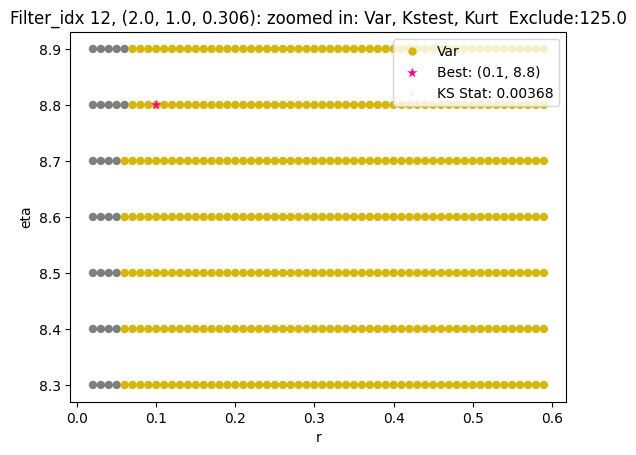

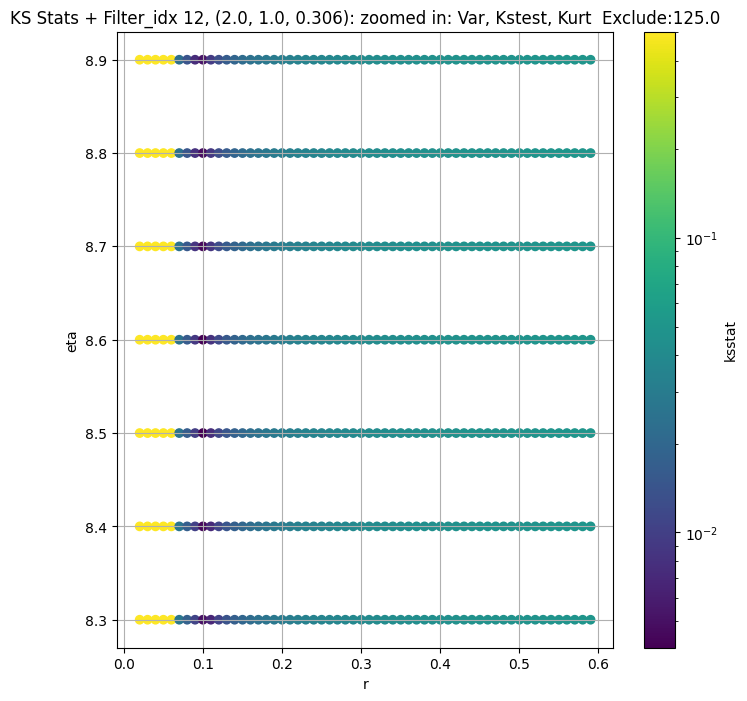

Filter_idx 13, (2.0, 1.0, 0.45):


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + 100 = 300, ksstat: 0.0048416769353715194, var: 0.10096688529871241


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + 75 = 275, ksstat: 0.004616860821075597, var: 0.1017271141082387


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + 50 = 250, ksstat: 0.004402334471052316, var: 0.10252504279224332


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + 25 = 225, ksstat: 0.004180481365004263, var: 0.10336641487340366


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + 0 = 200, ksstat: 0.0040462472770206315, var: 0.1042580340639234


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + -25 = 175, ksstat: 0.004304168728783808, var: 0.10521020275055537


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + -50 = 150, ksstat: 0.004487656403012519, var: 0.1062348479781846


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + -75 = 125, ksstat: 0.004770633172687333, var: 0.10735065729093632


  0%|          | 0/551 [00:00<?, ?it/s]

Finding Minimum after computing 551 CDFs
filter_idx 13, 200.0 + -100 = 100, ksstat: 0.005158586064244242, var: 0.10858437372063412
Number of samples: 100000, Without approximation : 49152000.0


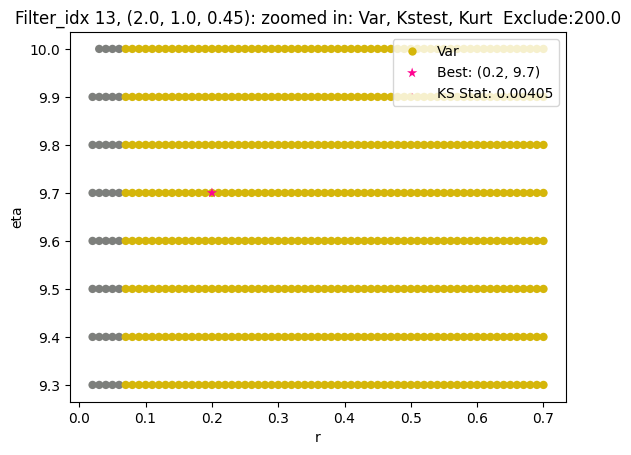

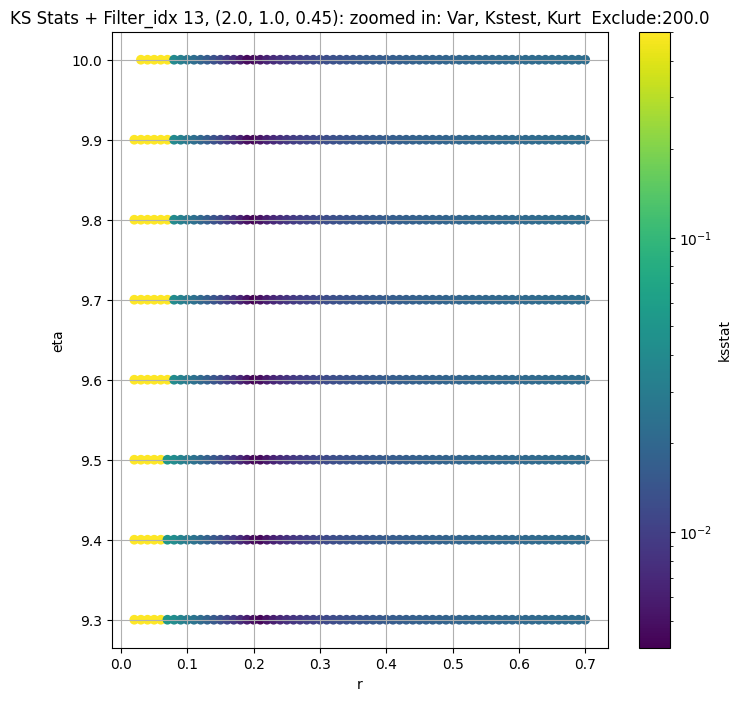

Filter_idx 14, (3.0, 0.5, 0.044):


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + 100 = 300, ksstat: 0.006637592491501421, var: 17.475426181434106


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + 75 = 275, ksstat: 0.006333647725960179, var: 17.600768666125457


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + 50 = 250, ksstat: 0.006092720984595346, var: 17.730985370175425


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + 25 = 225, ksstat: 0.005960344791447636, var: 17.866701397647105


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + 0 = 200, ksstat: 0.0059785050985528, var: 18.008702428672475


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + -25 = 175, ksstat: 0.005998577531099447, var: 18.157954828187435


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + -50 = 150, ksstat: 0.005985459200878229, var: 18.31592485575873


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + -75 = 125, ksstat: 0.005960397003473394, var: 18.48450522734018


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 14, 200.0 + -100 = 100, ksstat: 0.005995607597522656, var: 18.666445076219286
Number of samples: 100000, Without approximation : 49152000.0


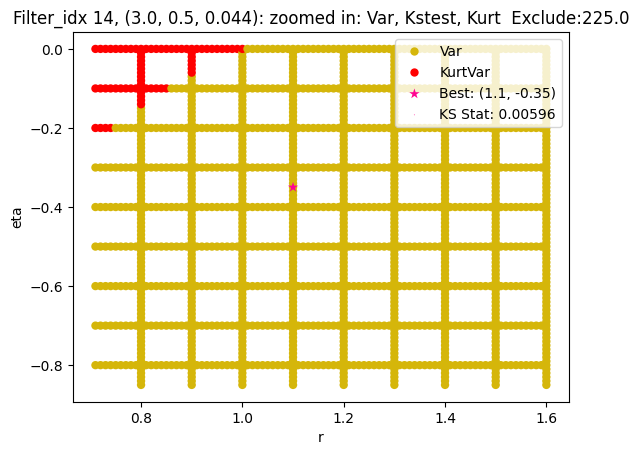

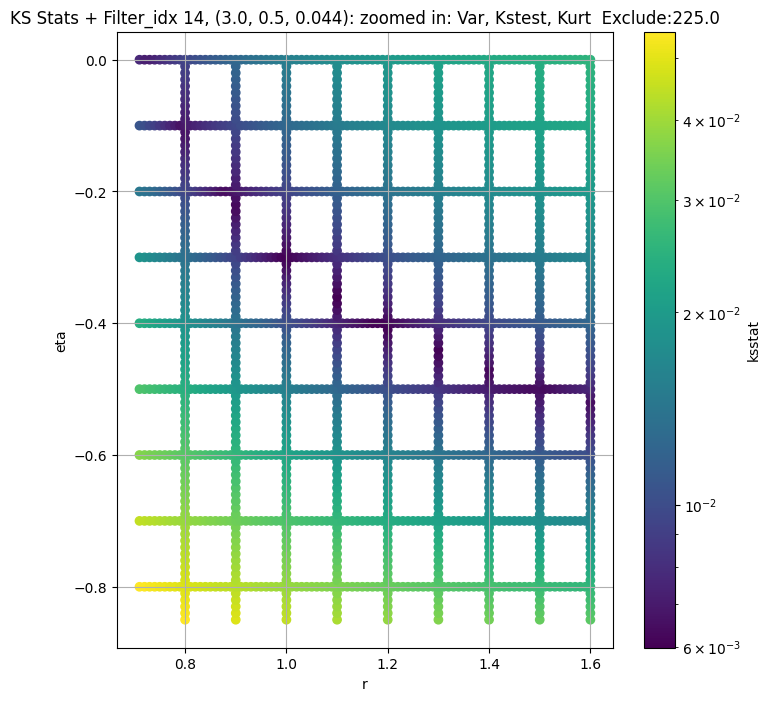

Filter_idx 15, (3.0, 0.5, 0.065):


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 15, 50.0 + 100 = 150, ksstat: 0.0044044233095825724, var: 7.288418253925502


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 15, 50.0 + 75 = 125, ksstat: 0.004247515307433669, var: 7.360954580992243


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 15, 50.0 + 50 = 100, ksstat: 0.004172189991490216, var: 7.439502291737429


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 15, 50.0 + 25 = 75, ksstat: 0.004234390838164681, var: 7.526073838643241


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 15, 50.0 + 0 = 50, ksstat: 0.004088820737323695, var: 7.624329544006402


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 15, 50.0 + -25 = 25, ksstat: 0.004181367250609858, var: 7.742283209652853


  0%|          | 0/1620 [00:00<?, ?it/s]

Finding Minimum after computing 1620 CDFs
filter_idx 15, 50.0 + -50 = 0, ksstat: 0.004006218001032402, var: 7.9516467814857625
Number of samples: 100000, Without approximation : 49152000.0


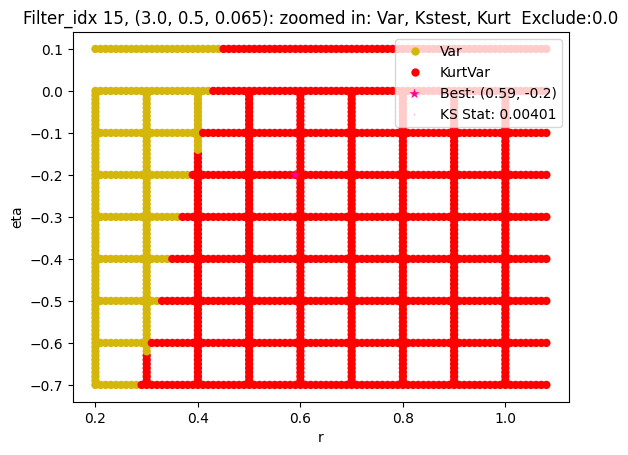

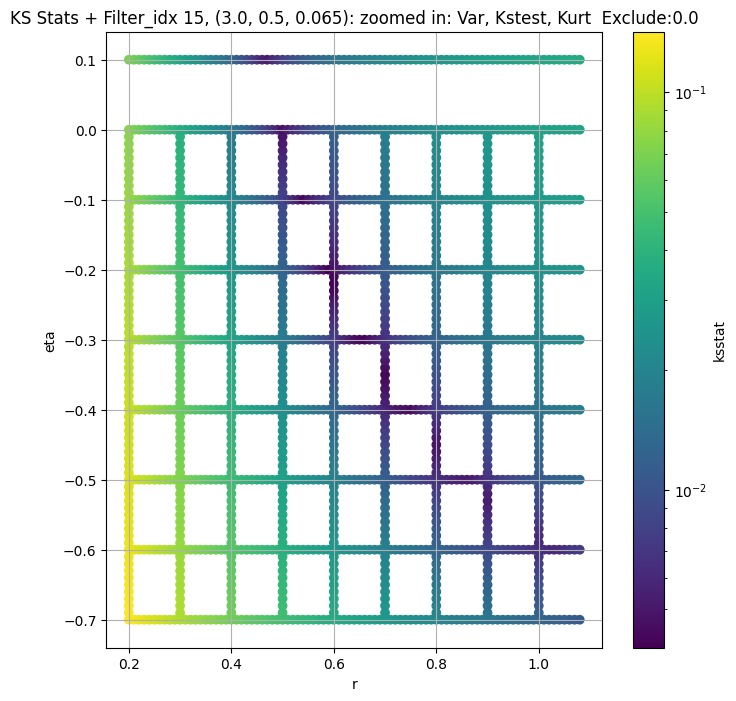

Filter_idx 16, (3.0, 0.5, 0.096):


  0%|          | 0/1152 [00:00<?, ?it/s]

Finding Minimum after computing 1152 CDFs
filter_idx 16, 0.0 + 100 = 100, ksstat: 0.004137821378277118, var: 2.828302960790587


  0%|          | 0/1152 [00:00<?, ?it/s]

Finding Minimum after computing 1152 CDFs
filter_idx 16, 0.0 + 75 = 75, ksstat: 0.004003065565277464, var: 2.866224537945395


  0%|          | 0/1152 [00:00<?, ?it/s]

Finding Minimum after computing 1152 CDFs
filter_idx 16, 0.0 + 50 = 50, ksstat: 0.00376011034487278, var: 2.909704063967755


  0%|          | 0/1152 [00:00<?, ?it/s]

Finding Minimum after computing 1152 CDFs
filter_idx 16, 0.0 + 25 = 25, ksstat: 0.003552304192063871, var: 2.962827349633713


  0%|          | 0/1152 [00:00<?, ?it/s]

Finding Minimum after computing 1152 CDFs
filter_idx 16, 0.0 + 0 = 0, ksstat: 0.003675814957933232, var: 3.075412676529183
Number of samples: 100000, Without approximation : 49152000.0


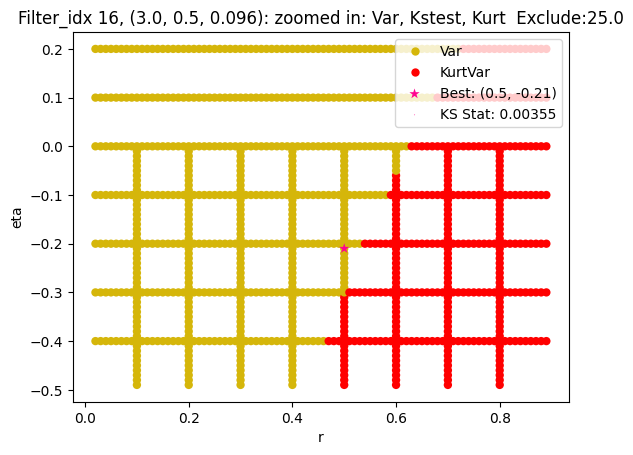

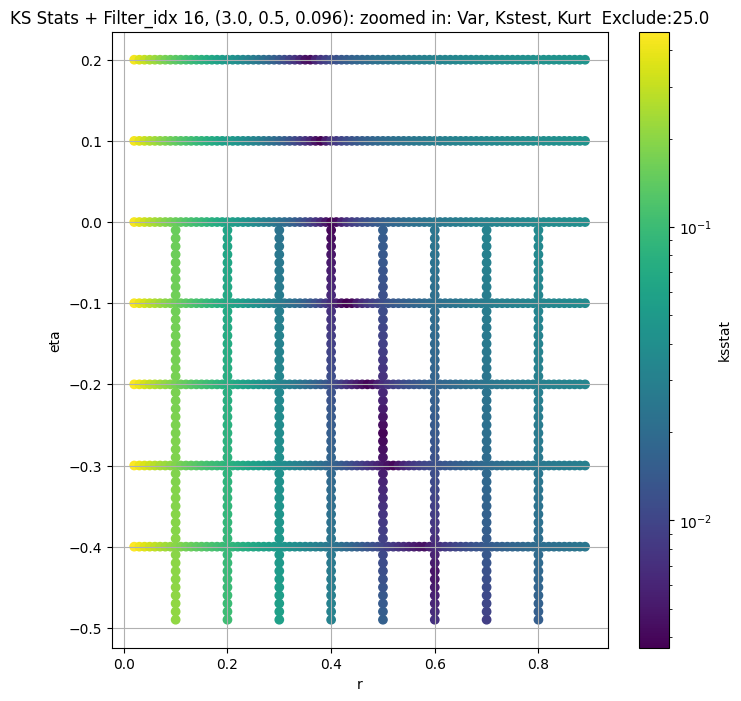

Filter_idx 17, (3.0, 0.5, 0.141):


  0%|          | 0/828 [00:00<?, ?it/s]

Finding Minimum after computing 828 CDFs
filter_idx 17, 0.0 + 100 = 100, ksstat: 0.004852940910861893, var: 1.104357015773784


  0%|          | 0/828 [00:00<?, ?it/s]

Finding Minimum after computing 828 CDFs
filter_idx 17, 0.0 + 75 = 75, ksstat: 0.00429131545376471, var: 1.120708385744351


  0%|          | 0/828 [00:00<?, ?it/s]

Finding Minimum after computing 828 CDFs
filter_idx 17, 0.0 + 50 = 50, ksstat: 0.00394743209848239, var: 1.1396812488430441


  0%|          | 0/828 [00:00<?, ?it/s]

Finding Minimum after computing 828 CDFs
filter_idx 17, 0.0 + 25 = 25, ksstat: 0.00317545983531764, var: 1.1634052358951434


  0%|          | 0/828 [00:00<?, ?it/s]

Finding Minimum after computing 828 CDFs
filter_idx 17, 0.0 + 0 = 0, ksstat: 0.0027715603582998127, var: 1.225489089803893
Number of samples: 100000, Without approximation : 49152000.0


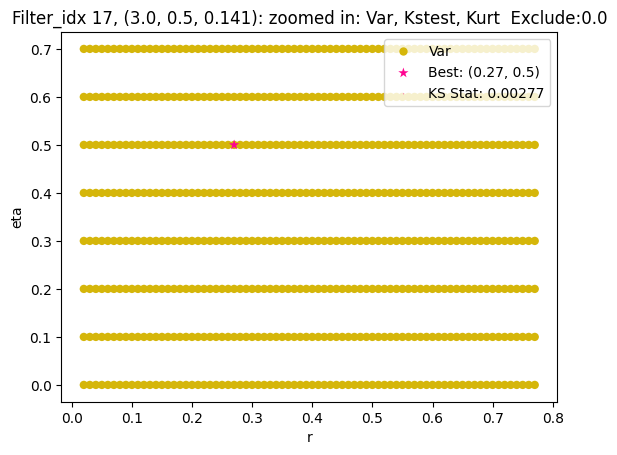

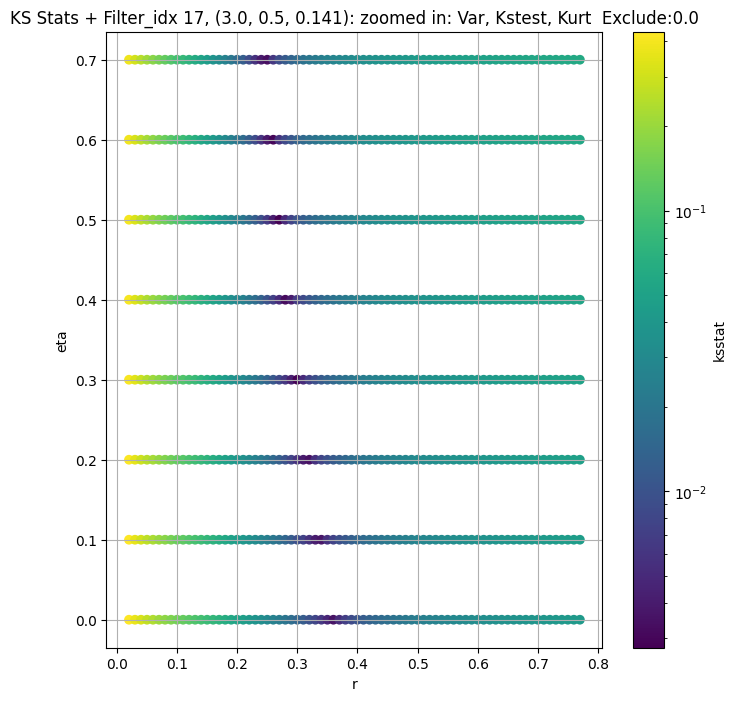

Filter_idx 18, (3.0, 0.5, 0.208):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 18, 50.0 + 100 = 150, ksstat: 0.0053227067948390175, var: 0.41751344060164125


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 18, 50.0 + 75 = 125, ksstat: 0.004917264879853875, var: 0.4230707080634048


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 18, 50.0 + 50 = 100, ksstat: 0.004464589967664835, var: 0.4291869390148842


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 18, 50.0 + 25 = 75, ksstat: 0.0038847085325163233, var: 0.4360627837981452


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 18, 50.0 + 0 = 50, ksstat: 0.0035563772382824488, var: 0.44407115311639966


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 18, 50.0 + -25 = 25, ksstat: 0.003529348576931768, var: 0.4541790459163697


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 18, 50.0 + -50 = 0, ksstat: 0.004730616530152054, var: 0.47897229005546726
Number of samples: 100000, Without approximation : 49152000.0


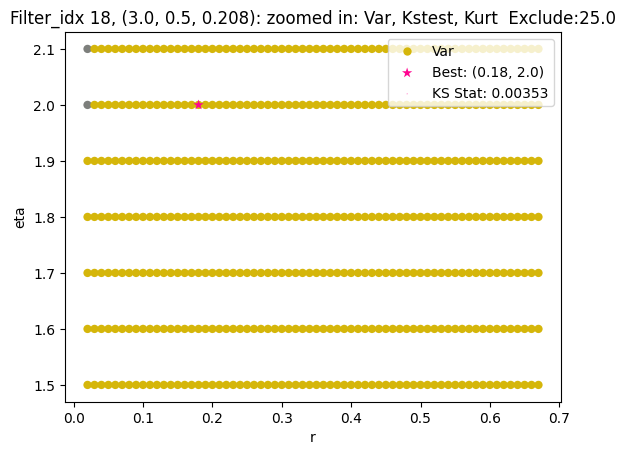

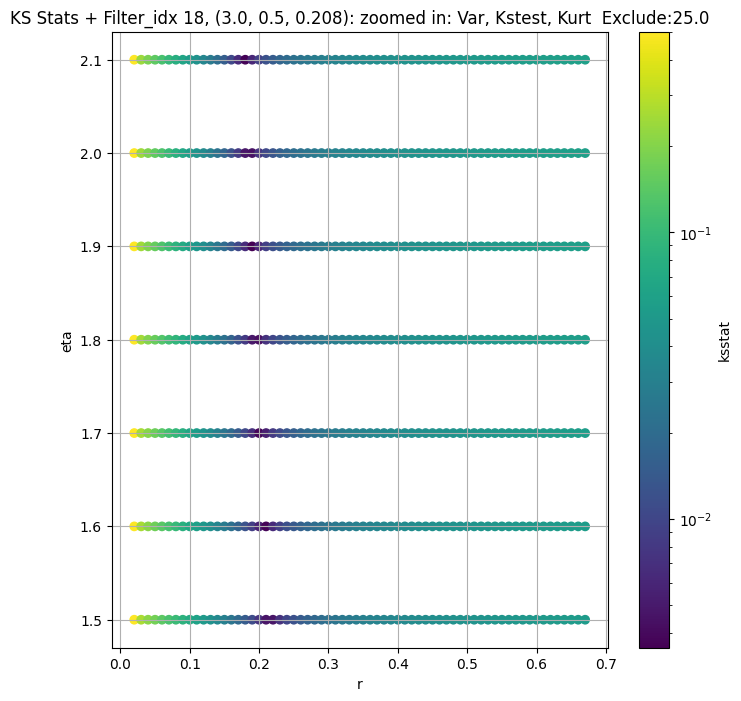

Filter_idx 19, (3.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + 100 = 200, ksstat: 0.004146036766979798, var: 0.14986509876893245


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + 75 = 175, ksstat: 0.0037559404652478846, var: 0.15152593262007705


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + 50 = 150, ksstat: 0.003335661587129491, var: 0.15331632969731374


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + 25 = 125, ksstat: 0.002917799205268634, var: 0.15526652772085459


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + 0 = 100, ksstat: 0.00338157858627941, var: 0.1574229387129078


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + -25 = 75, ksstat: 0.003685153560795129, var: 0.15985861017015937


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + -50 = 50, ksstat: 0.004165269278507244, var: 0.16272205734348252


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + -75 = 25, ksstat: 0.004774504725781947, var: 0.16635144603272117


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 19, 100.0 + -100 = 0, ksstat: 0.006624820789779329, var: 0.1772315965335748
Number of samples: 100000, Without approximation : 49152000.0


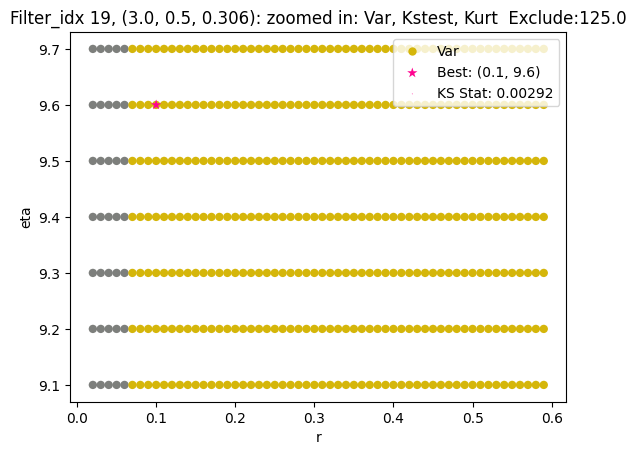

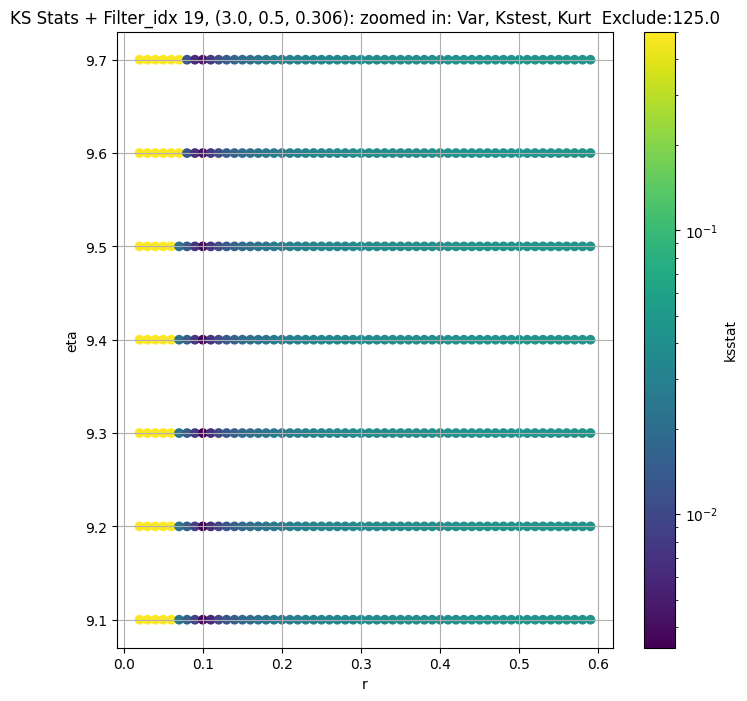

Filter_idx 20, (3.0, 0.5, 0.45):


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + 100 = 200, ksstat: 0.0030812390923066757, var: 0.07526575826156831


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + 75 = 175, ksstat: 0.002843756384730445, var: 0.07583870849855079


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + 50 = 150, ksstat: 0.0026108916332893695, var: 0.07645319084621374


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + 25 = 125, ksstat: 0.002372147977445116, var: 0.07711932795752122


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + 0 = 100, ksstat: 0.002545497640637495, var: 0.07785279060585949


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + -25 = 75, ksstat: 0.002837021234805781, var: 0.07867804794140584


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + -50 = 50, ksstat: 0.0032420327967775386, var: 0.0796433180185848


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + -75 = 25, ksstat: 0.003830673692691744, var: 0.08086738390918732


  0%|          | 0/780 [00:00<?, ?it/s]

Finding Minimum after computing 780 CDFs
filter_idx 20, 100.0 + -100 = 0, ksstat: 0.006131044471704317, var: 0.08570074169810339
Number of samples: 100000, Without approximation : 49152000.0


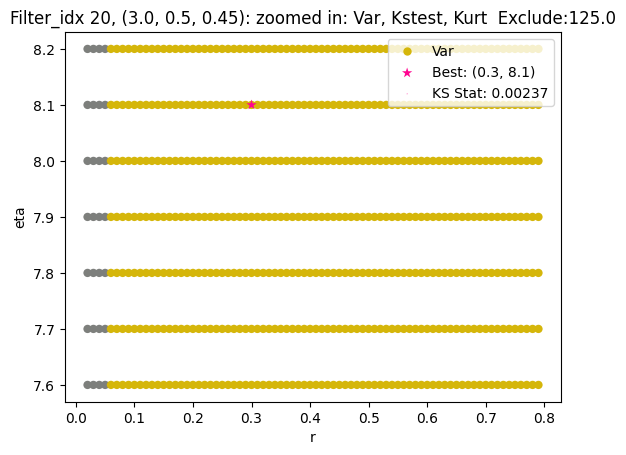

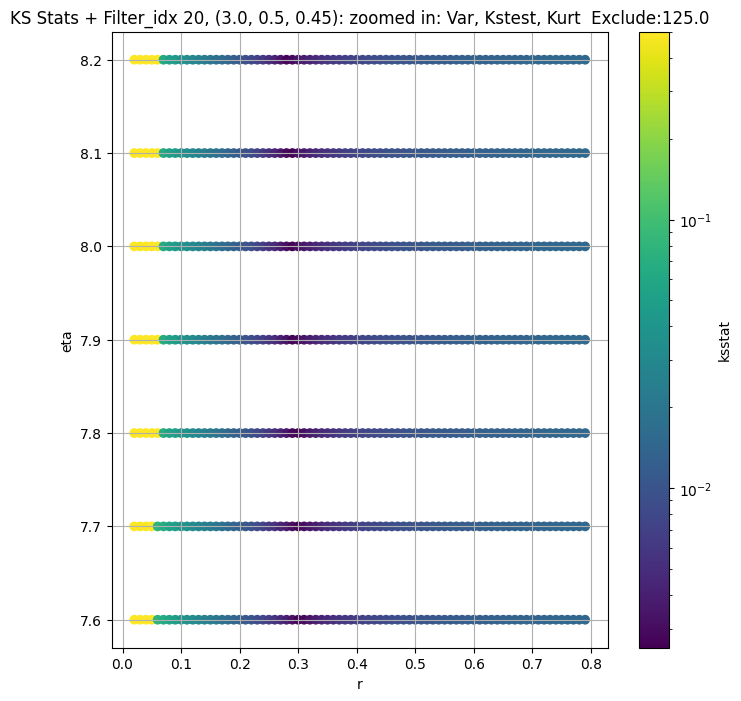

Filter_idx 21, (3.0, 1.0, 0.044):


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 21, 50.0 + 100 = 150, ksstat: 0.006198619041061226, var: 21.55122705743179


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 21, 50.0 + 75 = 125, ksstat: 0.00620326509493252, var: 21.748220350860745


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 21, 50.0 + 50 = 100, ksstat: 0.006202676280283426, var: 21.96104980244969


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 21, 50.0 + 25 = 75, ksstat: 0.006195702593284391, var: 22.194882252378946


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 21, 50.0 + 0 = 50, ksstat: 0.006198309158867099, var: 22.458346825546453


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 21, 50.0 + -25 = 25, ksstat: 0.006197071072105598, var: 22.77174278068206


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 21, 50.0 + -50 = 0, ksstat: 0.006199487054275421, var: 23.260608512645597
Number of samples: 100000, Without approximation : 49152000.0


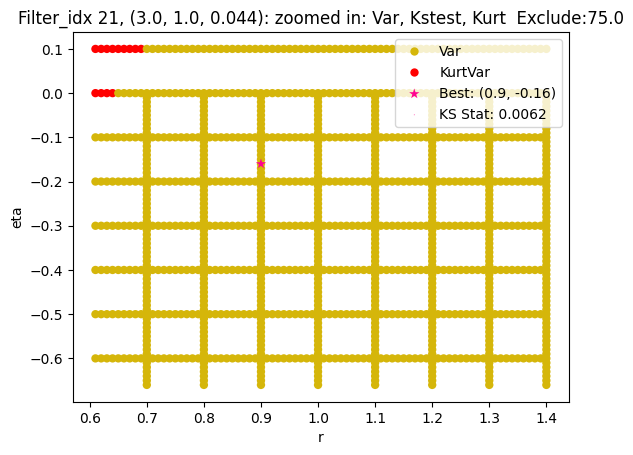

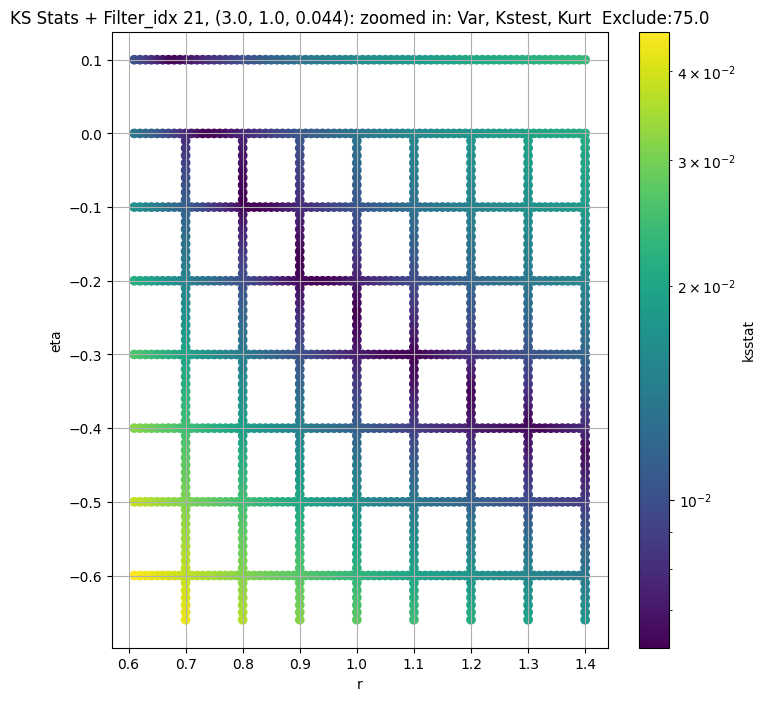

Filter_idx 22, (3.0, 1.0, 0.065):


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + 100 = 200, ksstat: 0.005426441720973951, var: 8.326465897508202


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + 75 = 175, ksstat: 0.005356952886994615, var: 8.400522297845225


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + 50 = 150, ksstat: 0.005335423548646079, var: 8.479078813860157


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + 25 = 125, ksstat: 0.005339925491084252, var: 8.563128063750645


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + 0 = 100, ksstat: 0.0053435325706405745, var: 8.653989932987384


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + -25 = 75, ksstat: 0.0053292289108962665, var: 8.753820718327042


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + -50 = 50, ksstat: 0.005334474865198835, var: 8.866569731170973


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + -75 = 25, ksstat: 0.005333708318666752, var: 9.001911247337434


  0%|          | 0/1630 [00:00<?, ?it/s]

Finding Minimum after computing 1630 CDFs
filter_idx 22, 100.0 + -100 = 0, ksstat: 0.005330138008028729, var: 9.245448100973675
Number of samples: 100000, Without approximation : 49152000.0


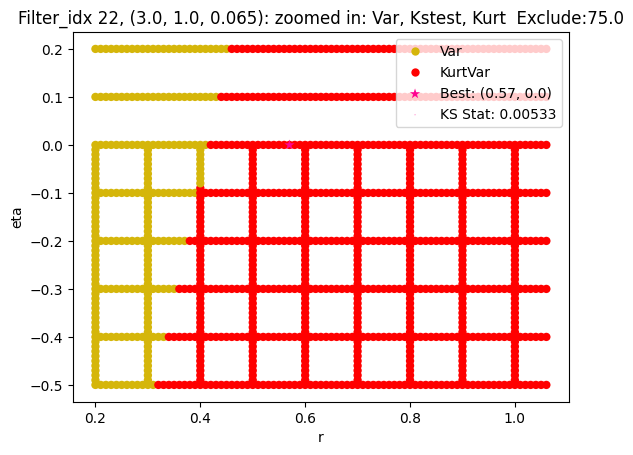

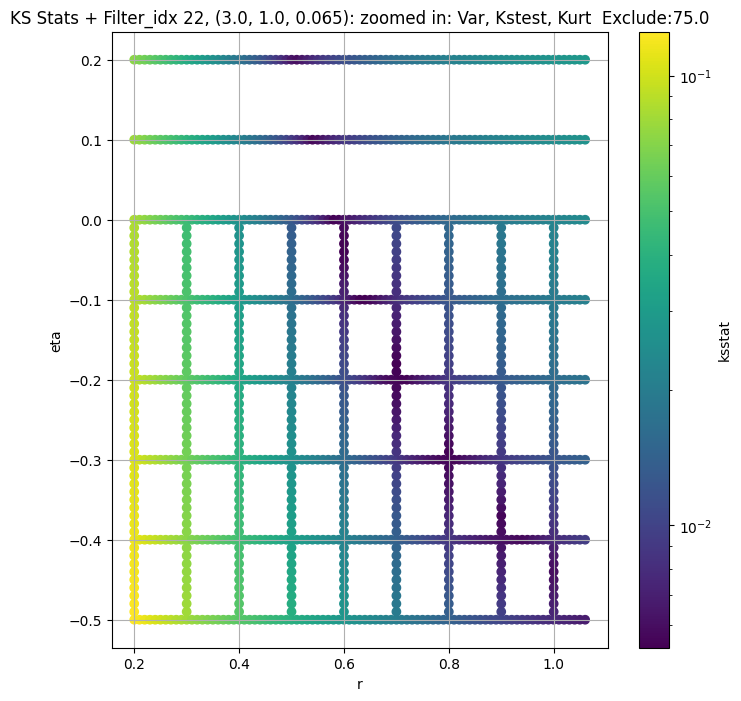

Filter_idx 23, (3.0, 1.0, 0.096):


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + 100 = 200, ksstat: 0.004840249054630319, var: 3.2057854351671082


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + 75 = 175, ksstat: 0.004599895550220778, var: 3.238088924169736


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + 50 = 150, ksstat: 0.004417754722655487, var: 3.272467308128194


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + 25 = 125, ksstat: 0.004155039825729512, var: 3.3093741516484125


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + 0 = 100, ksstat: 0.0041060677780456745, var: 3.3494677753085416


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + -25 = 75, ksstat: 0.003814089222993311, var: 3.393905698267684


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + -50 = 50, ksstat: 0.0038848224945861043, var: 3.4447921821025855


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + -75 = 25, ksstat: 0.003971483654903962, var: 3.5071481786482317


  0%|          | 0/1539 [00:00<?, ?it/s]

Finding Minimum after computing 1539 CDFs
filter_idx 23, 100.0 + -100 = 0, ksstat: 0.003700004320752792, var: 3.6389461351802423
Number of samples: 100000, Without approximation : 49152000.0


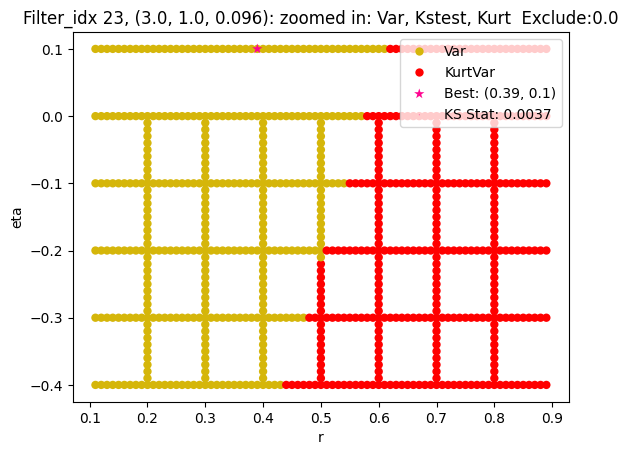

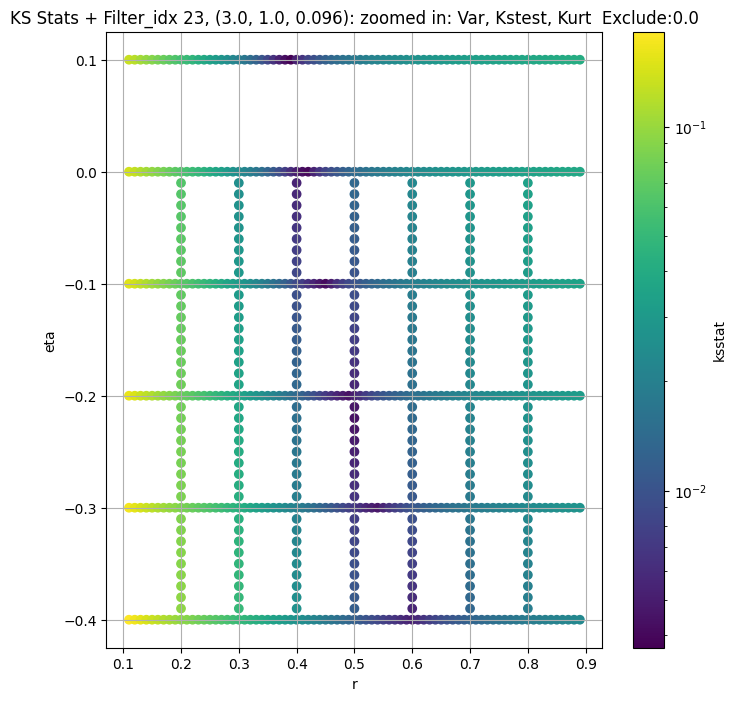

Filter_idx 24, (3.0, 1.0, 0.141):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 24, 0.0 + 100 = 100, ksstat: 0.005405856426684674, var: 1.3054143679553774


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 24, 0.0 + 75 = 75, ksstat: 0.004869468173115642, var: 1.3256480816671135


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 24, 0.0 + 50 = 50, ksstat: 0.004529483221603944, var: 1.3490742242351663


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 24, 0.0 + 25 = 25, ksstat: 0.0038181734624371244, var: 1.3782037109102552


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 24, 0.0 + 0 = 0, ksstat: 0.002709773848552588, var: 1.4474482022464124
Number of samples: 100000, Without approximation : 49152000.0


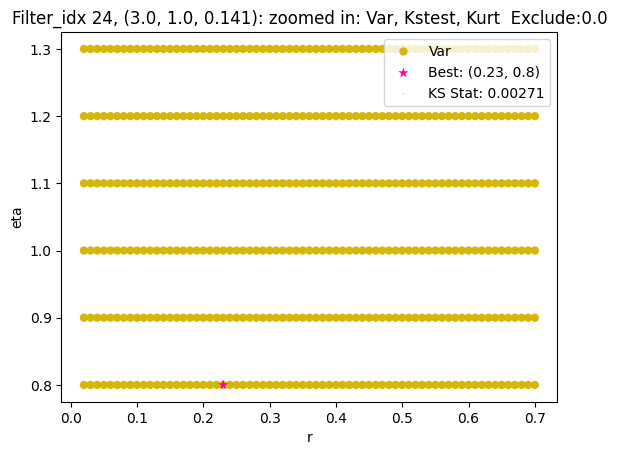

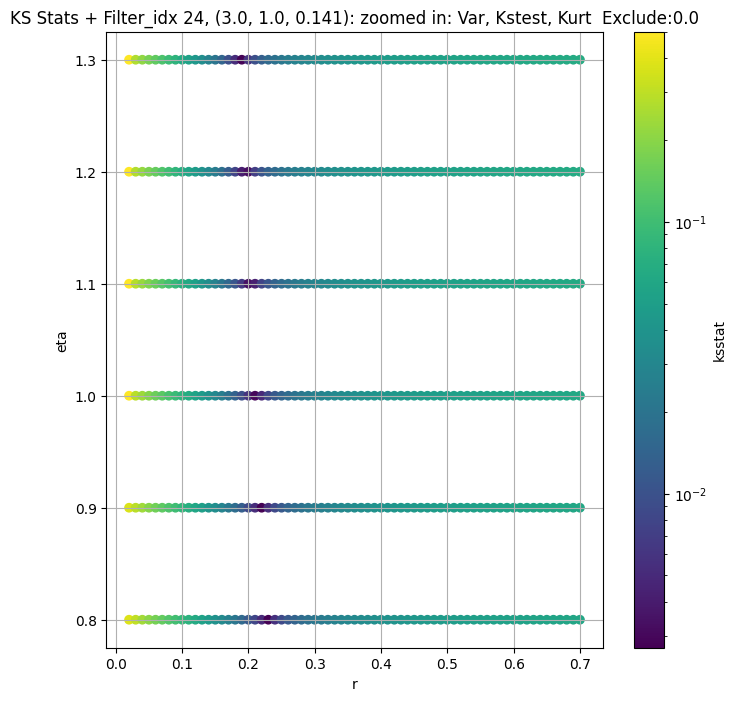

Filter_idx 25, (3.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 50.0 + 100 = 150, ksstat: 0.0055239018121545705, var: 0.4781526814087053


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 50.0 + 75 = 125, ksstat: 0.005098864298528738, var: 0.48502611228195647


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 50.0 + 50 = 100, ksstat: 0.00461125050911948, var: 0.49258832199607244


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 50.0 + 25 = 75, ksstat: 0.004007884287283235, var: 0.5010799874076823


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 50.0 + 0 = 50, ksstat: 0.0035670559144653016, var: 0.5109550315425831


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 50.0 + -25 = 25, ksstat: 0.003704795923763382, var: 0.5233139215574215


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 25, 50.0 + -50 = 0, ksstat: 0.004845746871912859, var: 0.5596448873863831
Number of samples: 100000, Without approximation : 49152000.0


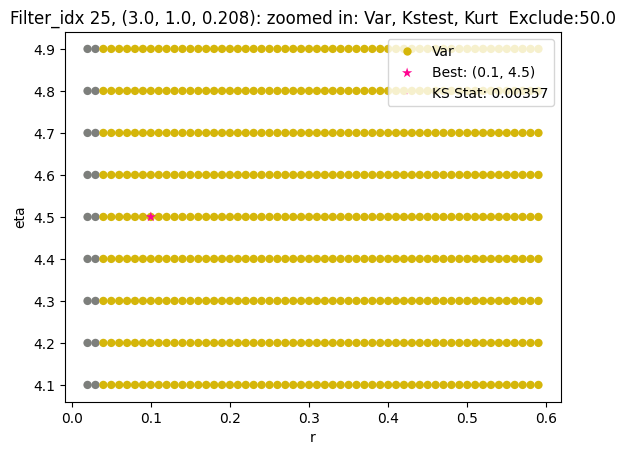

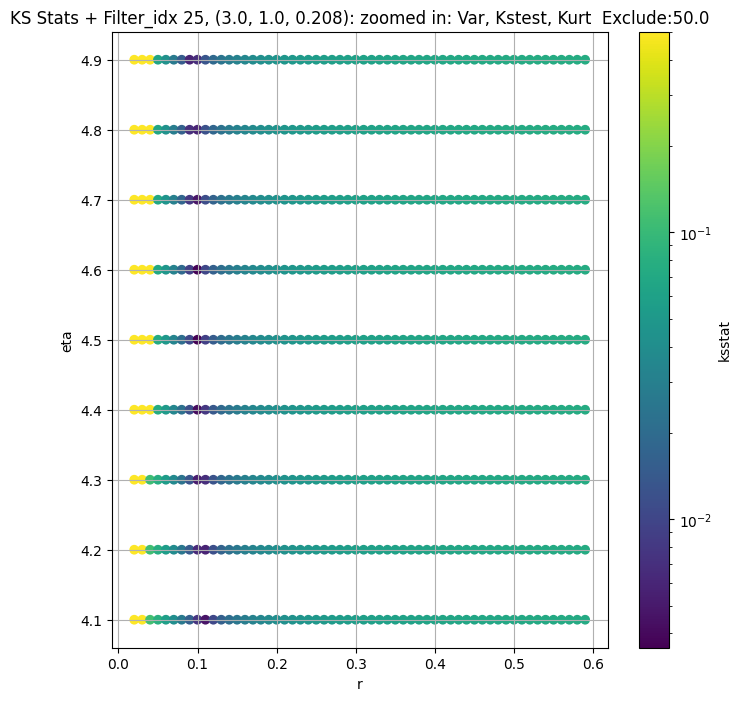

Filter_idx 26, (3.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 100 = 200, ksstat: 0.0042999337522593335, var: 0.17712178938002415


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 75 = 175, ksstat: 0.0039030607993345706, var: 0.17925549566798668


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 50 = 150, ksstat: 0.003524960630493148, var: 0.18155121887522652


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 25 = 125, ksstat: 0.003266610635404843, var: 0.18404825087268747


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + 0 = 100, ksstat: 0.0037117623548240664, var: 0.18680000177645983


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -25 = 75, ksstat: 0.004017346831257762, var: 0.1899030724996015


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -50 = 50, ksstat: 0.004536416706745761, var: 0.1935304668830299


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -75 = 25, ksstat: 0.005110639844927323, var: 0.19810380876102787


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 26, 100.0 + -100 = 0, ksstat: 0.006770381186244401, var: 0.21041808005937068
Number of samples: 100000, Without approximation : 49152000.0


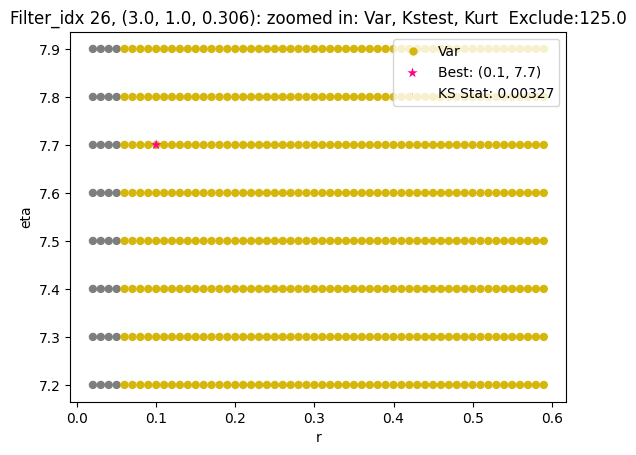

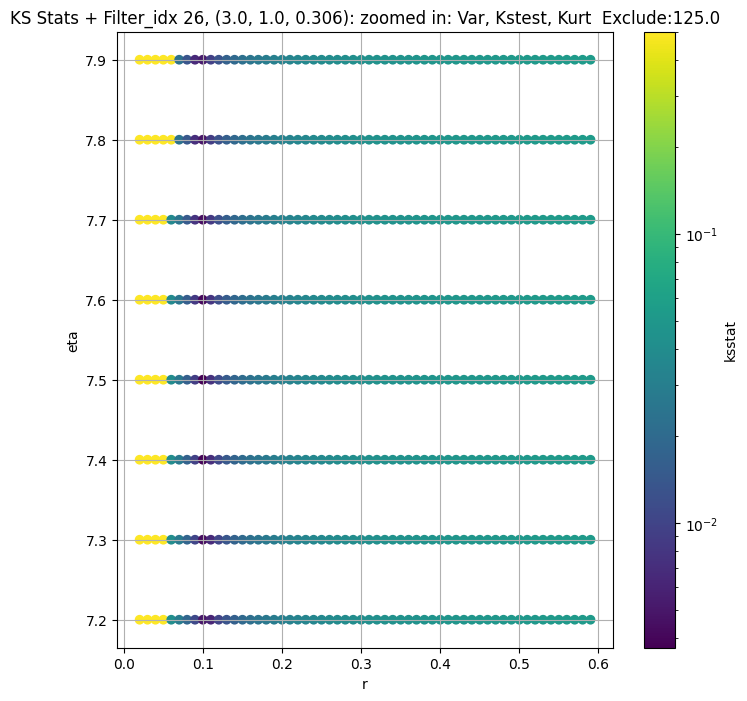

Filter_idx 27, (3.0, 1.0, 0.45):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + 100 = 200, ksstat: 0.003012821417716638, var: 0.08085715981294186


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + 75 = 175, ksstat: 0.0027383860464140763, var: 0.08153762856066206


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + 50 = 150, ksstat: 0.002492683241035021, var: 0.0822665558066136


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + 25 = 125, ksstat: 0.0022481947994124063, var: 0.08305629931398203


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + 0 = 100, ksstat: 0.0020158686994140584, var: 0.08392433565445144


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + -25 = 75, ksstat: 0.0021364105357811747, var: 0.08489962589716073


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + -50 = 50, ksstat: 0.0025274318177490596, var: 0.08603638842988356


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + -75 = 25, ksstat: 0.003175404290566508, var: 0.08746538441890088


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 27, 100.0 + -100 = 0, ksstat: 0.005372279542570135, var: 0.09246518391994601
Number of samples: 100000, Without approximation : 49152000.0


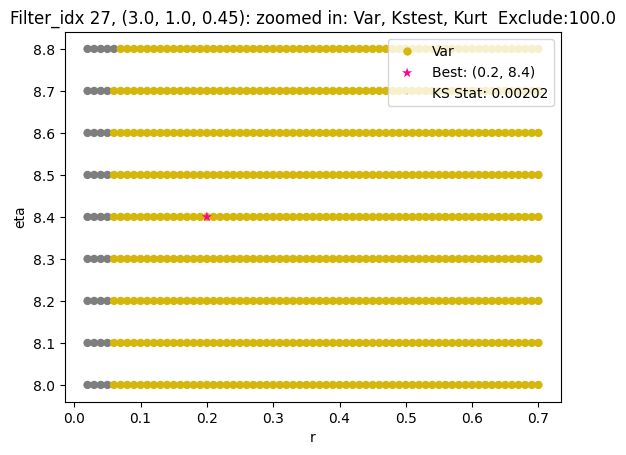

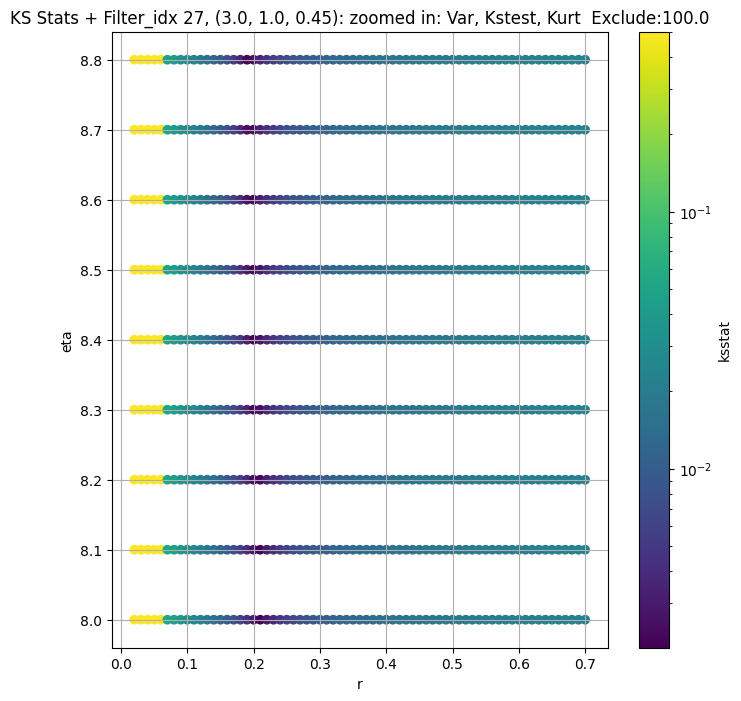

Filter_idx 28, (4.0, 0.5, 0.044):


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 28, 50.0 + 100 = 150, ksstat: 0.0027387497811992567, var: 18.39079826114541


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 28, 50.0 + 75 = 125, ksstat: 0.0023179199012406393, var: 18.555793414207727


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 28, 50.0 + 50 = 100, ksstat: 0.0019504682220616854, var: 18.733896738757064


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 28, 50.0 + 25 = 75, ksstat: 0.0015814137906747794, var: 18.929297710453806


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 28, 50.0 + 0 = 50, ksstat: 0.0011857941584670906, var: 19.14914238930627


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 28, 50.0 + -25 = 25, ksstat: 0.0008234991966889205, var: 19.409260484067016


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 28, 50.0 + -50 = 0, ksstat: 0.0009224468406480169, var: 19.823137239047107
Number of samples: 100000, Without approximation : 49152000.0


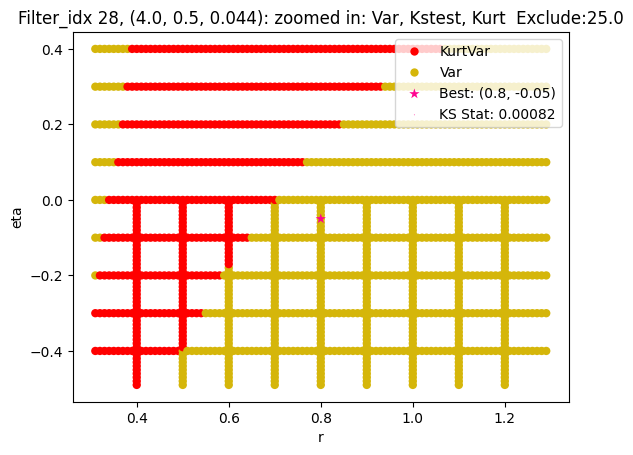

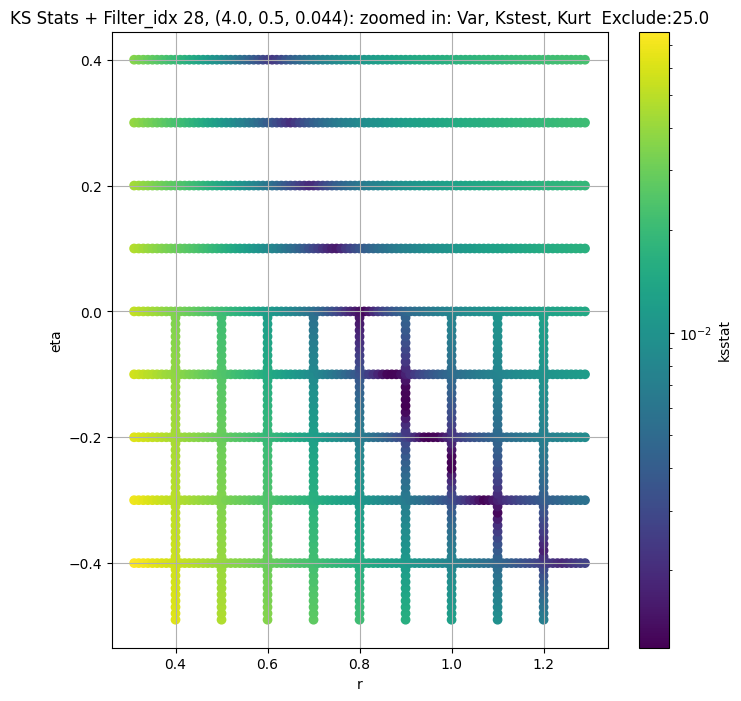

Filter_idx 29, (4.0, 0.5, 0.065):


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 29, 0.0 + 100 = 100, ksstat: 0.00199528251651733, var: 7.206492284956955


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 29, 0.0 + 75 = 75, ksstat: 0.001498656796374953, var: 7.289430239127231


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 29, 0.0 + 50 = 50, ksstat: 0.0010884332011166231, var: 7.383523015273438


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 29, 0.0 + 25 = 25, ksstat: 0.0006762248928837006, var: 7.4967080854435055


  0%|          | 0/1296 [00:00<?, ?it/s]

Finding Minimum after computing 1296 CDFs
filter_idx 29, 0.0 + 0 = 0, ksstat: 0.0010205233637754496, var: 7.719338667334118
Number of samples: 100000, Without approximation : 49152000.0


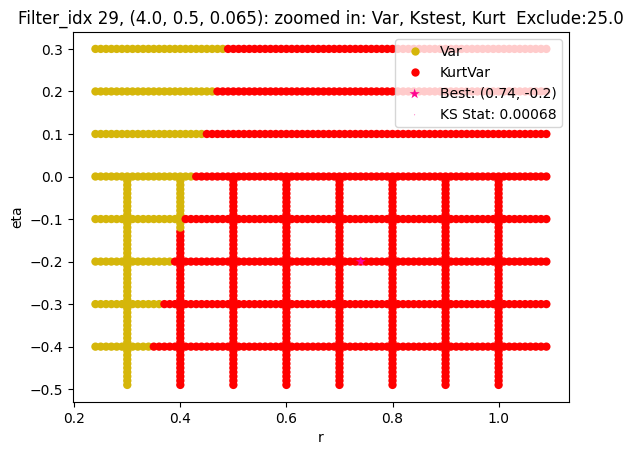

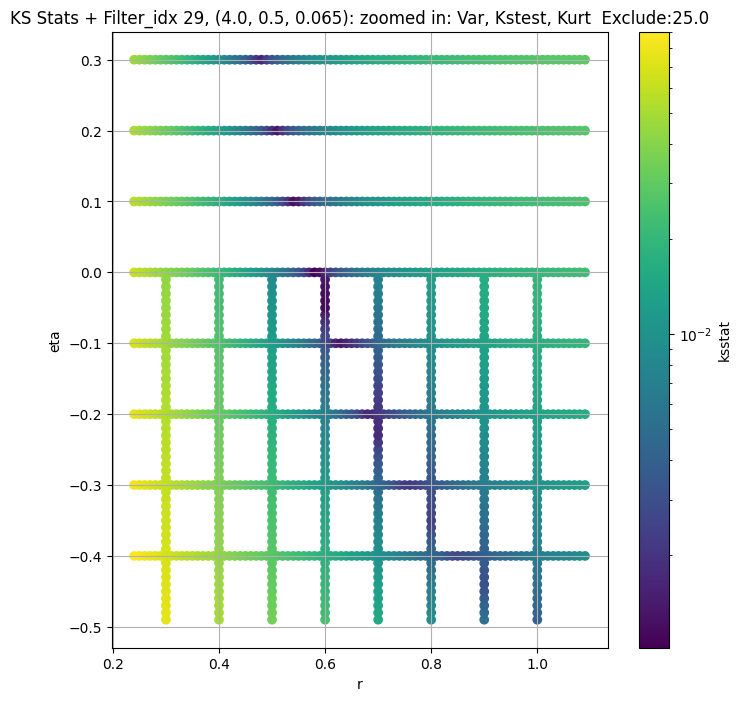

Filter_idx 30, (4.0, 0.5, 0.096):


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 30, 0.0 + 100 = 100, ksstat: 0.0023813702257751146, var: 2.804728584303779


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 30, 0.0 + 75 = 75, ksstat: 0.0019322162682585686, var: 2.841380361033401


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 30, 0.0 + 50 = 50, ksstat: 0.001574160996891158, var: 2.8833640410844166


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 30, 0.0 + 25 = 25, ksstat: 0.0012427283769473885, var: 2.9346677159917856


  0%|          | 0/1368 [00:00<?, ?it/s]

Finding Minimum after computing 1368 CDFs
filter_idx 30, 0.0 + 0 = 0, ksstat: 0.0010025118368507946, var: 3.0344975845464766
Number of samples: 100000, Without approximation : 49152000.0


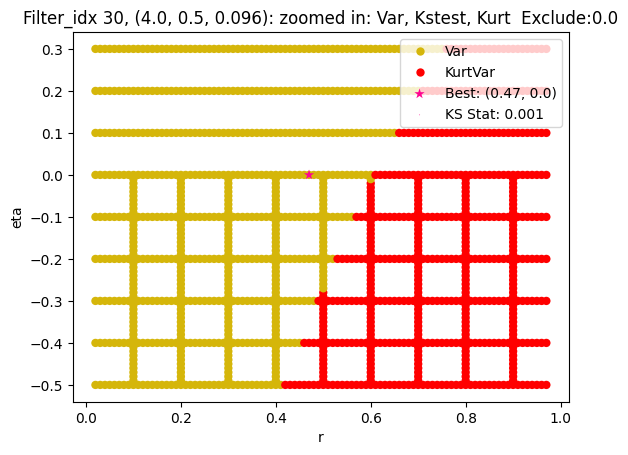

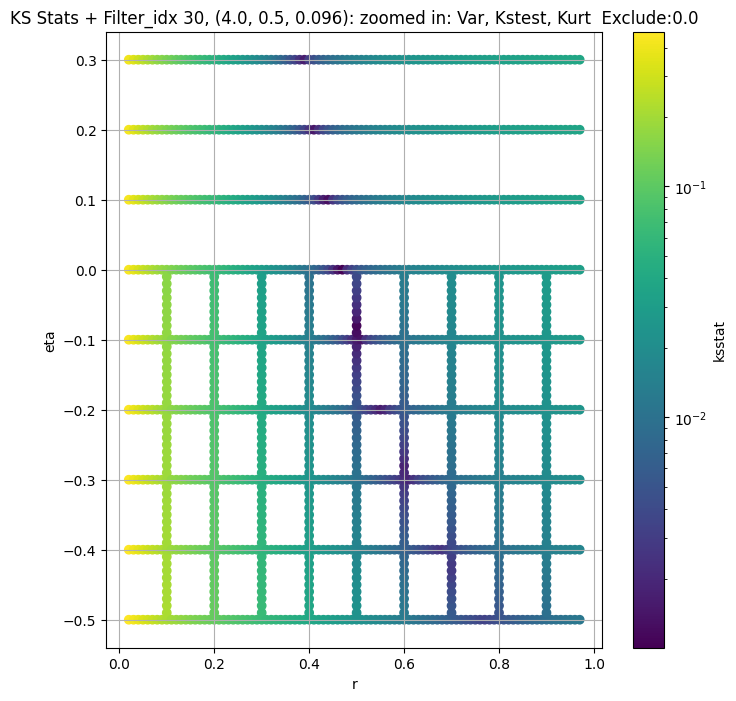

Filter_idx 31, (4.0, 0.5, 0.141):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 31, 0.0 + 100 = 100, ksstat: 0.004695927618252375, var: 1.0797033474813695


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 31, 0.0 + 75 = 75, ksstat: 0.0043155733712393896, var: 1.0956946355313644


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 31, 0.0 + 50 = 50, ksstat: 0.003837263822844675, var: 1.1142537272059965


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 31, 0.0 + 25 = 25, ksstat: 0.003053661744890246, var: 1.13741248700603


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 31, 0.0 + 0 = 0, ksstat: 0.0014676822091224673, var: 1.1942922935584817
Number of samples: 100000, Without approximation : 49152000.0


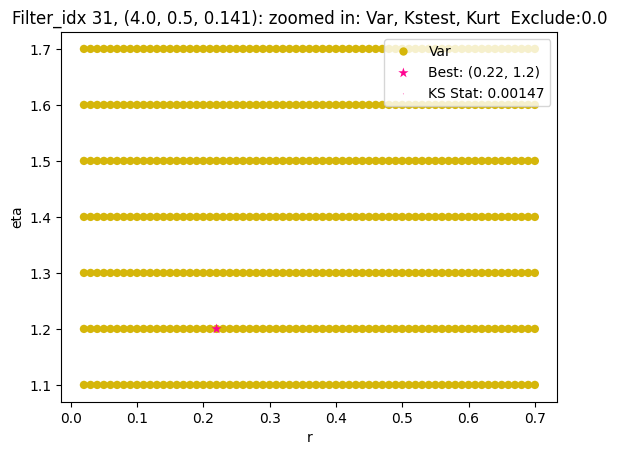

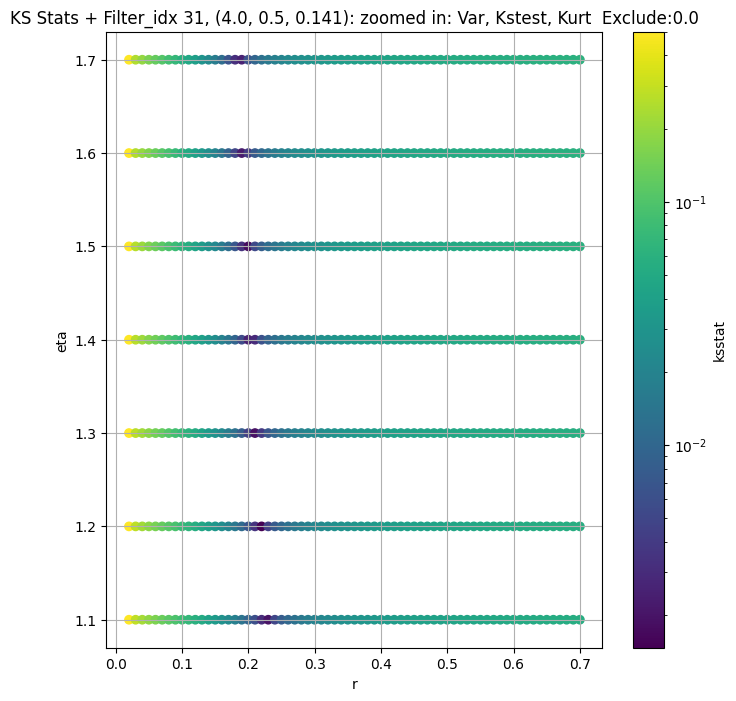

Filter_idx 32, (4.0, 0.5, 0.208):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 32, 50.0 + 100 = 150, ksstat: 0.0043733373069617075, var: 0.39298120615662213


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 32, 50.0 + 75 = 125, ksstat: 0.003928907663160015, var: 0.3981374897841762


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 32, 50.0 + 50 = 100, ksstat: 0.003445707171315846, var: 0.4038081738249151


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 32, 50.0 + 25 = 75, ksstat: 0.002884395930302739, var: 0.41017852367748525


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 32, 50.0 + 0 = 50, ksstat: 0.0025971842461796624, var: 0.4175913421918171


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 32, 50.0 + -25 = 25, ksstat: 0.003125537217020802, var: 0.42692929484654873


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 32, 50.0 + -50 = 0, ksstat: 0.004341564828486633, var: 0.45742259098701704
Number of samples: 100000, Without approximation : 49152000.0


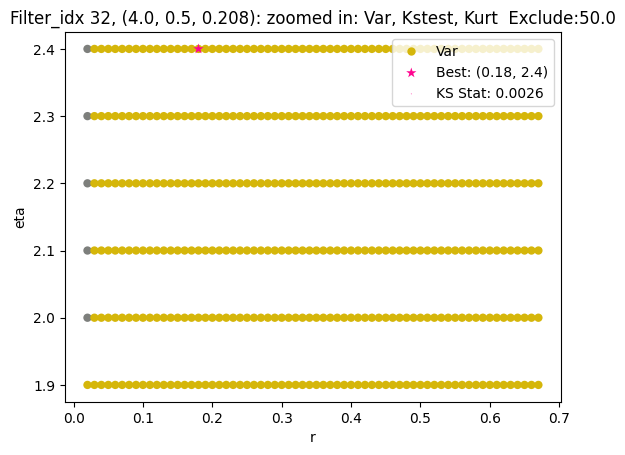

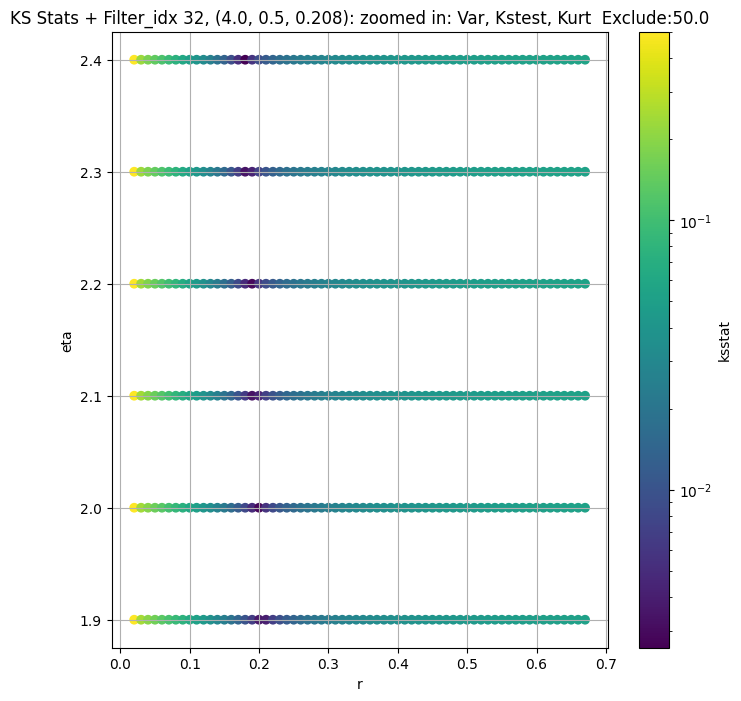

Filter_idx 33, (4.0, 0.5, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + 100 = 200, ksstat: 0.003815210573716036, var: 0.14860888044266085


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + 75 = 175, ksstat: 0.003429116152912425, var: 0.15023484282176605


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + 50 = 150, ksstat: 0.003067853446084963, var: 0.15198538253625496


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + 25 = 125, ksstat: 0.002684649586639552, var: 0.15389018421366119


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + 0 = 100, ksstat: 0.002332640089618015, var: 0.15599453342526926


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + -25 = 75, ksstat: 0.0024958526510968637, var: 0.15837157126659918


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + -50 = 50, ksstat: 0.002902059509888588, var: 0.1611588373316654


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + -75 = 25, ksstat: 0.0034280216905757666, var: 0.164693440423952


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 33, 100.0 + -100 = 0, ksstat: 0.004900926952033743, var: 0.1728036624486485
Number of samples: 100000, Without approximation : 49152000.0


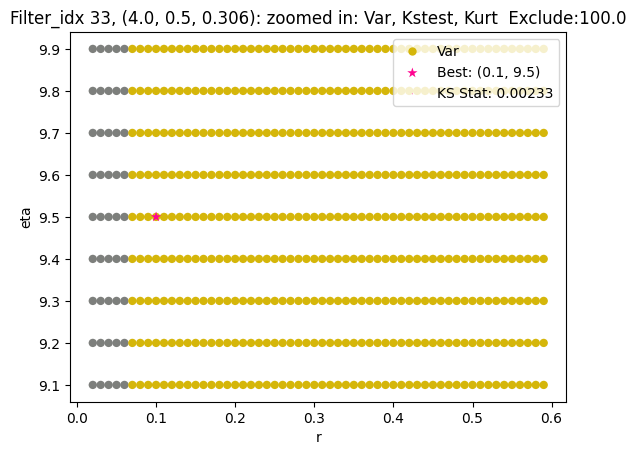

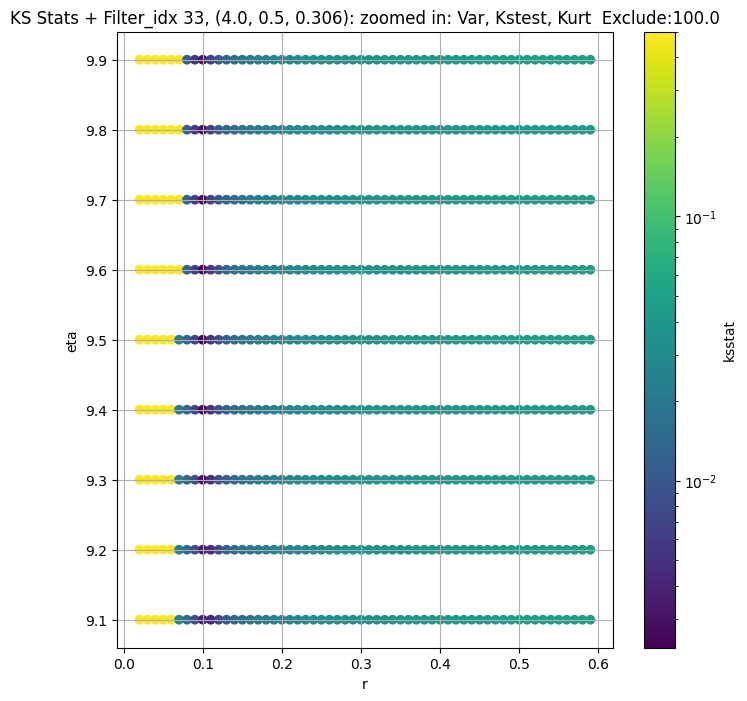

Filter_idx 34, (4.0, 0.5, 0.45):


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 34, 50.0 + 100 = 150, ksstat: 0.002171888362933385, var: 0.06985317931044444


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 34, 50.0 + 75 = 125, ksstat: 0.0018393261380622462, var: 0.07042936898458266


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 34, 50.0 + 50 = 100, ksstat: 0.0015606123381944892, var: 0.07105923958402749


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 34, 50.0 + 25 = 75, ksstat: 0.001313709567780319, var: 0.07176212773282425


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 34, 50.0 + 0 = 50, ksstat: 0.0013458950373215761, var: 0.0725743572062485


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 34, 50.0 + -25 = 25, ksstat: 0.0018800103384737366, var: 0.07358611937305402


  0%|          | 0/702 [00:00<?, ?it/s]

Finding Minimum after computing 702 CDFs
filter_idx 34, 50.0 + -50 = 0, ksstat: 0.00411174942259096, var: 0.07722264024145169
Number of samples: 100000, Without approximation : 49152000.0


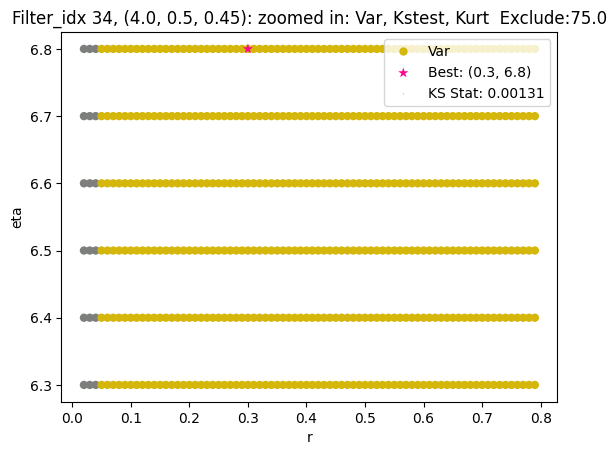

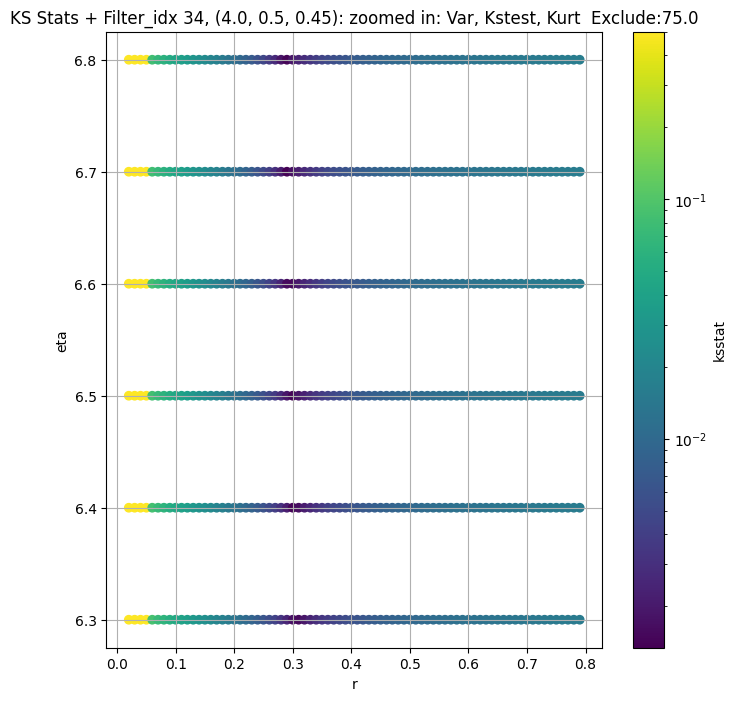

Filter_idx 35, (4.0, 1.0, 0.044):


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 35, 50.0 + 100 = 150, ksstat: 0.0025358754599316136, var: 19.811083223838736


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 35, 50.0 + 75 = 125, ksstat: 0.0022362115491723067, var: 19.987117878135567


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 35, 50.0 + 50 = 100, ksstat: 0.0019215466548501148, var: 20.178017154065124


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 35, 50.0 + 25 = 75, ksstat: 0.001603550365431028, var: 20.388930503746742


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 35, 50.0 + 0 = 50, ksstat: 0.0012639812115492477, var: 20.62862304365102


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 35, 50.0 + -25 = 25, ksstat: 0.0010699422966028438, var: 20.9176274640147


  0%|          | 0/1233 [00:00<?, ?it/s]

Finding Minimum after computing 1233 CDFs
filter_idx 35, 50.0 + -50 = 0, ksstat: 0.0015252056123520041, var: 21.507534137982397
Number of samples: 100000, Without approximation : 49152000.0


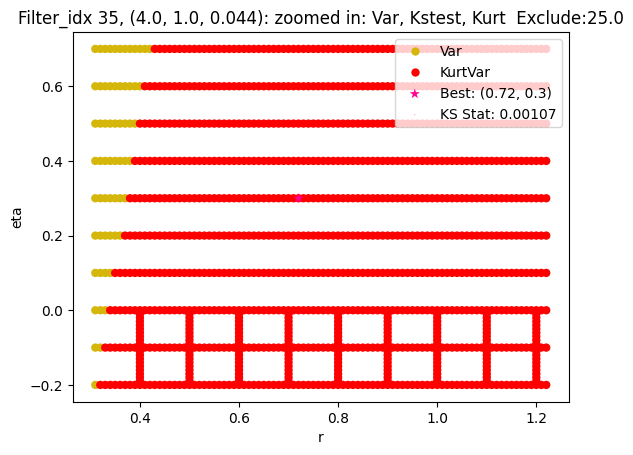

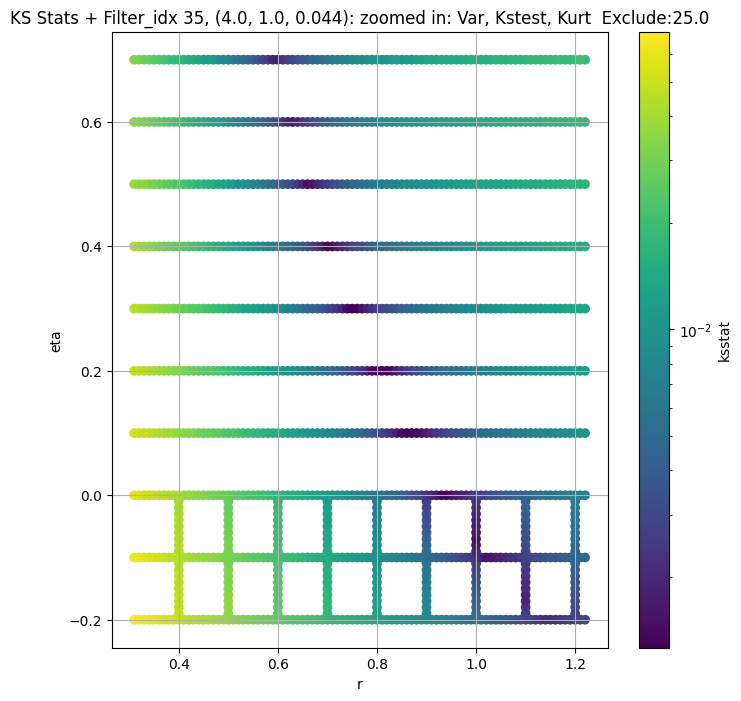

Filter_idx 36, (4.0, 1.0, 0.065):


  0%|          | 0/1557 [00:00<?, ?it/s]

Finding Minimum after computing 1557 CDFs
filter_idx 36, 50.0 + 100 = 150, ksstat: 0.0025734247106387227, var: 8.04605521299569


  0%|          | 0/1557 [00:00<?, ?it/s]

Finding Minimum after computing 1557 CDFs
filter_idx 36, 50.0 + 75 = 125, ksstat: 0.002177583315534585, var: 8.12434331477614


  0%|          | 0/1557 [00:00<?, ?it/s]

Finding Minimum after computing 1557 CDFs
filter_idx 36, 50.0 + 50 = 100, ksstat: 0.0018021322504975096, var: 8.209128907598094


  0%|          | 0/1557 [00:00<?, ?it/s]

Finding Minimum after computing 1557 CDFs
filter_idx 36, 50.0 + 25 = 75, ksstat: 0.0013944130445933123, var: 8.302379443434685


  0%|          | 0/1557 [00:00<?, ?it/s]

Finding Minimum after computing 1557 CDFs
filter_idx 36, 50.0 + 0 = 50, ksstat: 0.0009949350113426236, var: 8.407900113783446


  0%|          | 0/1557 [00:00<?, ?it/s]

Finding Minimum after computing 1557 CDFs
filter_idx 36, 50.0 + -25 = 25, ksstat: 0.0006232922295414944, var: 8.53445790480339


  0%|          | 0/1557 [00:00<?, ?it/s]

Finding Minimum after computing 1557 CDFs
filter_idx 36, 50.0 + -50 = 0, ksstat: 0.0009239433212629988, var: 8.74542738268768
Number of samples: 100000, Without approximation : 49152000.0


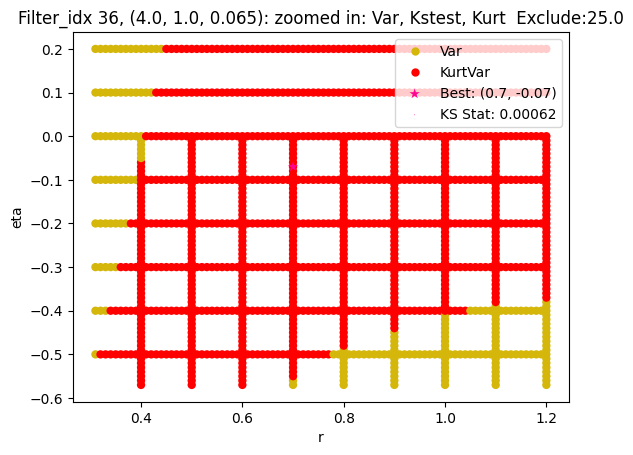

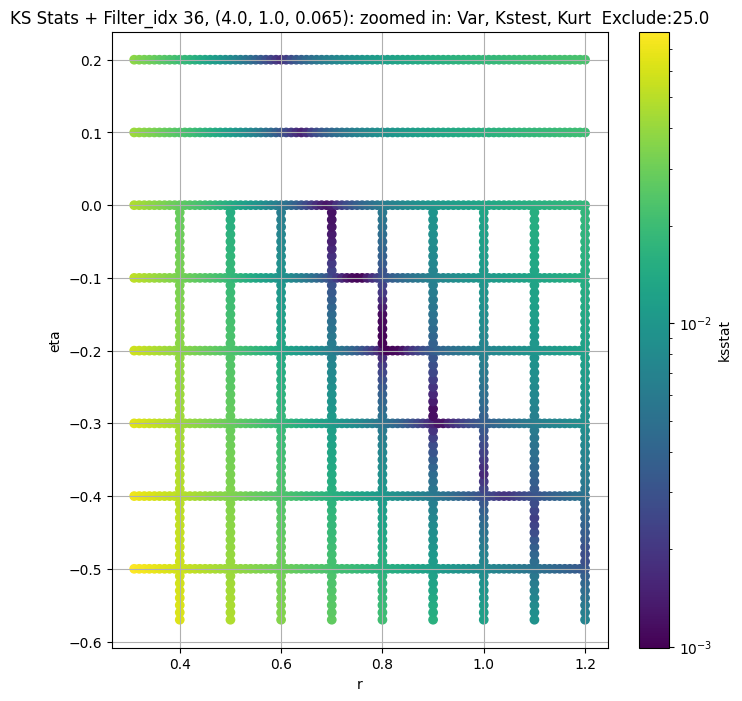

Filter_idx 37, (4.0, 1.0, 0.096):


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 37, 0.0 + 100 = 100, ksstat: 0.002470432676747465, var: 3.1091514064690142


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 37, 0.0 + 75 = 75, ksstat: 0.001893583951725425, var: 3.15049853162989


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 37, 0.0 + 50 = 50, ksstat: 0.0012846063087667975, var: 3.198080376239868


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 37, 0.0 + 25 = 25, ksstat: 0.0009755916514782581, var: 3.2566038224772362


  0%|          | 0/936 [00:00<?, ?it/s]

Finding Minimum after computing 936 CDFs
filter_idx 37, 0.0 + 0 = 0, ksstat: 0.0008741597905213006, var: 3.3732003974041955
Number of samples: 100000, Without approximation : 49152000.0


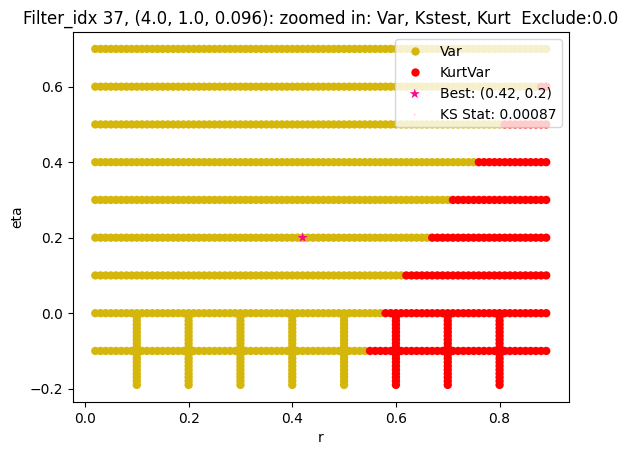

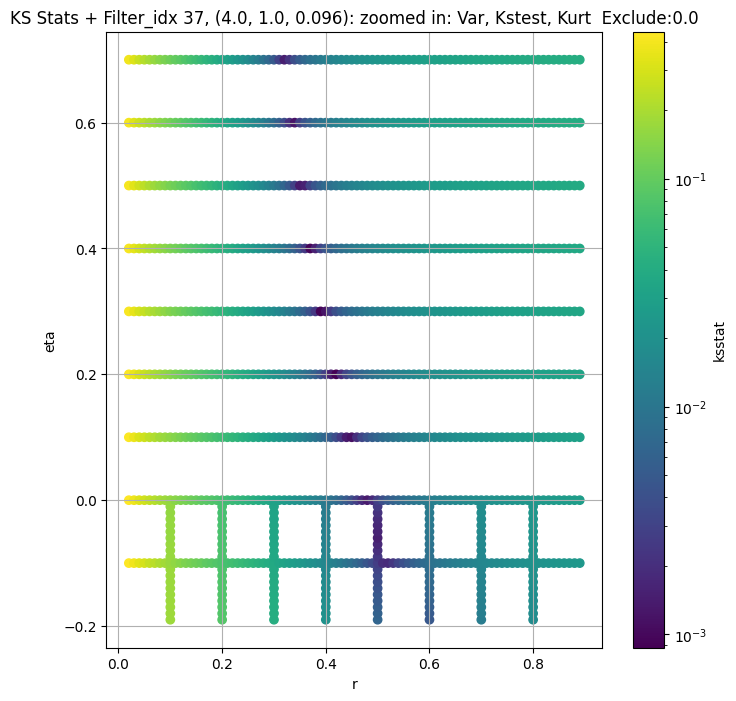

Filter_idx 38, (4.0, 1.0, 0.141):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 38, 0.0 + 100 = 100, ksstat: 0.004096286088507532, var: 1.1924113992341208


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 38, 0.0 + 75 = 75, ksstat: 0.0036488717364717427, var: 1.2101732874307176


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 38, 0.0 + 50 = 50, ksstat: 0.0028979767618011743, var: 1.230650691352598


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 38, 0.0 + 25 = 25, ksstat: 0.0021270061121789266, var: 1.2558419967371044


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 38, 0.0 + 0 = 0, ksstat: 0.0012663509928963618, var: 1.3130548071077943
Number of samples: 100000, Without approximation : 49152000.0


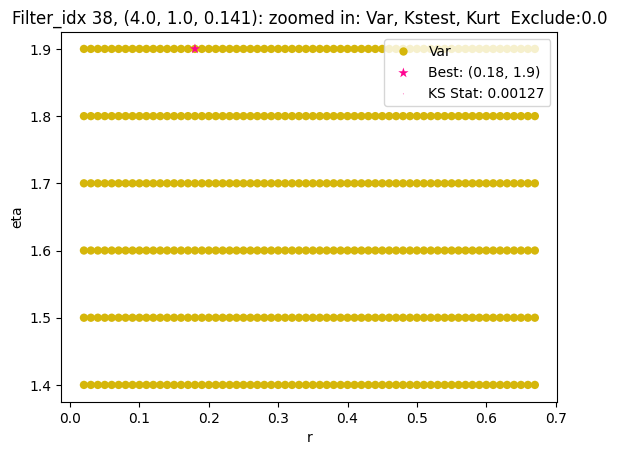

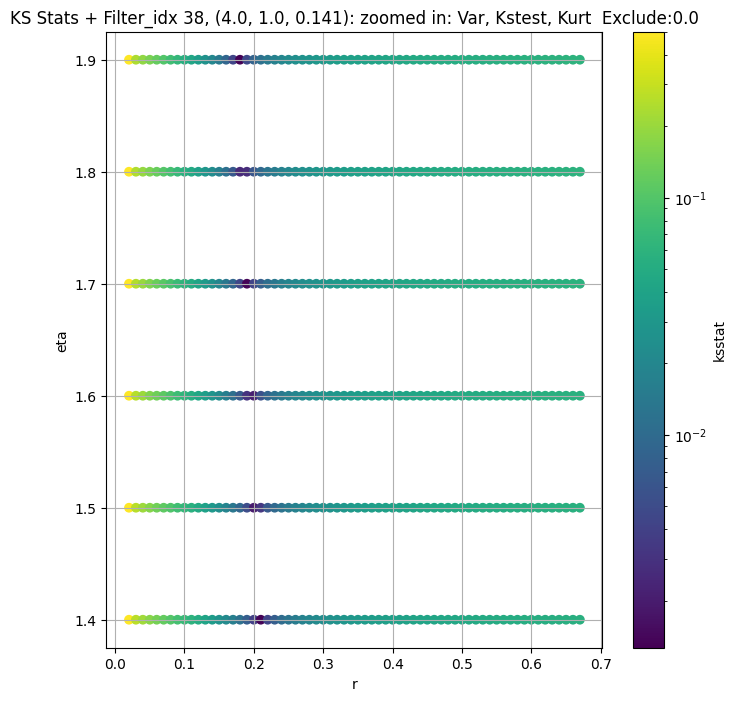

Filter_idx 39, (4.0, 1.0, 0.208):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 50.0 + 100 = 150, ksstat: 0.00469321553137915, var: 0.4377788563180812


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 50.0 + 75 = 125, ksstat: 0.004267559452454512, var: 0.443889749075666


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 50.0 + 50 = 100, ksstat: 0.00375749363186563, var: 0.4506201950424371


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 50.0 + 25 = 75, ksstat: 0.0032178791357228287, var: 0.4581939614155602


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 50.0 + 0 = 50, ksstat: 0.002639945948828982, var: 0.46704743641201035


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 50.0 + -25 = 25, ksstat: 0.00269543199786737, var: 0.4782247487190933


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 39, 50.0 + -50 = 0, ksstat: 0.003731480789533559, var: 0.5087602255392322
Number of samples: 100000, Without approximation : 49152000.0


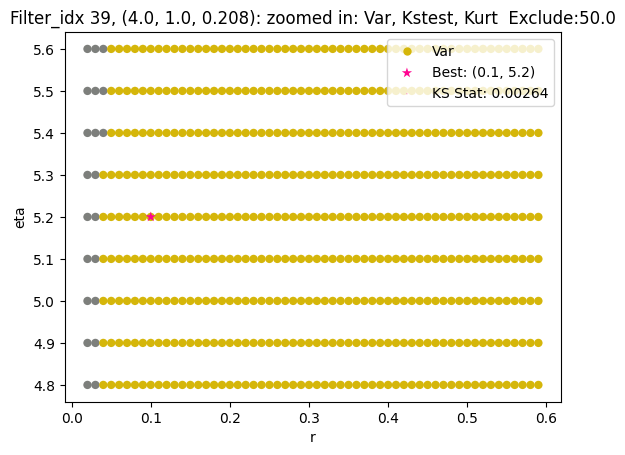

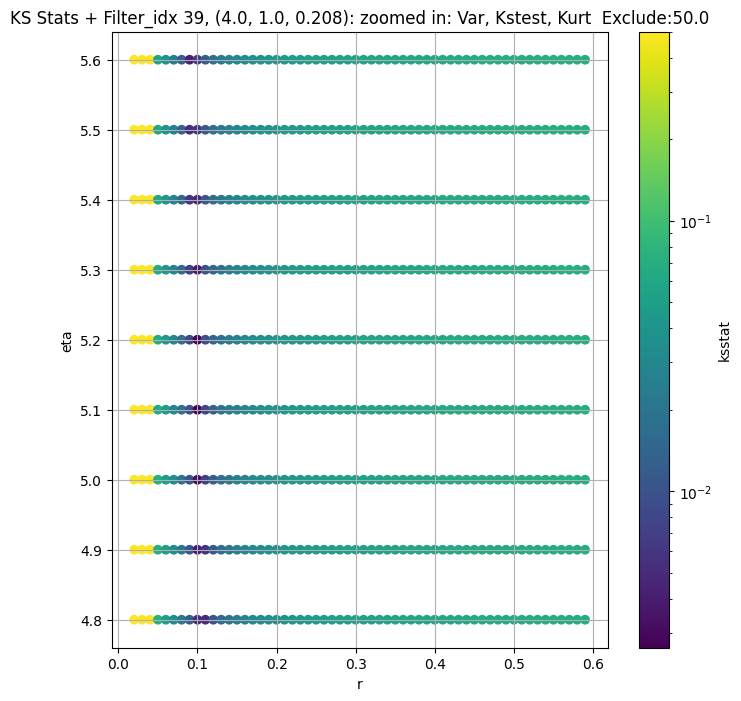

Filter_idx 40, (4.0, 1.0, 0.306):


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + 100 = 200, ksstat: 0.003910577549397328, var: 0.161060819188008


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + 75 = 175, ksstat: 0.003557475387374002, var: 0.16290990725778004


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + 50 = 150, ksstat: 0.003219876944034597, var: 0.16489752593292095


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + 25 = 125, ksstat: 0.0028539956154286523, var: 0.16705563875100704


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + 0 = 100, ksstat: 0.0027134093382323865, var: 0.16943370557436382


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + -25 = 75, ksstat: 0.003123023840584882, var: 0.17211192760081748


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + -50 = 50, ksstat: 0.003489034778121014, var: 0.1752395878666375


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + -75 = 25, ksstat: 0.004030492829738164, var: 0.17918032450057766


  0%|          | 0/522 [00:00<?, ?it/s]

Finding Minimum after computing 522 CDFs
filter_idx 40, 100.0 + -100 = 0, ksstat: 0.005558164203031124, var: 0.18900209414200167
Number of samples: 100000, Without approximation : 49152000.0


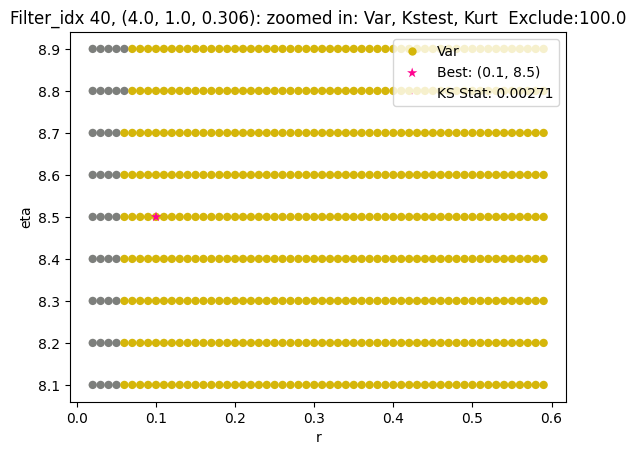

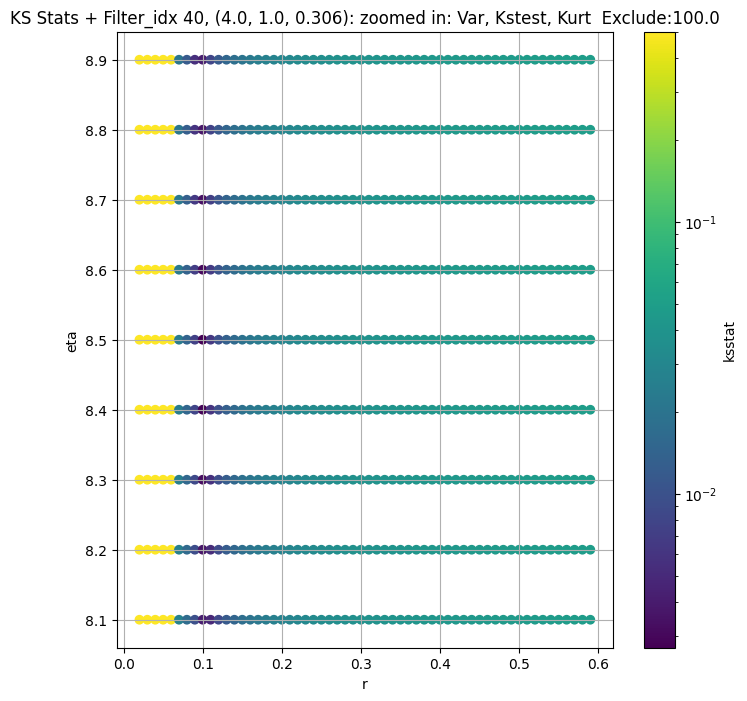

Filter_idx 41, (4.0, 1.0, 0.45):


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 41, 50.0 + 100 = 150, ksstat: 0.0024696380694579564, var: 0.07322737753498934


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 41, 50.0 + 75 = 125, ksstat: 0.0020732198213597557, var: 0.07386007835851507


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 41, 50.0 + 50 = 100, ksstat: 0.0017111913177228037, var: 0.0745513008095034


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 41, 50.0 + 25 = 75, ksstat: 0.00134933265983124, var: 0.0753233570569765


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 41, 50.0 + 0 = 50, ksstat: 0.0010711568615610068, var: 0.07621754436165006


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 41, 50.0 + -25 = 25, ksstat: 0.0015689374113803112, var: 0.07733351377927877


  0%|          | 0/621 [00:00<?, ?it/s]

Finding Minimum after computing 621 CDFs
filter_idx 41, 50.0 + -50 = 0, ksstat: 0.003320895808101132, var: 0.08077627670343035
Number of samples: 100000, Without approximation : 49152000.0


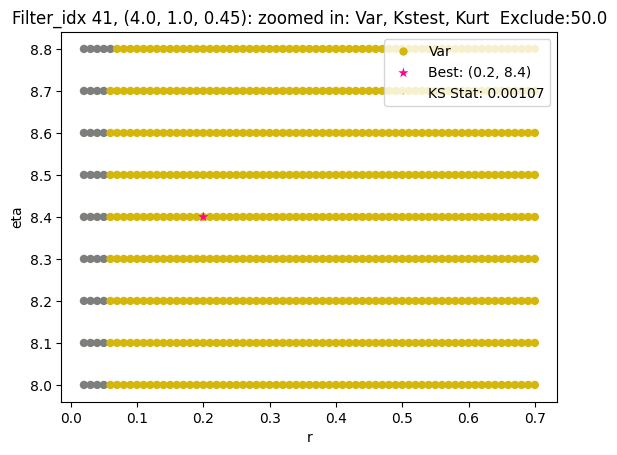

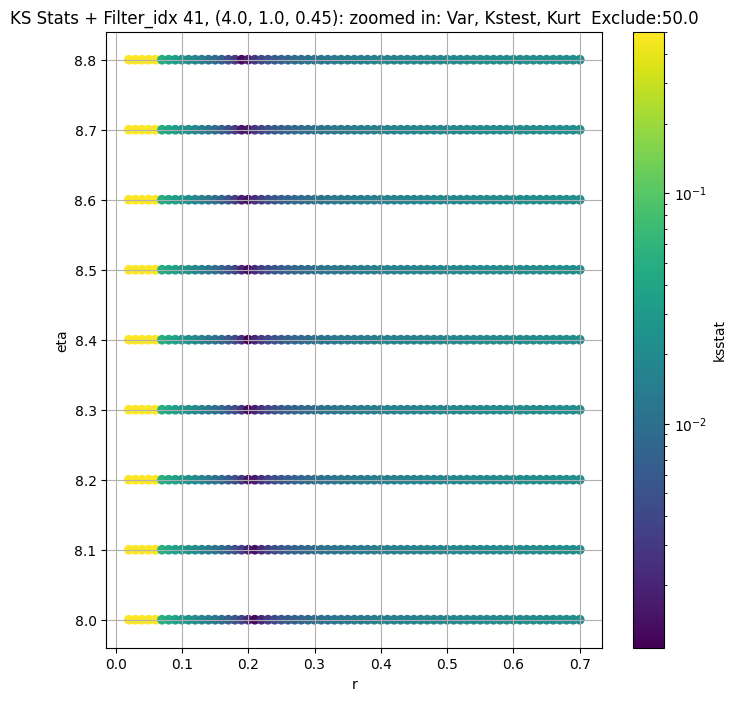

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,initial_scale,initial_exclude_cutoff,best_augmented_var,kstest_stat_cutoff_0.05,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff,n_pval_0.05
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",19.512732,16.061955,24.352984,3.693593,1.240120,35.557062,49152000.0,"(2.0, 0.5, 0.044)",0.030190,...,3.383779e+01,0.0,19.512732,0.000194,0.030190,1.90,-0.50,3.383779e+01,0.0,2133
1,"(2.0, 0.5, 0.065)",7.825587,6.293173,9.732981,4.648551,1.371346,44.666126,49152000.0,"(2.0, 0.5, 0.065)",0.024723,...,1.496877e-18,0.0,7.825587,0.000194,0.024723,0.10,5.50,1.496877e-18,0.0,3000
2,"(2.0, 0.5, 0.096)",3.203549,2.597087,5.412916,11.848032,1.800651,175.540741,49152000.0,"(2.0, 0.5, 0.096)",0.016297,...,4.897036e-02,50.0,2.918750,0.000194,0.016296,0.33,0.70,6.160888e-03,125.0,6750
3,"(2.0, 0.5, 0.141)",1.299067,1.008325,3.309371,37.190033,2.062645,367.029021,49152000.0,"(2.0, 0.5, 0.141)",0.008241,...,6.676242e-19,0.0,1.299067,0.000194,0.008241,0.10,4.80,6.676242e-19,0.0,27000
4,"(2.0, 0.5, 0.208)",0.503130,0.377765,1.474419,47.714934,2.424145,425.693656,49152000.0,"(2.0, 0.5, 0.208)",0.004755,...,4.070785e-20,50.0,0.462242,0.000194,0.004755,0.10,6.10,4.070785e-20,50.0,81000
5,"(2.0, 0.5, 0.306)",0.177674,0.138656,0.550852,60.899960,1.386832,471.200153,49152000.0,"(2.0, 0.5, 0.306)",0.005319,...,1.418348e-23,200.0,0.146834,0.000194,0.005260,0.11,14.00,3.310572e-21,275.0,68343
6,"(2.0, 0.5, 0.45)",0.120857,0.095208,0.387114,62.225351,0.975672,487.250214,49152000.0,"(2.0, 0.5, 0.45)",0.005941,...,4.553416e-11,200.0,0.101959,0.000194,0.005432,0.23,13.00,1.363817e-09,275.0,60750
7,"(2.0, 1.0, 0.044)",25.326290,21.284981,32.067659,3.715394,1.112378,41.577878,49152000.0,"(2.0, 1.0, 0.044)",0.027933,...,4.973388e+01,100.0,23.532288,0.000194,0.027933,6.00,-0.49,4.863728e+01,150.0,2250
8,"(2.0, 1.0, 0.065)",10.787103,8.884289,13.944638,4.497917,1.434039,37.939142,49152000.0,"(2.0, 1.0, 0.065)",0.024671,...,9.186740e-02,200.0,9.538917,0.000194,0.024670,0.46,0.60,2.736862e-01,275.0,3000


In [19]:
master_df_optimized_path = Path(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))

NUM_ITERS = dict(zip(GROUPS, [1]*len(GROUPS))) # By default, does one iteration per group
NUM_SAMPLES_OPTIMIZE = 2000
EXCLUDE_CUTOFFS_OPTIMIZE = np.arange(100, -101, -25)

if RERUN or not master_df_optimized_path.exists():

    if SKIP_OPTIMIZE_STEP:

        master_df['kstest_stat_best'] = master_df['kstest_stat_initial']
        master_df[f'best_r'] = master_df['initial_r']
        master_df[f'best_eta'] = master_df['initial_eta']
        master_df[f'best_scale'] = master_df['initial_scale']
        master_df[f'best_exclude_cutoff'] = master_df['initial_exclude_cutoff']

    else:
        for group in GROUPS: # TODO For quick testing purposes
            print(f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}:")
            master_df.loc[group, 'kstest_stat_best'] = master_df.loc[group, 'kstest_stat_initial']
            master_df.loc[group, 'best_r'] = master_df.loc[group, 'initial_r']
            master_df.loc[group, 'best_eta'] = master_df.loc[group, 'initial_eta']
            master_df.loc[group, 'best_scale'] = master_df.loc[group, 'initial_scale']

            sample = group_data_map[group]
            if len(sample) == 0:
                continue
            initial_r, initial_eta = master_df.loc[group, 'initial_r'], master_df.loc[group, f'initial_eta']
            eps = 0.5
            group_cdfs_df = fine_cdfs_df[(np.abs(master_df.loc[group, 'initial_r'] - fine_cdfs_df['r']) < eps) & 
                                        (np.abs(master_df.loc[group, 'initial_eta'] - fine_cdfs_df['eta']) < eps)].reset_index(drop=True)
            group_cdfs = {x[0]:x[1] for x in group_cdfs_df['(r,eta),cdf']}

            for adjust_exclude_cutoff in EXCLUDE_CUTOFFS_OPTIMIZE: # -50, -25, 0, 25, 50
                
                exclude_cutoff = int(max(0, adjust_exclude_cutoff + master_df.loc[group, 'initial_exclude_cutoff']))
                
                if exclude_cutoff == 0:
                    augmented_var = np.var(group_data_map[group])
                else:
                    augmented_var = np.var(group_data_map[group][exclude_cutoff:-exclude_cutoff])                       

                group_cdfs_df['scale'] = np.clip((augmented_var / group_cdfs_df['variance']), 0,  SCALE_CAP)
                ksstats, initial_param, min_stat = gridsearch(sample, group_cdfs, debug=True, scales=group_cdfs_df['scale'])
                
                cutoff_label = generate_cutoff_label(adjust_exclude_cutoff)

                augmented_var_df.loc[group, f"kstest_stat_{cutoff_label}"] = min_stat
                group_cdfs_df[f'ksstat_exclude_{cutoff_label}'] = ksstats
                
                print(f"{GROUP} {group}, {master_df.loc[group, 'initial_exclude_cutoff']} + {adjust_exclude_cutoff} = {exclude_cutoff}, ksstat: {min_stat}, var: {augmented_var}")
                best_adjust = 0

                if min_stat < master_df.loc[group, 'kstest_stat_best']:

                    inital_min_stat = min_stat
                    inital_best_param = initial_param
                    master_df.loc[group, 'kstest_stat_best'] = min_stat
                    initial_scale = group_cdfs_df.loc[(group_cdfs_df["r"] ==  initial_param[0]) & (group_cdfs_df["eta"] ==  initial_param[1])]["scale"].iloc[0]
                    master_df.loc[group, 'best_r'], master_df.loc[group, 'best_eta'] = initial_param
                    master_df.loc[group, 'best_scale'] = initial_scale
                    master_df.loc[group, 'best_exclude_cutoff'] = exclude_cutoff
                    master_df.loc[group, 'best_augmented_var'] = augmented_var
                    augmented_var_df.loc[group, 'best_augmented_var'] = augmented_var
                    best_adjust = adjust_exclude_cutoff

                if exclude_cutoff == 0:
                    break

            cutoff_label = generate_cutoff_label(best_adjust)
            ksstats = group_cdfs_df[f"ksstat_exclude_{cutoff_label}"]
            
            print(f"Number of samples: {sample.size}, Without approximation : {master_df.loc[group, 'total_samples']}")
            
            cutoff = stats.kstwo(n=master_df.loc[group, 'total_samples']).isf(0.05)
            master_df.loc[group, 'kstest_stat_cutoff_0.05'] = cutoff

            best_scales = np.clip((master_df.loc[group, 'best_augmented_var'] / group_cdfs_df['variance']), 0,  SCALE_CAP)

            group_cdfs_df['variance'] = group_cdfs_df['variance'] * best_scales
            group_cdfs_df['kurtosis'] = group_cdfs_df['kurtosis'] * best_scales

            group_cdfs_df = add_tests_to_df(cdfs_df = group_cdfs_df, group = group, var_kurt_df = master_df, ksstats = ksstats).sort_values(['r', 'eta'])

            group_dict = rEtaKsstats_dict[group]
            group_dict.update({'r_optimize' : group_cdfs_df['r'], 'eta_optimize' : group_cdfs_df['eta'], f'ksstat_exclude_{cutoff_label}' : ksstats})
            rEtaKsstats_dict[group] = group_dict

            cols = ['pass_var', 'pass_kstest', 'pass_kurt']
            fig = combo_test_plot(group_cdfs_df, cols, 
                                plot_name=f"{GROUP.capitalize()} {group}, {str(filter_group_map[group])}: zoomed in: {', '.join([col[5:].capitalize() for col in cols])}  Exclude:{master_df.loc[group, 'best_exclude_cutoff']}",
                                best_param=(master_df.loc[group, 'best_r'], master_df.loc[group, f'best_eta']),
                                best_ksstat=master_df.loc[group, 'kstest_stat_best'])
            fig.figure.savefig(os.path.join(CWD, "plots", f"optimized_full_grid_search_combo_plot_layer{group}.jpg"), bbox_inches = 'tight', dpi=100)
            
    master_df['n_pval_0.05'] = master_df.apply(lambda row : find_n_fixed_pval_stat(row.loc['kstest_stat_best'], row.loc['total_samples']), axis = 1)    
    master_df[['total_samples', 'initial_r', 'initial_eta', 'kstest_stat_initial', 'initial_exclude_cutoff', 'best_r', 'best_eta', 'best_scale', 'kstest_stat_best', 'best_exclude_cutoff', 'n_pval_0.05']].to_csv(os.path.join(CWD, "CSVs", 'optimized_params.csv'))
    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df_optimized.csv'))
    augmented_var_df.to_csv(augmented_var_df_path)
    pd.to_pickle(rEtaKsstats_dict, rEtaKsstats_dict_path)

rEtaKsstats_dict = pd.read_pickle(rEtaKsstats_dict_path)
master_df = pd.read_csv(master_df_optimized_path, index_col = GROUP)
augmented_var_df = pd.read_csv(augmented_var_df_path, index_col = GROUP)
master_df

## Comparing Empirical and Computed CDF/PDF

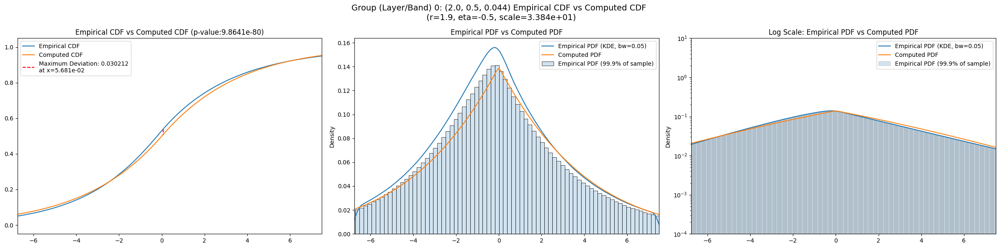

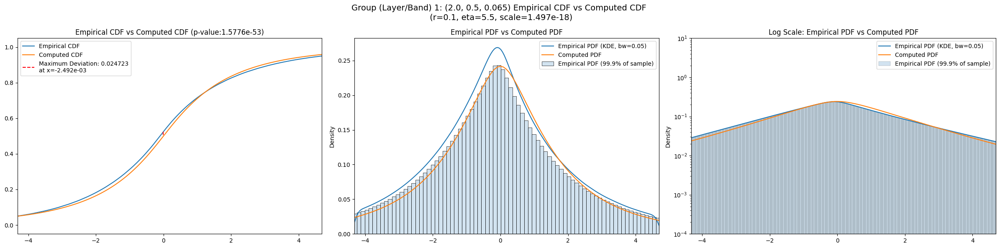

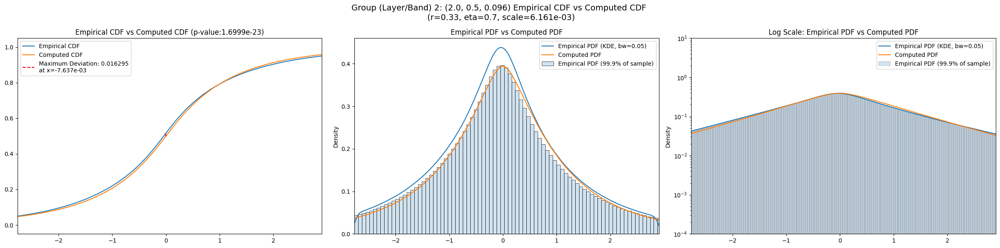

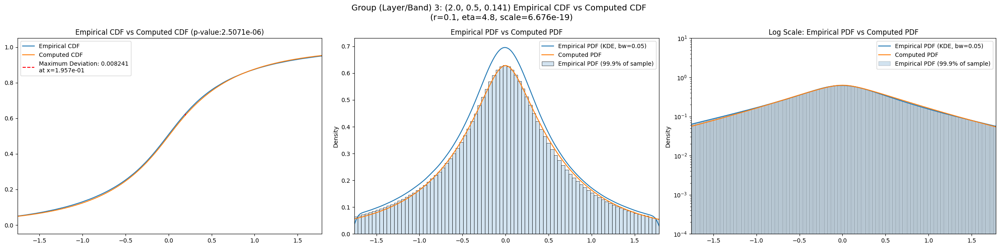

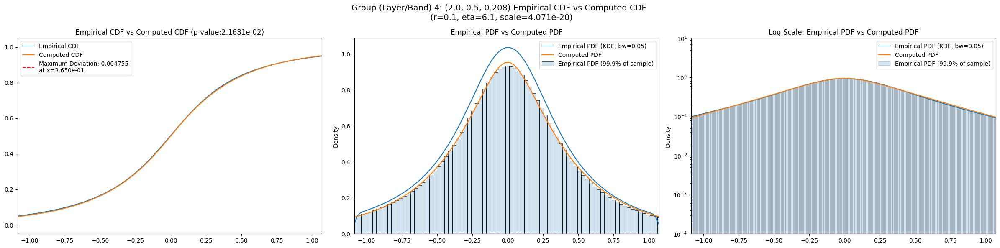

...

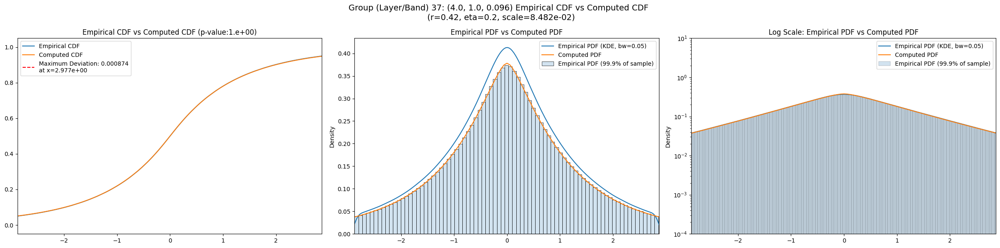

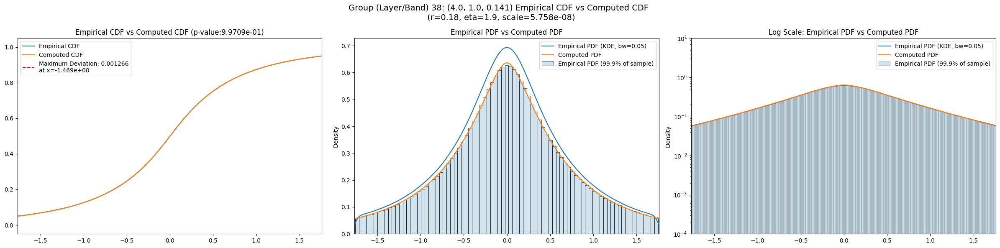

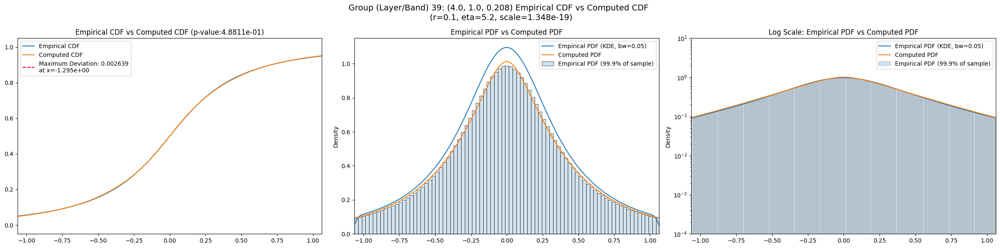

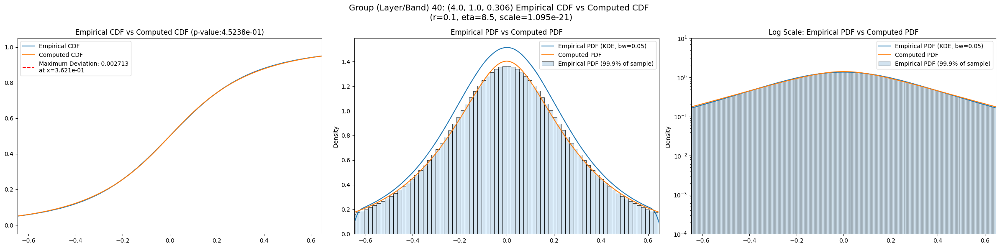

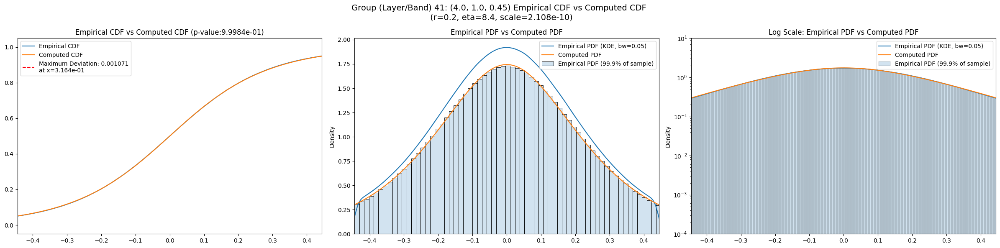

In [20]:
for group in GROUPS:
    group_info = master_df.loc[group]
    best_r = group_info['best_r']
    best_eta = group_info['best_eta']
    best_scale = group_info['best_scale']
    fig = visualize_cdf_pdf(sample = group_data_map[group], 
                    params = (best_r, best_eta, best_scale), 
                    log_scale = True,
                    group = f"{group}: {filter_group_map[group]}")
    fig.savefig(os.path.join(CWD, "plots", f'compare_cdf_pdf_layer_{group}.jpg'), bbox_inches = 'tight', dpi = 100)

## Comparing with Gaussian and Laplace Priors

In [21]:
def generate_func(sample, distro, *args, n_samples=200):
    if distro == 'gaussian' or distro == 'normal':
        def var_func(var):
            cdf = scipy.stats.norm(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'laplace':
        def var_func(var):
            cdf = scipy.stats.laplace(scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 't':
        def var_func(var):
            cdf = scipy.stats.t(df=2, scale=var).cdf
            return compute_ksstat(sample, cdf)
        return var_func
    elif distro == 'prior_r':
        eta = args[0]
        def r_func(r):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return r_func
    elif distro == 'prior_eta':
        r = args[0]
        def eta_func(eta):
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples)
            return compute_ksstat(sample, cdf)
        return eta_func
    elif distro == 'prior':
        def r_eta_func(params):
            r = params[0]
            eta = params[1]
            cdf = compute_prior_cdf(r, eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample, cdf)
        return r_eta_func
    elif distro == 'prior_with_scale':
        def r_eta_scale_func(params):
            r = params[0]
            eta = params[1]
            scale = params[2]
            print(r, eta, scale)
            cdf = compute_prior_cdf(r = r, eta = eta, n_samples=n_samples, debug=False)
            return compute_ksstat(sample/ np.sqrt(scale), cdf)
        return r_eta_scale_func

    print("Please enter a valid argument for `distro`: 'gaussian', 'laplace', 'prior_r', 'prior_eta', 'prior','prior_with_scale', 't'")

In [22]:
master_df_path = Path(os.path.join(CWD, "CSVs", 'master_df.csv'))

if RERUN or not master_df_path.exists():
    upper_bound = int(1e6)
    for group in GROUPS:
        if len(group_data_map[group]) == 0:
            continue
        norm_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'gaussian'), method = 'bounded', bounds = (0, upper_bound))
        laplace_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 'laplace'), method = 'bounded', bounds = (0, upper_bound))
        t_result = scipy.optimize.minimize_scalar(generate_func(group_data_map[group], 't'), method = 'bounded', bounds = (0, upper_bound))
        
        master_df.loc[group, 'param_gaussian'] = round_to_sigfigs(norm_result['x'], 6)
        master_df.loc[group, 'kstest_stat_gaussian'] = round_to_sigfigs(norm_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_gaussian'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_gaussian']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6)

        master_df.loc[group, 'param_laplace'] = round_to_sigfigs(laplace_result['x'], 6)
        master_df.loc[group, 'kstest_stat_laplace'] = round_to_sigfigs(laplace_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_laplace'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_laplace']), 6) 

        master_df.loc[group, 'param_t'] = round_to_sigfigs(t_result['x'], 6)
        master_df.loc[group, 'kstest_stat_t'] = round_to_sigfigs(t_result['fun'], 6)
        master_df.loc[group, 'kstest_pval_t'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_t']), 6) 

        master_df.loc[group, 'kstest_pval_gengamma'] = round_to_sigfigs(stats.kstwo(n=master_df.loc[group, 'total_samples']).sf(master_df.loc[group, 'kstest_stat_best']))

    master_df.to_csv(os.path.join(CWD, "CSVs", 'master_df.csv'))
    
master_df = pd.read_csv(os.path.join(CWD, "CSVs", 'master_df.csv'), index_col = GROUP)
master_df

,params,obs_var,var_lower,var_upper,obs_kurt,kurt_lower,kurt_upper,total_samples,filter_group,kstest_stat_initial,...,param_gaussian,kstest_stat_gaussian,kstest_pval_gaussian,param_laplace,kstest_stat_laplace,kstest_pval_laplace,param_t,kstest_stat_t,kstest_pval_t,kstest_pval_gengamma
filter_idx,,,,,,,,,,,,,,,,,,,,,
0,"(2.0, 0.5, 0.044)",19.512732,16.061955,24.352984,3.693593,1.240120,35.557062,49152000.0,"(2.0, 0.5, 0.044)",0.030190,...,3.433090,0.038444,0.0,3.561700,0.030197,0.0,2.533520,0.030191,0.0,0.000000e+00
1,"(2.0, 0.5, 0.065)",7.825587,6.293173,9.732981,4.648551,1.371346,44.666126,49152000.0,"(2.0, 0.5, 0.065)",0.024723,...,2.112350,0.039710,0.0,2.038700,0.024749,0.0,1.519530,0.025360,0.0,0.000000e+00
2,"(2.0, 0.5, 0.096)",3.203549,2.597087,5.412916,11.848032,1.800651,175.540741,49152000.0,"(2.0, 0.5, 0.096)",0.016297,...,1.318150,0.038387,0.0,1.209900,0.016733,0.0,0.953154,0.018884,0.0,0.000000e+00
3,"(2.0, 0.5, 0.141)",1.299067,1.008325,3.309371,37.190033,2.062645,367.029021,49152000.0,"(2.0, 0.5, 0.141)",0.008241,...,0.821261,0.036245,0.0,0.726249,0.010373,0.0,0.598946,0.012766,0.0,0.000000e+00
4,"(2.0, 0.5, 0.208)",0.503130,0.377765,1.474419,47.714934,2.424145,425.693656,49152000.0,"(2.0, 0.5, 0.208)",0.004755,...,0.526098,0.031124,0.0,0.459120,0.009227,0.0,0.377199,0.008414,0.0,0.000000e+00
5,"(2.0, 0.5, 0.306)",0.177674,0.138656,0.550852,60.899960,1.386832,471.200153,49152000.0,"(2.0, 0.5, 0.306)",0.005319,...,0.345643,0.018778,0.0,0.306284,0.017695,0.0,0.251139,0.015331,0.0,0.000000e+00
6,"(2.0, 0.5, 0.45)",0.120857,0.095208,0.387114,62.225351,0.975672,487.250214,49152000.0,"(2.0, 0.5, 0.45)",0.005941,...,0.303530,0.012000,0.0,0.270617,0.023546,0.0,0.221923,0.022139,0.0,0.000000e+00
7,"(2.0, 1.0, 0.044)",25.326290,21.284981,32.067659,3.715394,1.112378,41.577878,49152000.0,"(2.0, 1.0, 0.044)",0.027933,...,4.004020,0.034848,0.0,4.112790,0.028202,0.0,3.026350,0.027933,0.0,0.000000e+00
8,"(2.0, 1.0, 0.065)",10.787103,8.884289,13.944638,4.497917,1.434039,37.939142,49152000.0,"(2.0, 1.0, 0.065)",0.024671,...,2.525350,0.036823,0.0,2.520540,0.024746,0.0,1.829540,0.024709,0.0,0.000000e+00


## Results

In [23]:
import pandas as pd
import os
master_df = pd.read_csv(os.path.join(os.getcwd(), "CSVs", 'master_df.csv'), index_col = 0)

In [24]:
master_df.filter(regex="kstest_stat.*")

,kstest_stat_initial,kstest_stat_cutoff_0.05,kstest_stat_best,kstest_stat_gaussian,kstest_stat_laplace,kstest_stat_t
filter_idx,,,,,,
0,0.030190,0.000194,0.030190,0.038444,0.030197,0.030191
1,0.024723,0.000194,0.024723,0.039710,0.024749,0.025360
2,0.016297,0.000194,0.016296,0.038387,0.016733,0.018884
3,0.008241,0.000194,0.008241,0.036245,0.010373,0.012766
4,0.004755,0.000194,0.004755,0.031124,0.009227,0.008414
5,0.005319,0.000194,0.005260,0.018778,0.017695,0.015331
6,0.005941,0.000194,0.005432,0.012000,0.023546,0.022139
7,0.027933,0.000194,0.027933,0.034848,0.028202,0.027933
8,0.024671,0.000194,0.024670,0.036823,0.024746,0.024709


In [25]:
master_df.filter(regex="best.*")

,best_augmented_var,kstest_stat_best,best_r,best_eta,best_scale,best_exclude_cutoff
filter_idx,,,,,,
0,19.512732,0.030190,1.90,-0.50,3.383779e+01,0.0
1,7.825587,0.024723,0.10,5.50,1.496877e-18,0.0
2,2.918750,0.016296,0.33,0.70,6.160888e-03,125.0
3,1.299067,0.008241,0.10,4.80,6.676242e-19,0.0
4,0.462242,0.004755,0.10,6.10,4.070785e-20,50.0
5,0.146834,0.005260,0.11,14.00,3.310572e-21,275.0
6,0.101959,0.005432,0.23,13.00,1.363817e-09,275.0
7,23.532288,0.027933,6.00,-0.49,4.863728e+01,150.0
8,9.538917,0.024670,0.46,0.60,2.736862e-01,275.0
